# Srilanka Dengue Outbreak Forecasting using Darts

## Environment Setup

In [1]:
!pip install darts
!pip install dask[dataframe]
!pip install statsmodels

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Imports

In [3]:
import os
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from darts import TimeSeries

%matplotlib inline

## 2. Load Dataset

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_.csv")

In [5]:
df.head()

,Unnamed: 0,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


In [6]:
df = df.drop(columns = ["Unnamed: 0"])

In [7]:
len(df)

22900

In [8]:
districts = df['District'].unique()
districts

array(['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo',
       'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy',
       'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale',
       'Matara', 'Monaragala', 'Mullaitivu', 'NuwaraEliya', 'Polonnaruwa',
       'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya'], dtype=object)

## 3. Small Visualization

In [9]:
# Check Duplicate values
duplicates = df[['District', 'Week_Start_Date', 'Week_End_Date']].duplicated().any()
if duplicates:
    print("There are duplicate values.")
else:
    print("No duplicates found.")

No duplicates found.


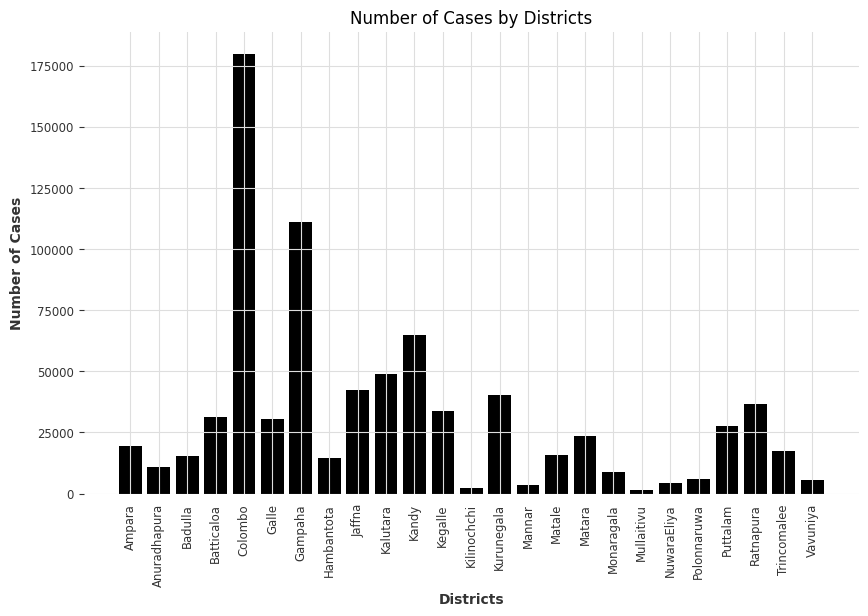

In [10]:
# Group by District and sum the Number of Cases
district_cases = df.groupby('District')['Number_of_Cases'].sum().reset_index()

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.bar(district_cases['District'], district_cases['Number_of_Cases'])
plt.xlabel('Districts')
plt.ylabel('Number of Cases')
plt.title('Number of Cases by Districts')
plt.xticks(rotation=90)
plt.show()


## 4. Minor pre-processing
1. Only taking single timestamp for each row. Either `Week_Start_Date` or `Week_Start_Date`. We gonna take `Week_End_Date`.
2. Convert the `Week_End_Date` to Python Datetime format.
3. Eliminate un-used features such as `Week_Start_Date`, `Month`, `Year`, and `Week`

In [11]:
df['Week_End_Date'] = pd.to_datetime(df['Week_End_Date'])

In [12]:
df.head()

,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


** The trend of cases of all 25 districts

In [13]:
import plotly.express as px

# List of all districts
districts = df['District'].unique()

for district in districts:
    # Filter data for the current district
    df_district = df[df['District'] == district]

    # Create an interactive line plot using Plotly without markers
    fig = px.line(
        df_district,
        x="Week_End_Date",
        y="Number_of_Cases",
        title=f"Number of Cases Over Time - {district}",
        labels={'Week_End_Date': 'Week End Date', 'Number_of_Cases': 'Number of Cases'}
    )

    # Customize the layout for a bigger and clearer plot
    fig.update_layout(
        width=1000,  # Width of the figure
        height=600,  # Height of the figure
        title_font_size=18,
        xaxis_title_font_size=14,
        yaxis_title_font_size=14,
        hovermode="x"  # Show hover data for the x-axis
    )

    # Show the interactive plot with zoom and pan features
    fig.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## 5. Modelling
List of regression models.
- RegressionModel
- LinearRegressionModel
- RandomForest
- LightGBMModel
- XGBModel
- CatBoostModel



In [14]:
from darts.models import RegressionModel, RandomForest, LinearRegressionModel, XGBModel, LightGBMModel, CatBoostModel
from sklearn.linear_model import Ridge
from darts.metrics import rmse, mae, smape, r2_score, rmsle
import plotly.graph_objects as go

In [15]:
!pip install "u8darts[all]"

In [34]:
reg = RegressionModel(
    lags = [-1, -2, -3, -52],
    model = Ridge(),
    output_chunk_length=12,  # Number of time steps predicted at once (per chunk) by the internal model.
)
lr  = LinearRegressionModel(
    lags = [-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

rf = RandomForest(
    lags = [-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

lgbm = LightGBMModel(
    lags = [-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)
xgb = XGBModel(
    lags = [-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)
cat = CatBoostModel(
    lags = [-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

In [35]:
models = [reg, lr, rf, lgbm, xgb, cat]

In [36]:
def save_model(model, model_name, district_name, folder='saved_models'):
    # Create directory if it doesn't exist
    os.makedirs(folder, exist_ok=True)

    # Define the model file path
    model_file = os.path.join(folder, f'{district_name}_{model_name}.pkl')

    # Save the model using pickle
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved for {district_name}: {model_file}")

In [37]:
def train_and_forecast(train_series, val_series, model, district_name):
    model.fit(train_series)

    model_folder = f"/content/drive/MyDrive/Models/{district_name}"
    # Save Model
    save_model(model, type(model).__name__, model_folder)

    # Forecast for the next 12 weeks
    forecast = model.predict(n=len(val_series))

    # Plot the results
    plt.figure(figsize=(12, 6))
    train_series.plot(label='Historical Data')
    val_series.plot(label='Validation Data', color='orange')
    forecast.plot(label='Forecast', color='green')
    plt.legend()
    plt.title(f"Forecast vs Validation for {district_name}")
    plt.show()

    # Calculate metrics
    val_values = val_series.values()
    forecast_values = forecast.values()

    # Ensure the forecast and validation values are the same length
    assert len(val_values) == len(forecast_values), "Forecast and validation series must have the same length for metrics calculation."

    # Compute metrics
    error_rmse = rmse(val_series, forecast)
    error_mae = mae(val_series, forecast)
    error_smape = smape(val_series, forecast)
    error_r2 = r2_score(val_series, forecast)
    error_rmsle = rmsle(val_series, forecast)

    errors = {
        "RMSE": error_rmse,
        "MAE": error_mae,
        "SMAPE": error_smape,
        "R2": error_r2,
        "RMSLE": error_rmsle
    }
    results = [forecast, errors]
    return results

In [38]:
def main(data, models):
    districts = data['District'].unique()
    final_output = []
    for district in districts:
      # Filter data for the specified district
      district_data = data[data['District'] == district]

      # Ensure the 'Week_End_Date' column is in datetime format
      district_data['Week_End_Date'] = pd.to_datetime(district_data['Week_End_Date'])

      # Prepare the data for ARIMA
      series = TimeSeries.from_dataframe(district_data, time_col='Week_End_Date', value_cols=['Number_of_Cases'])

      # Split series
      # Set aside the last 12 weeks as a validation series
      train_data, val_data = series[:-12], series[-12:]

      print(f"Training length: {len(train_data)}")
      print(f"Validation length: {len(val_data)}")
      district_output = []
      for m in models:
        result = train_and_forecast(train_data, val_data, m, district)
        district_output.append(result)

      final_output.append(district_output)

    return final_output


<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_RegressionModel.pkl


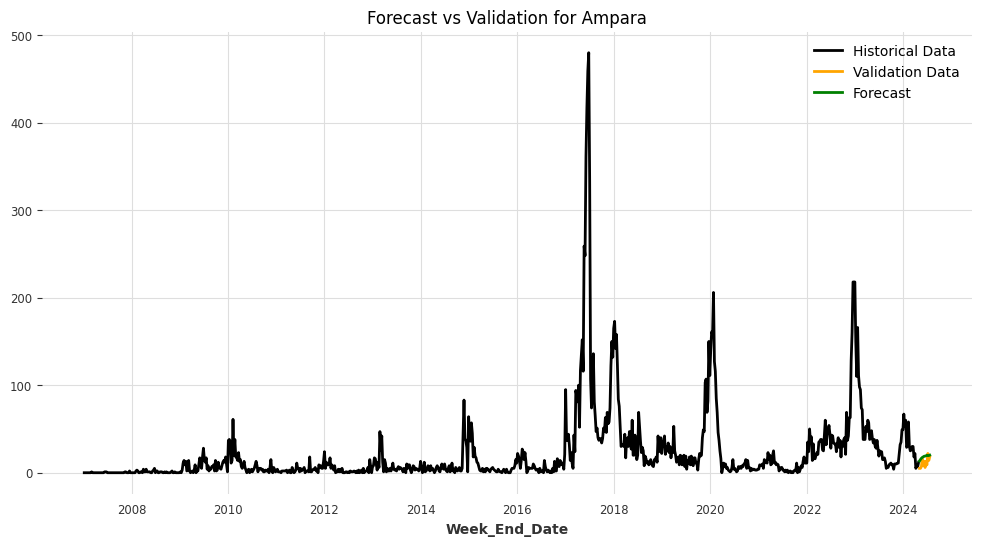

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_LinearRegressionModel.pkl


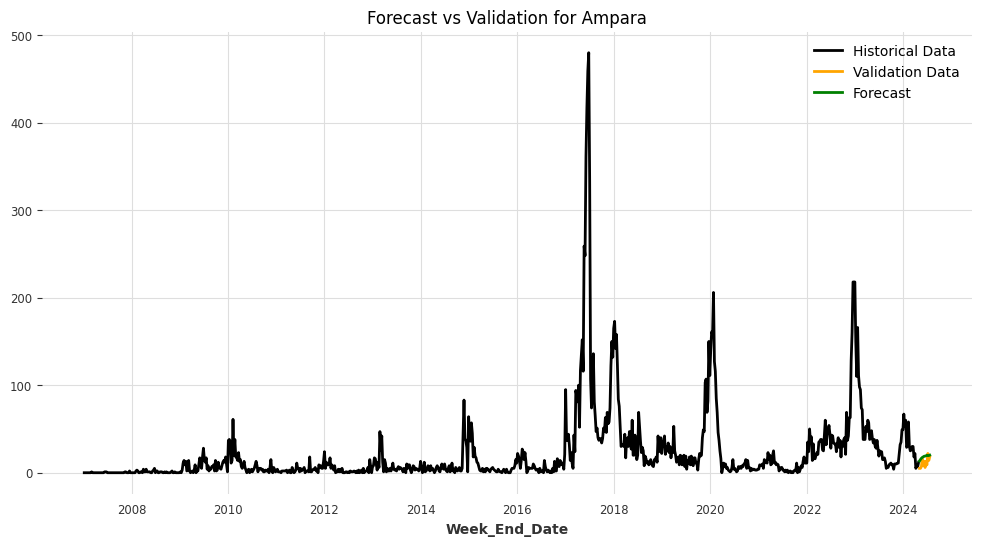

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_RandomForest.pkl


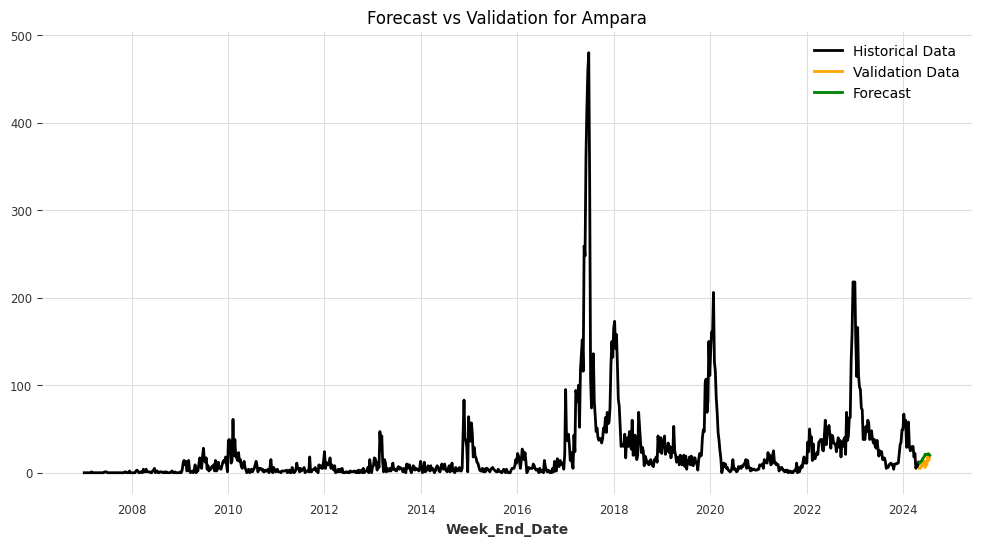

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 286
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 22.847800
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

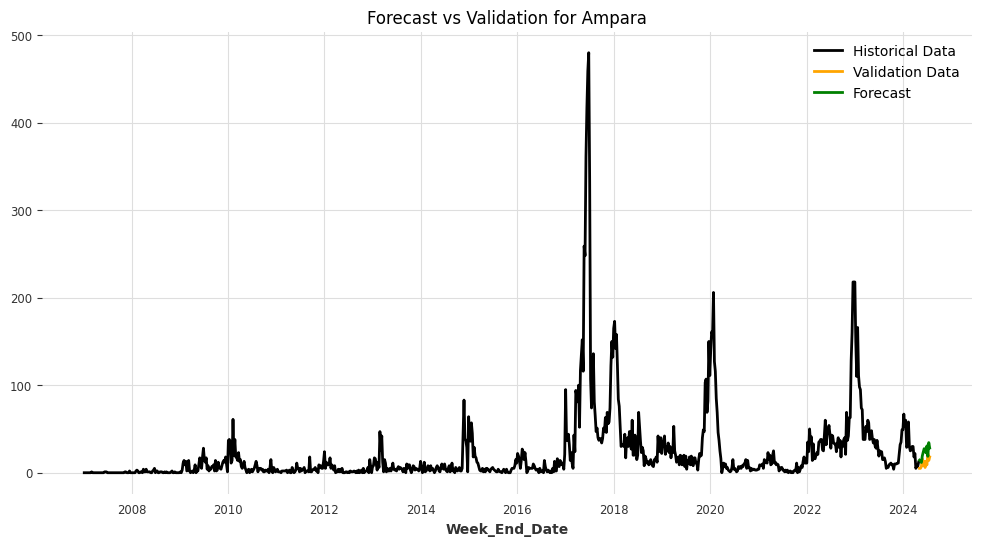

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_XGBModel.pkl


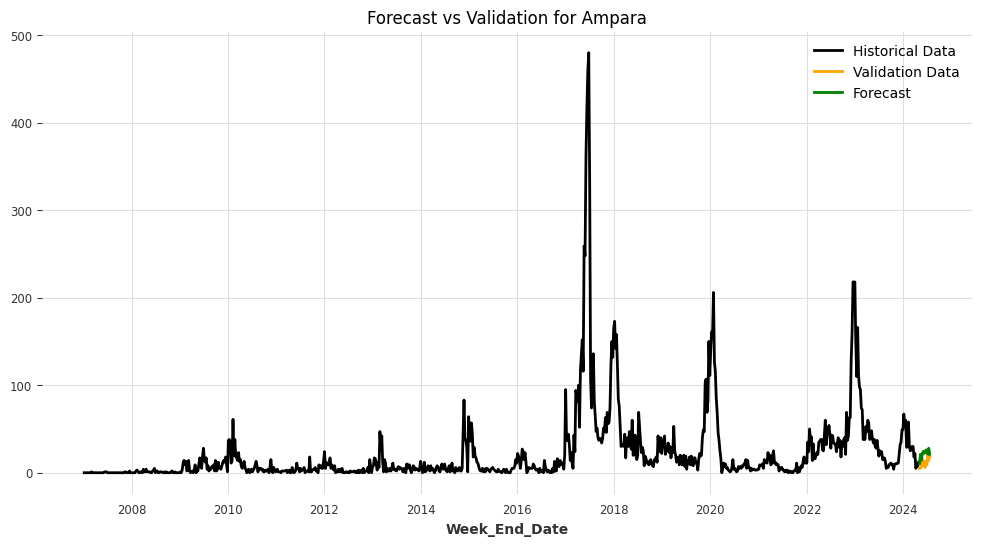

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_CatBoostModel.pkl


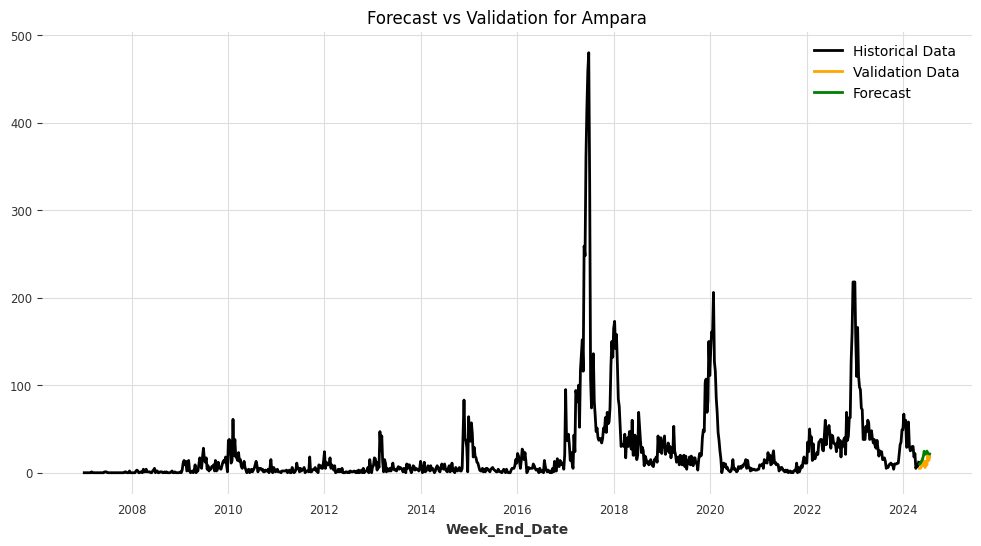

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_RegressionModel.pkl


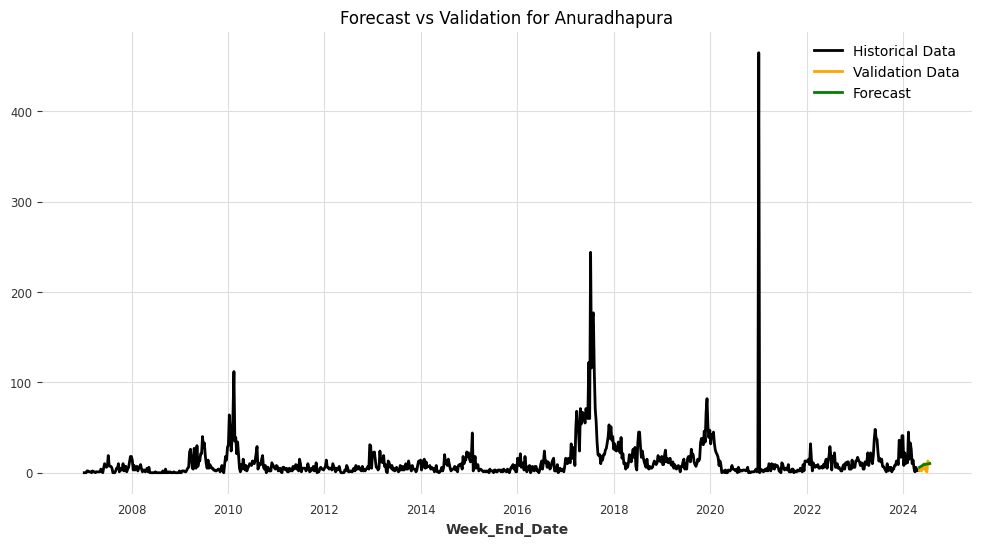

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_LinearRegressionModel.pkl


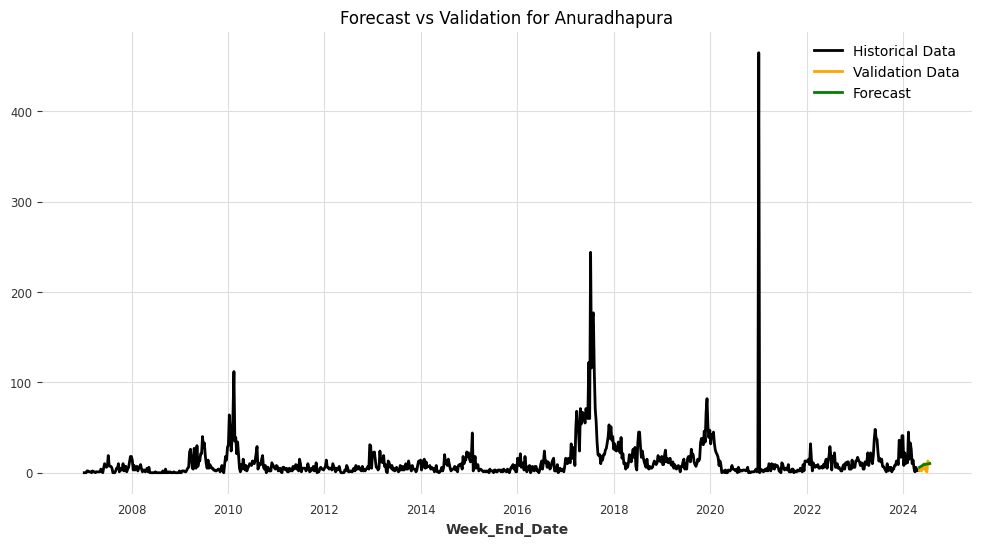

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_RandomForest.pkl


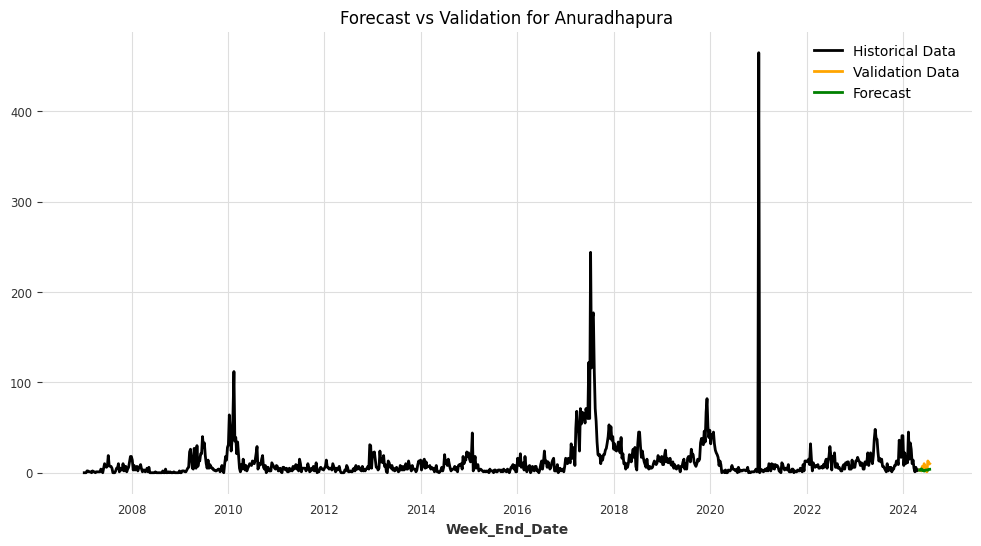

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 198
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 12.379310
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000082 seconds.
You can set `force_col_wise=true

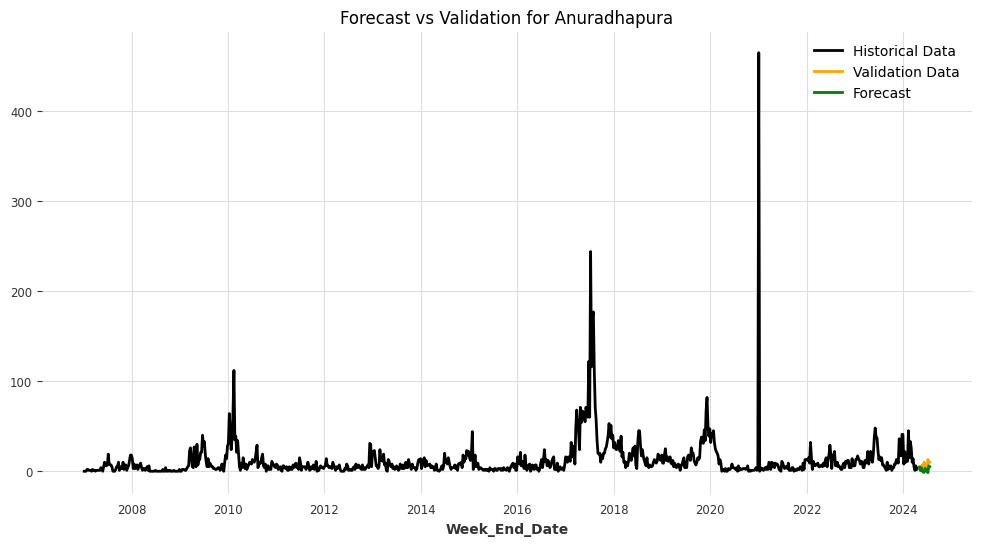

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_XGBModel.pkl


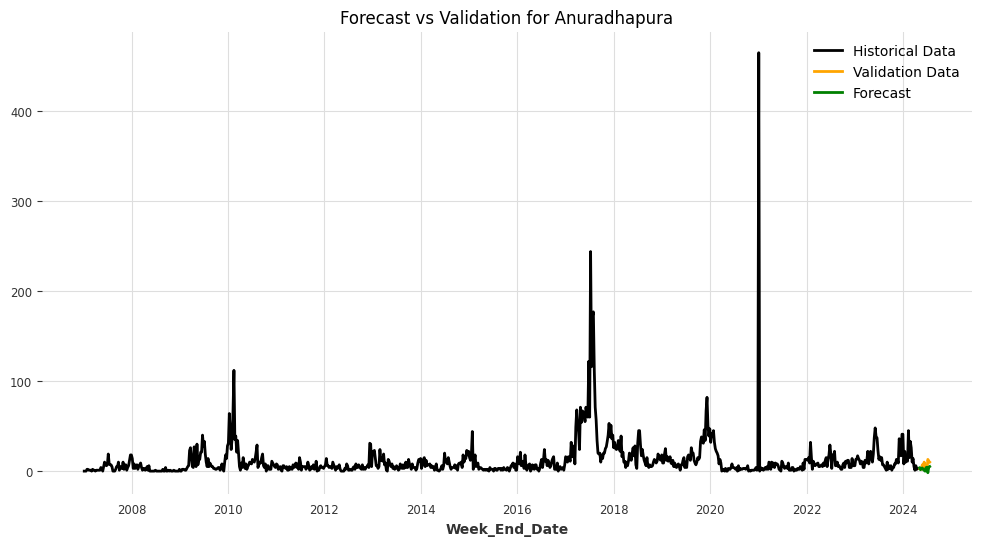

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_CatBoostModel.pkl


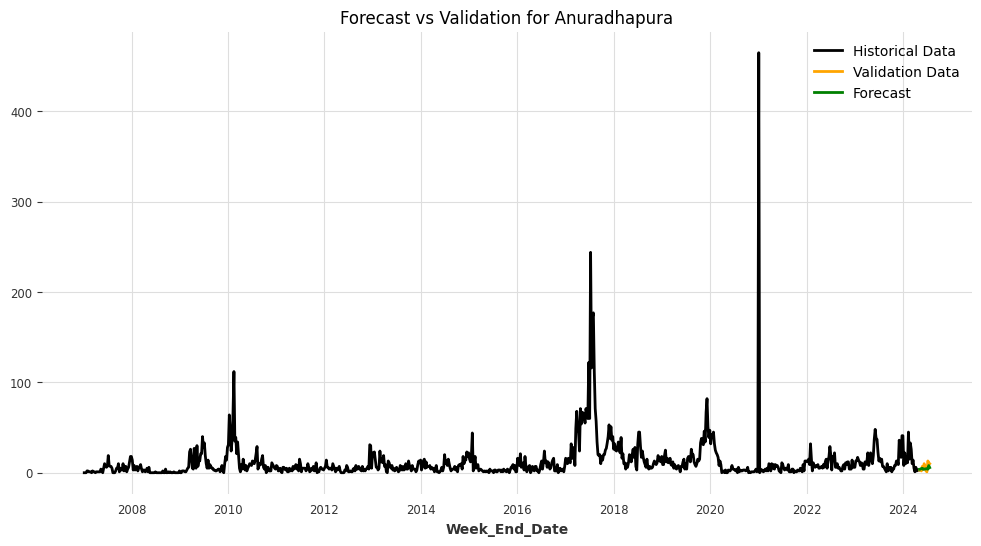

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_RegressionModel.pkl


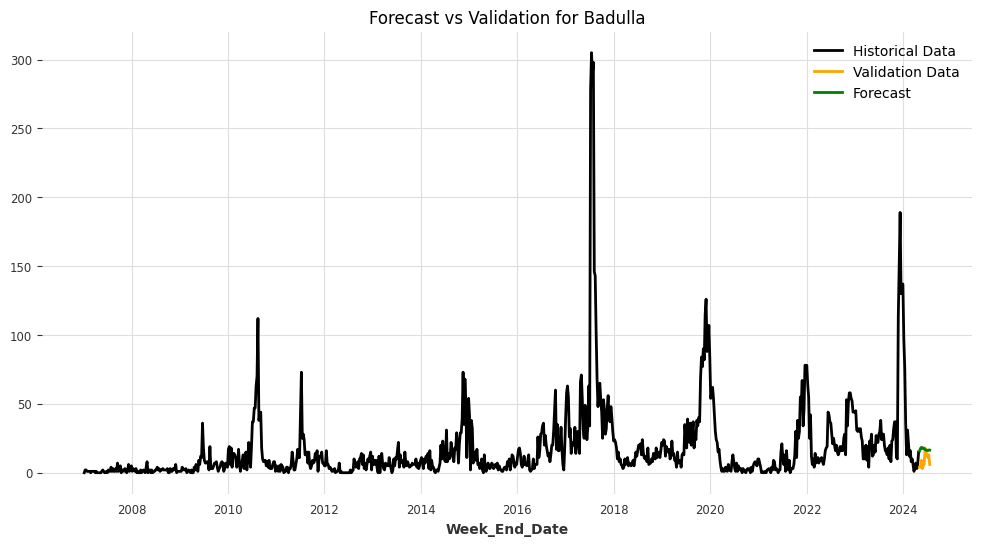

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_LinearRegressionModel.pkl


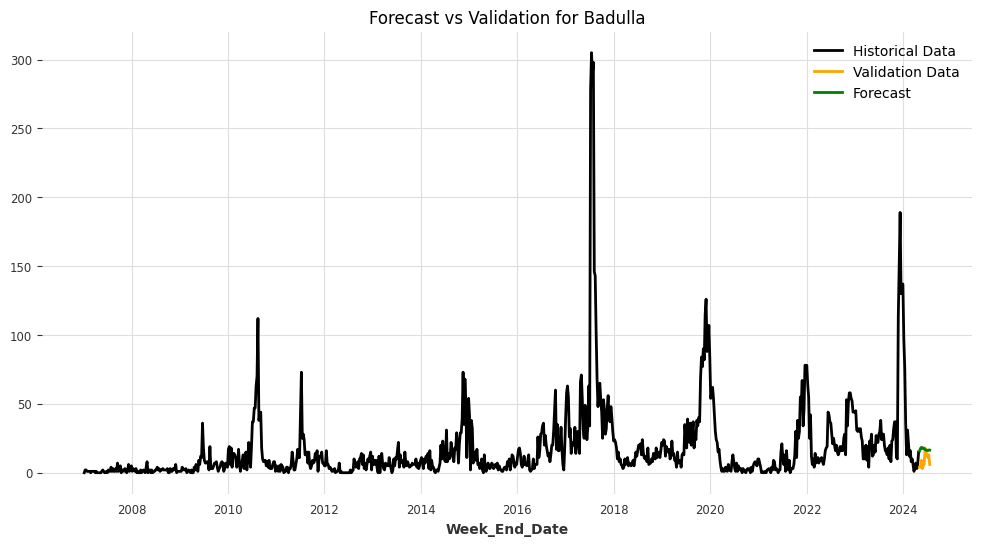

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_RandomForest.pkl


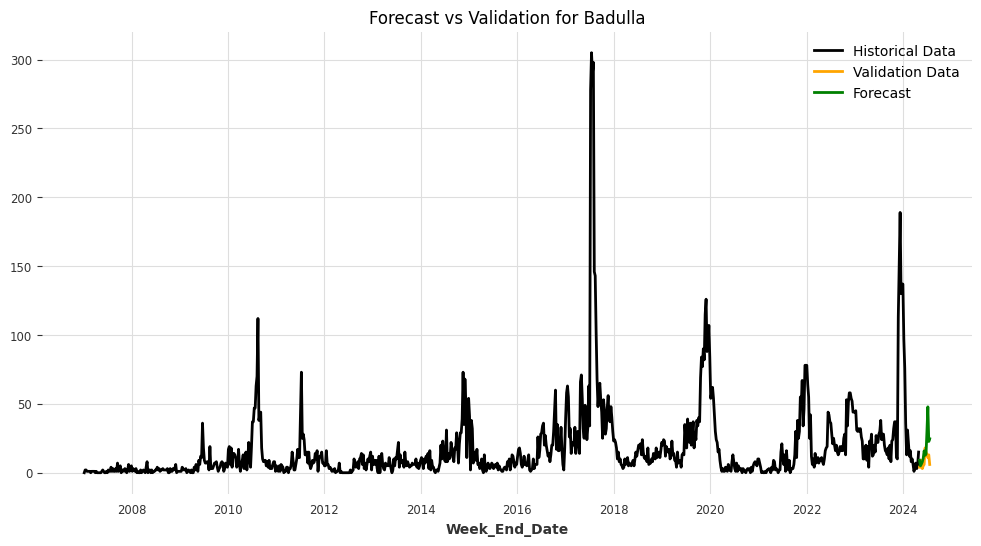

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 258
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 18.066587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 258
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 18.079667
[LightGBM] [Warning] N

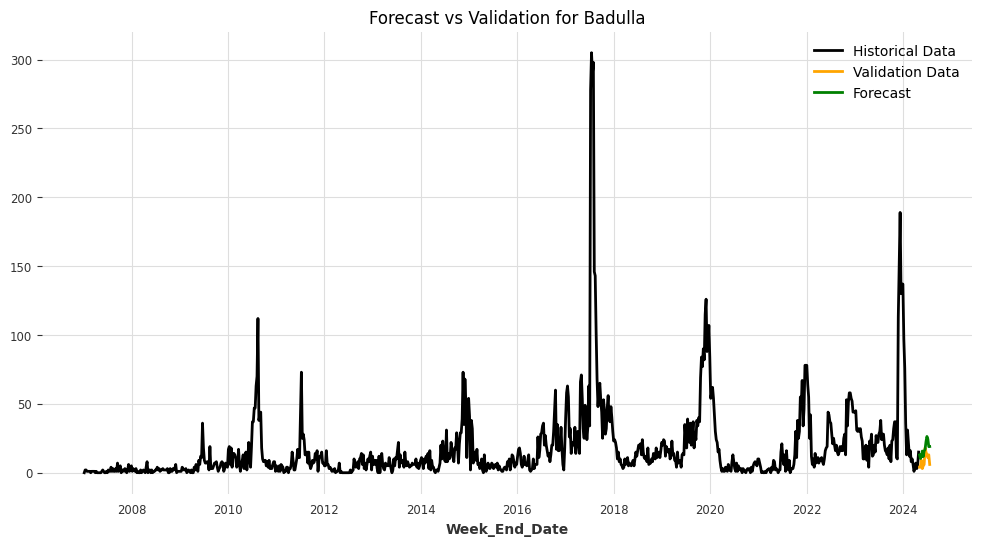

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_XGBModel.pkl


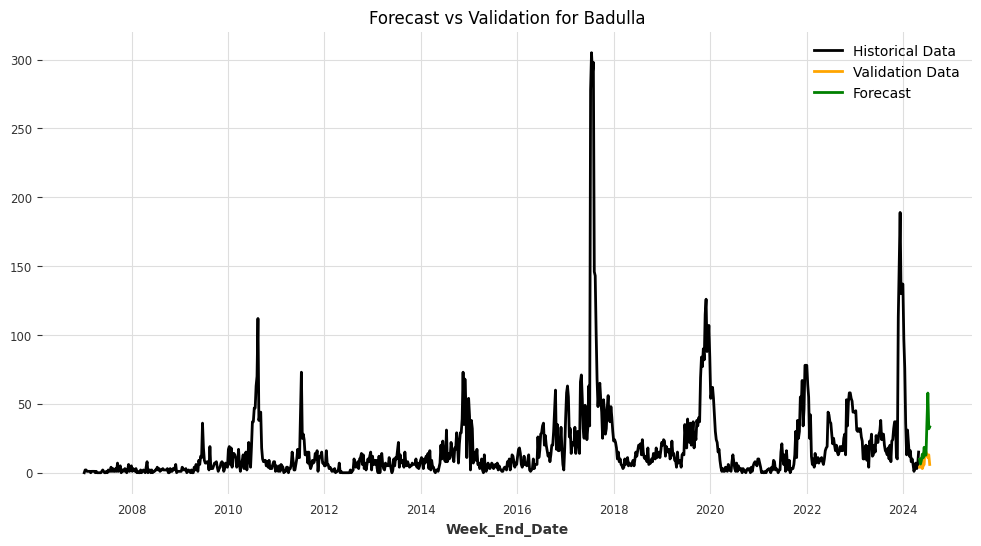

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_CatBoostModel.pkl


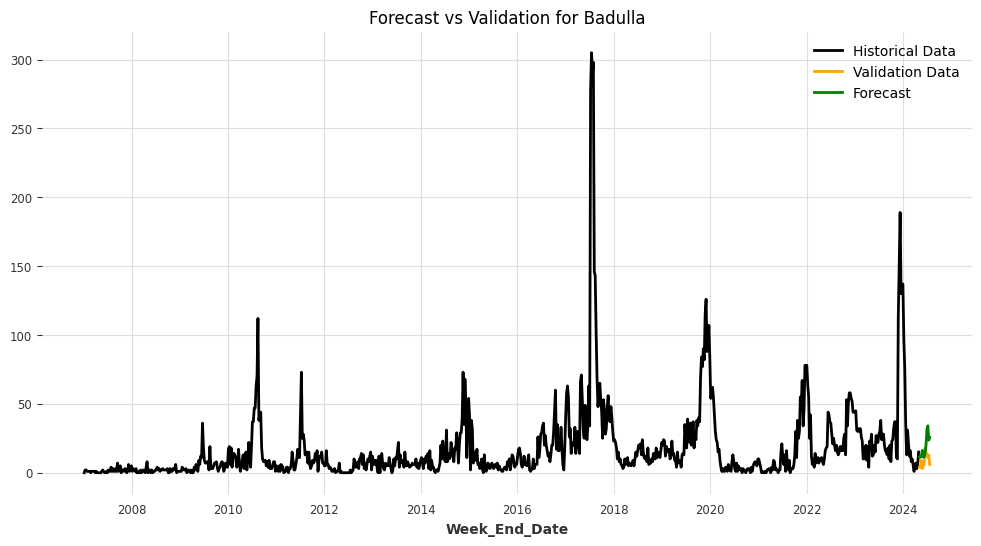

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_RegressionModel.pkl


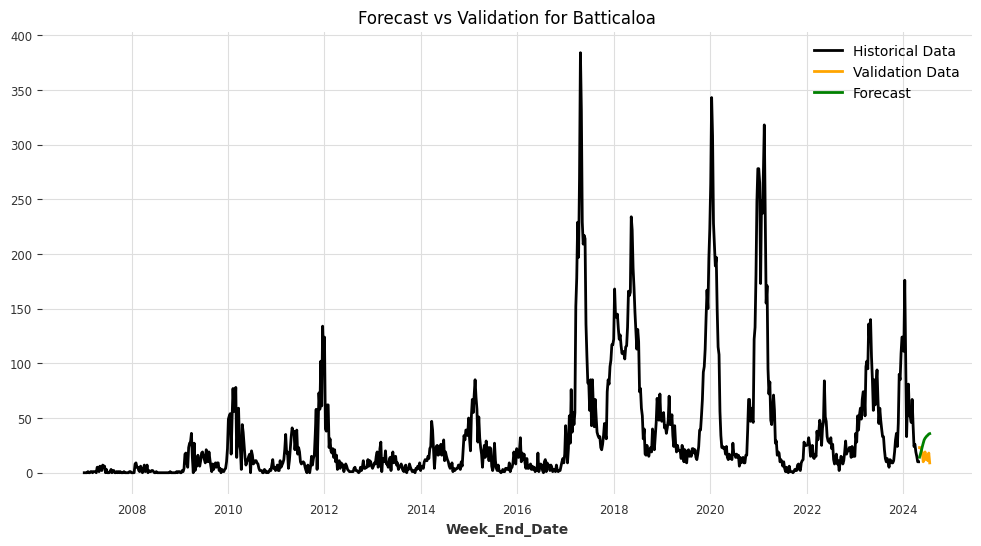

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_LinearRegressionModel.pkl


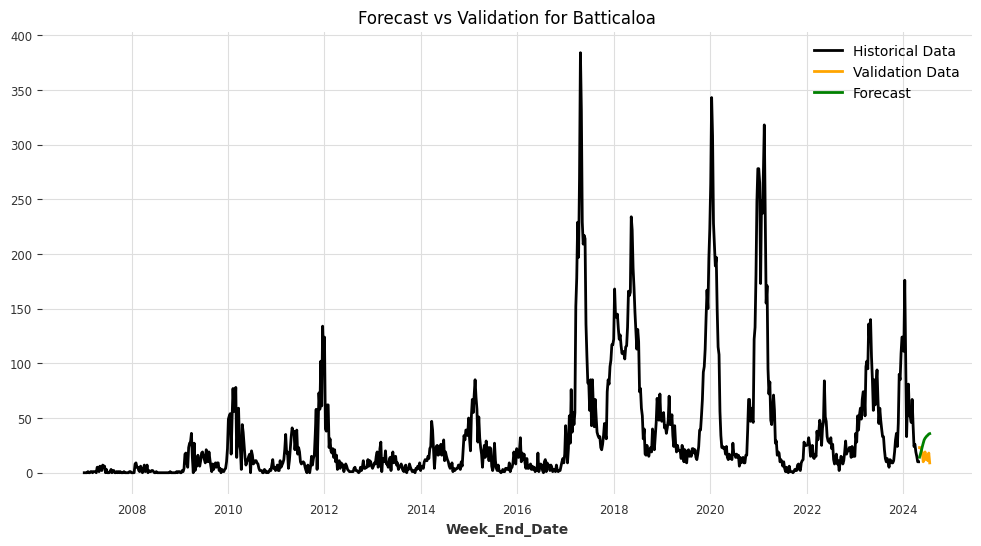

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_RandomForest.pkl


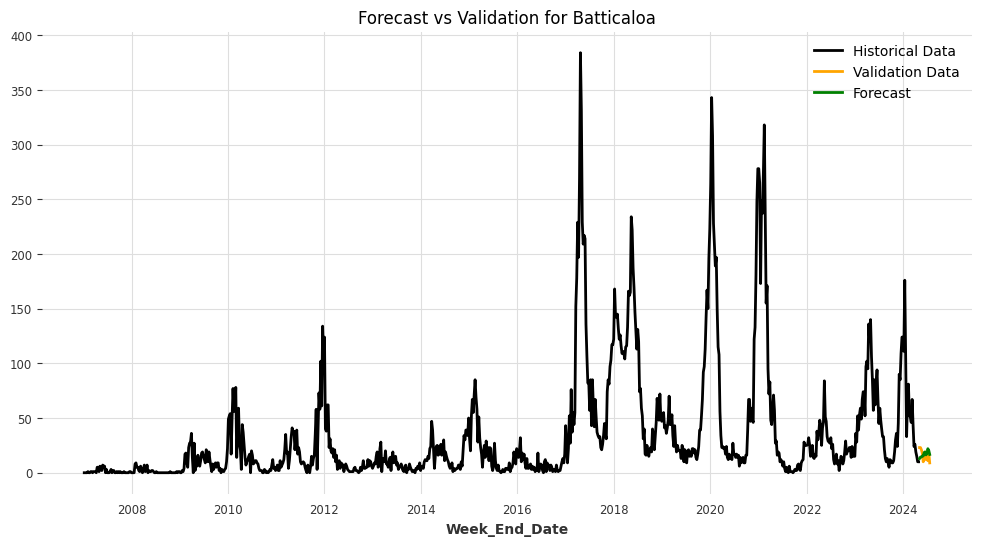

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 381
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 36.437574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the

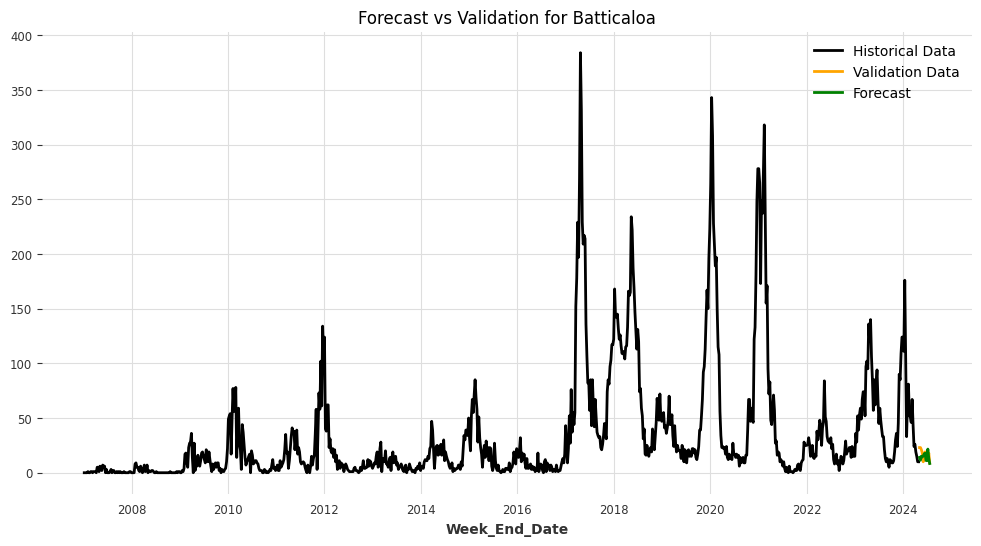

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_XGBModel.pkl


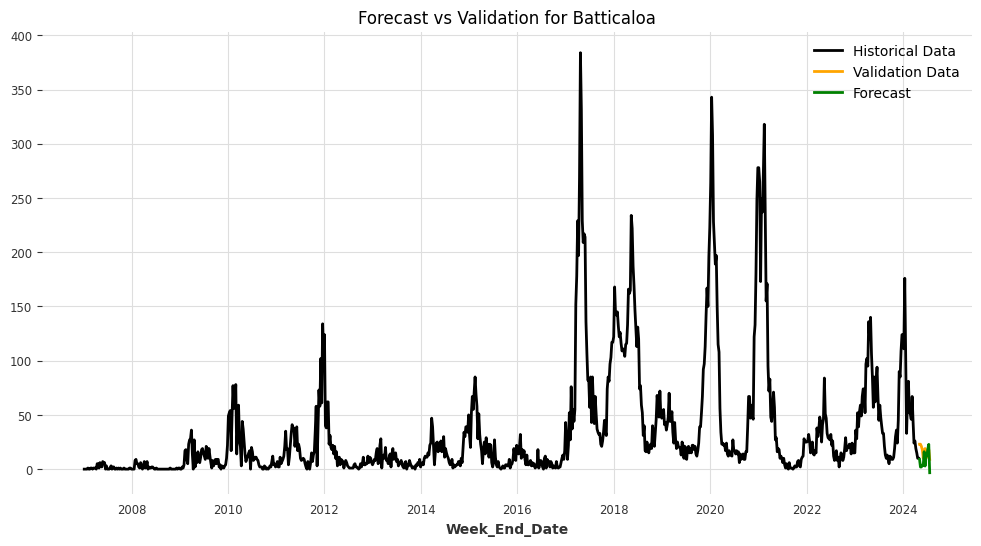

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_CatBoostModel.pkl


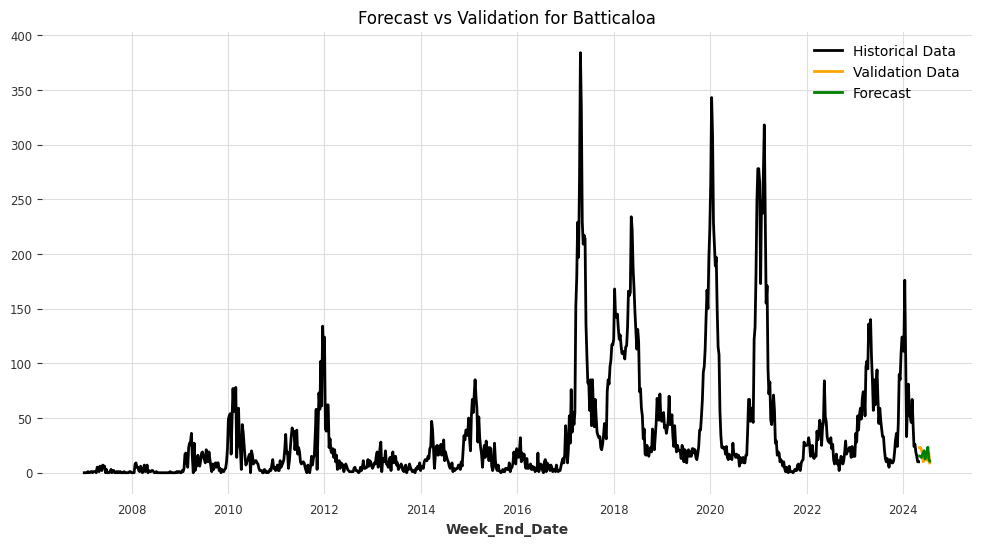

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_RegressionModel.pkl


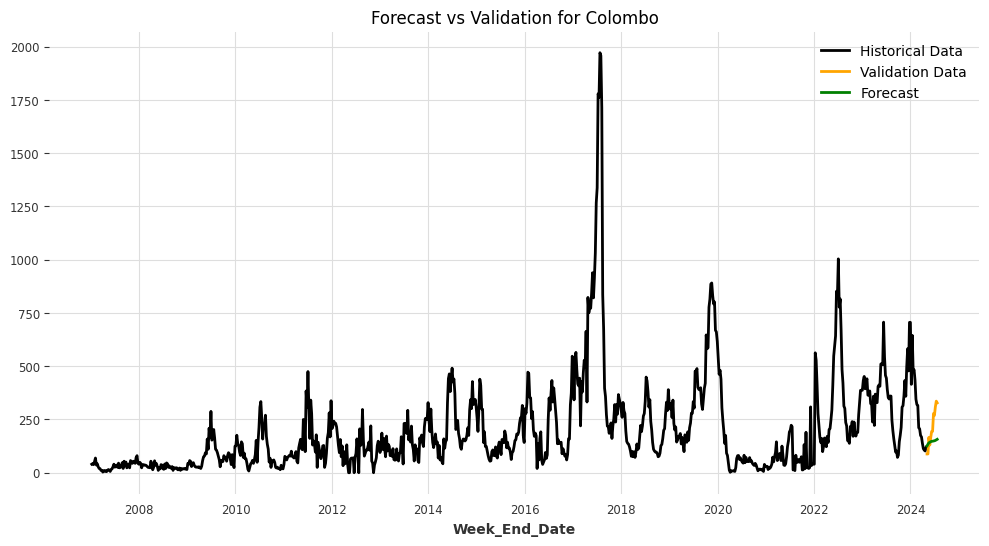

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_LinearRegressionModel.pkl


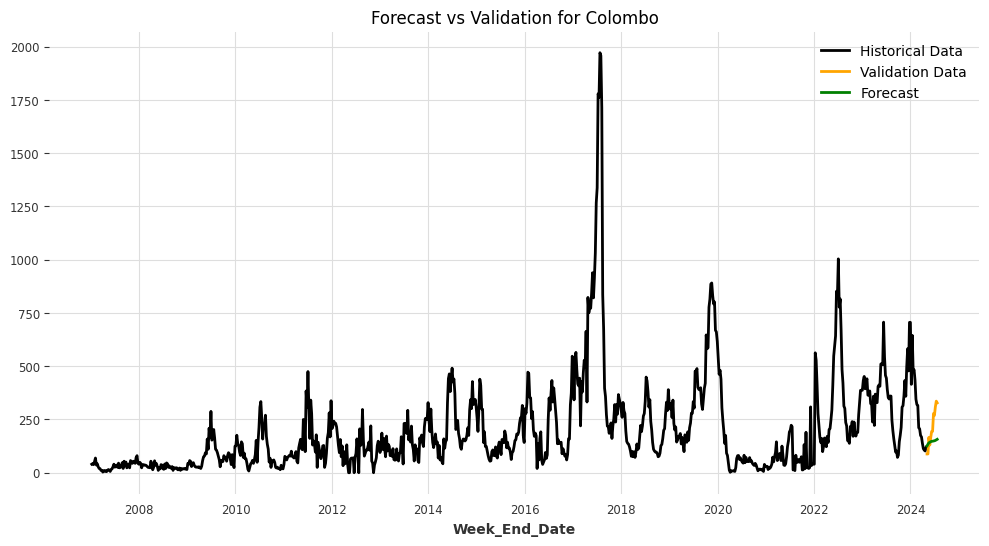

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_RandomForest.pkl


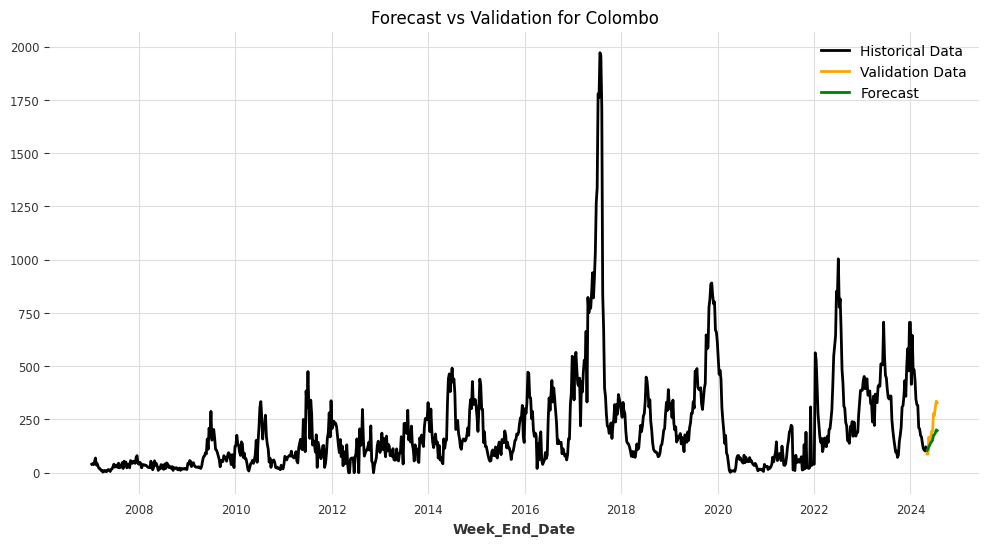

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 206.502973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 206.825208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000055 seconds.


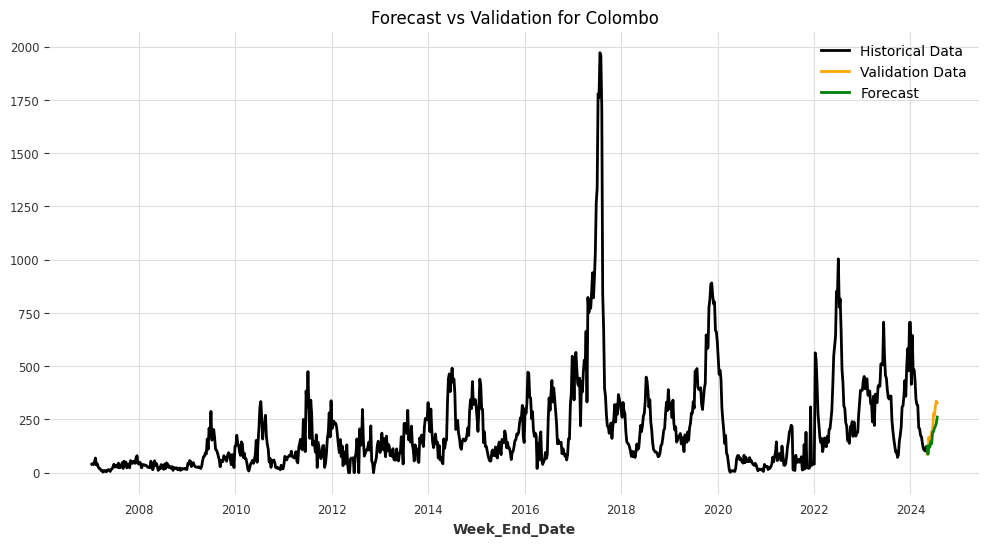

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_XGBModel.pkl


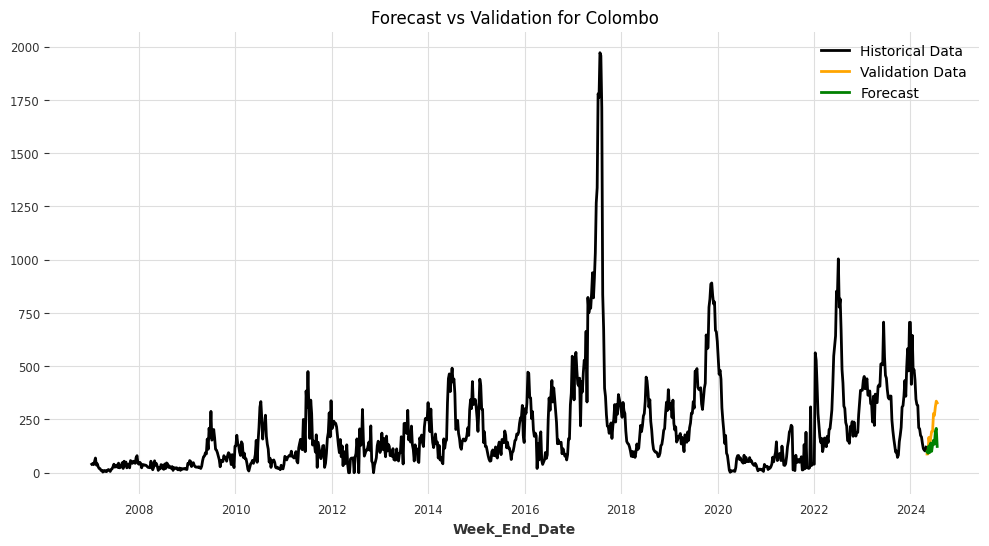

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_CatBoostModel.pkl


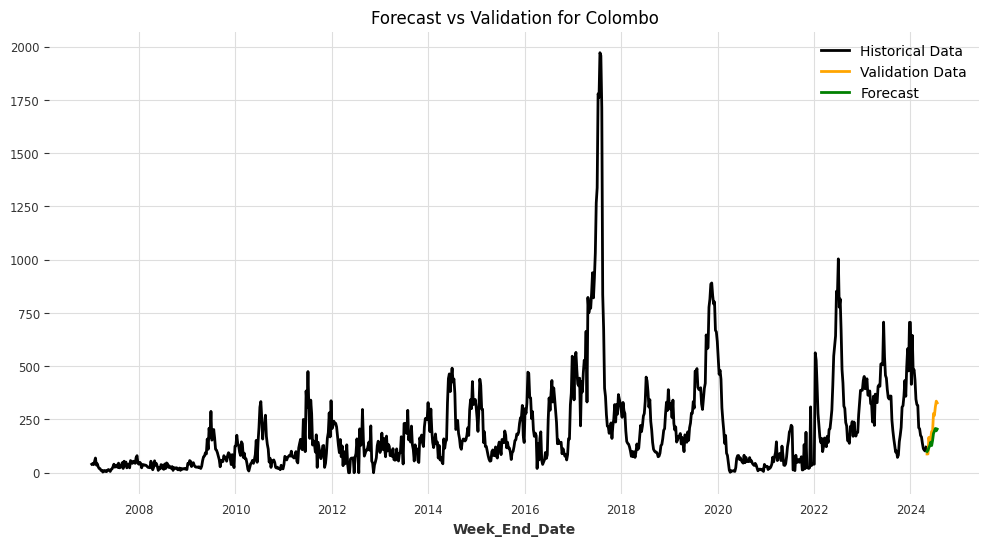

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_RegressionModel.pkl


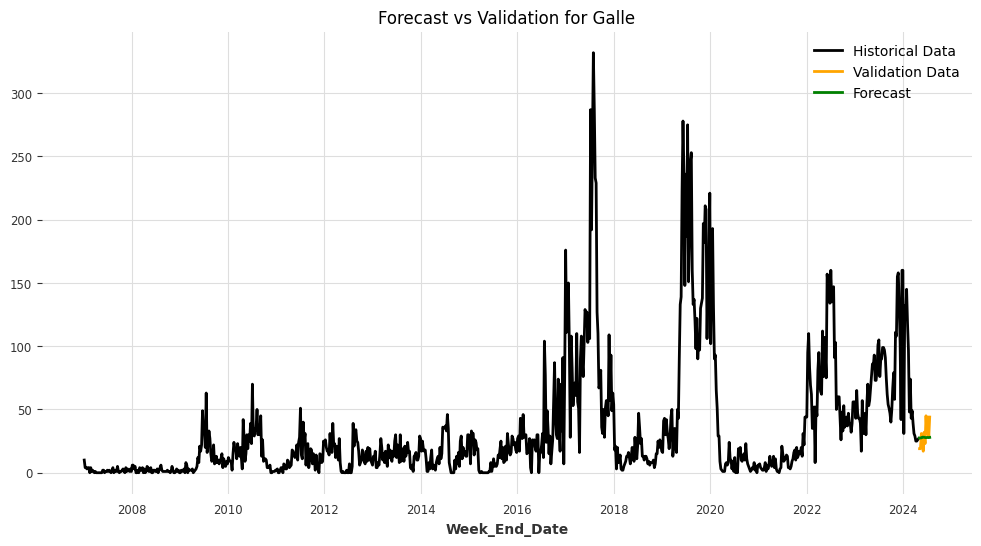

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_LinearRegressionModel.pkl


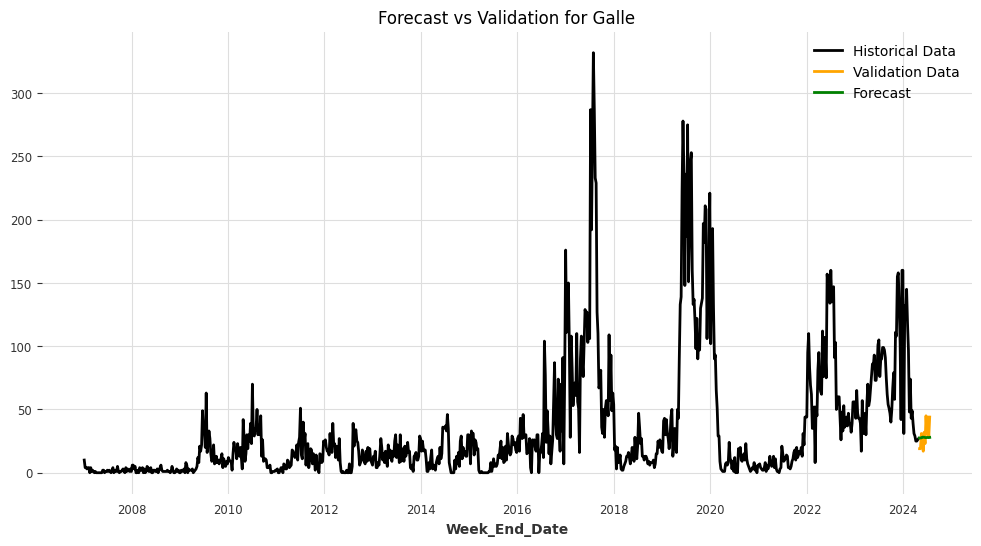

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_RandomForest.pkl


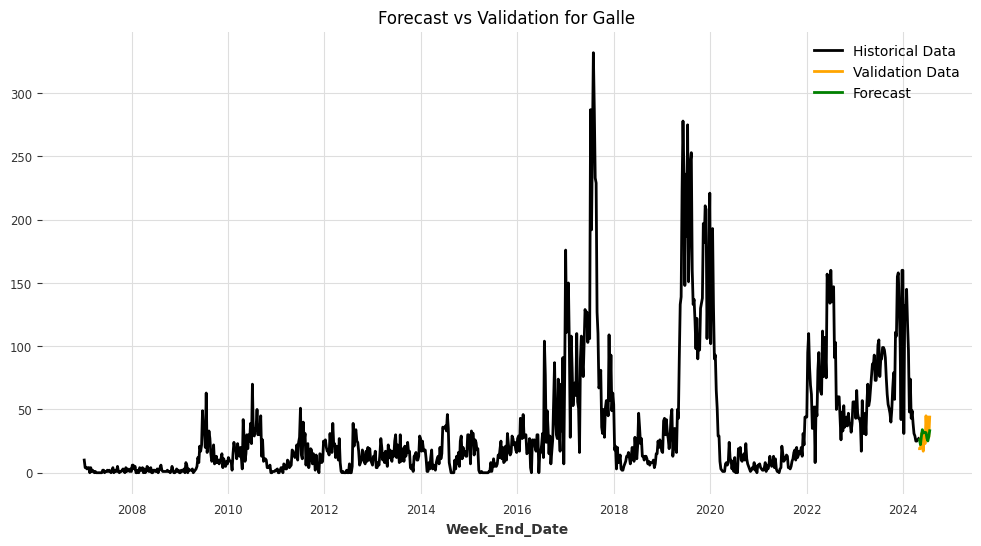

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000093 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 365
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 35.386445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 365
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 35.436385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

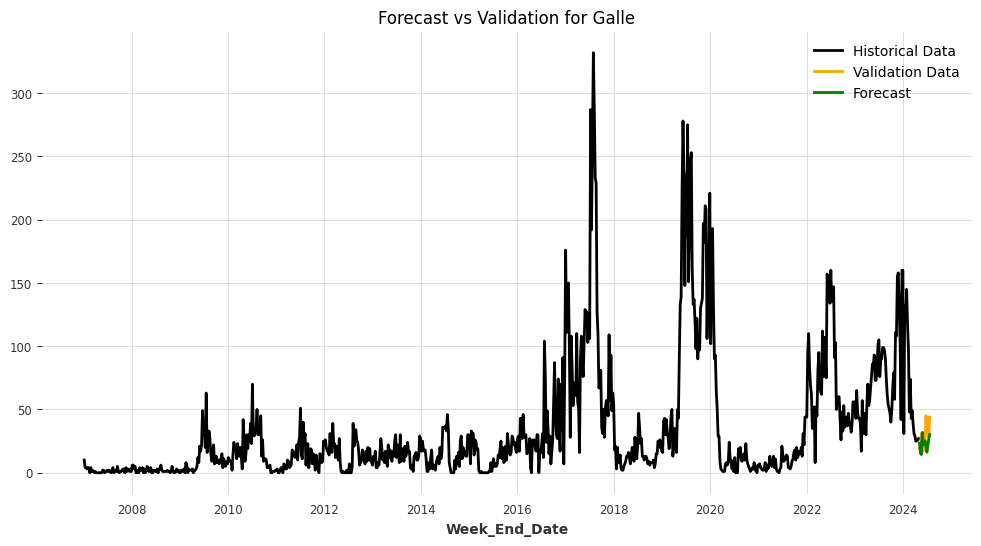

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_XGBModel.pkl


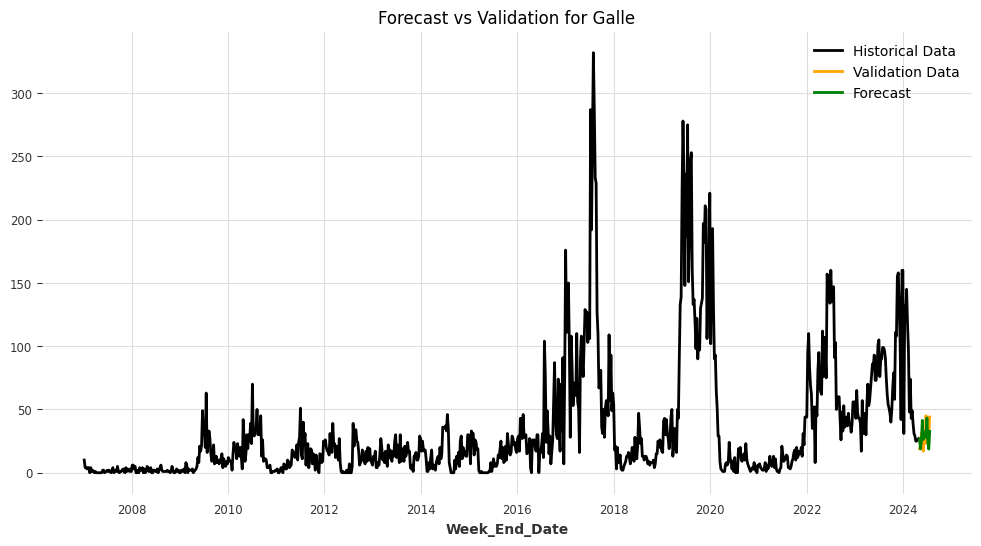

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_CatBoostModel.pkl


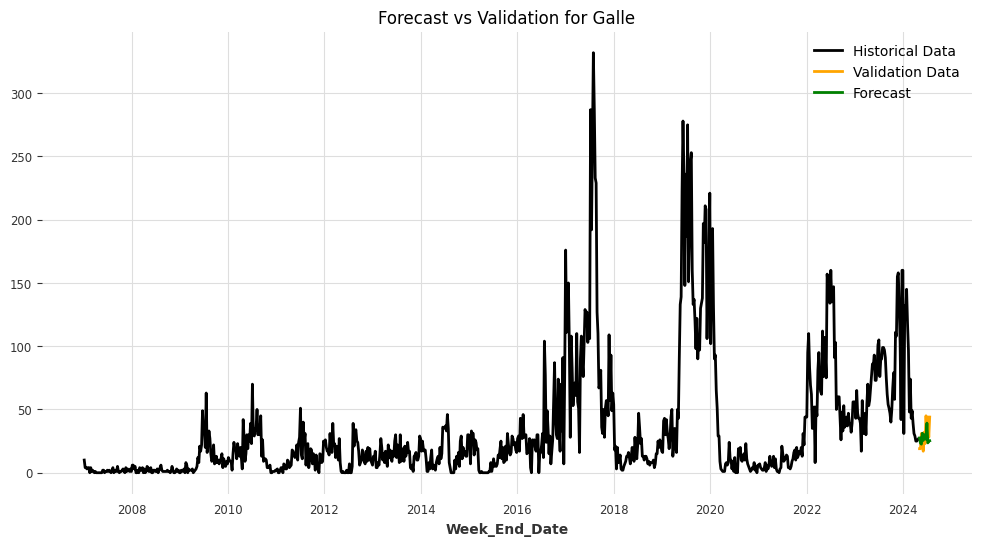

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_RegressionModel.pkl


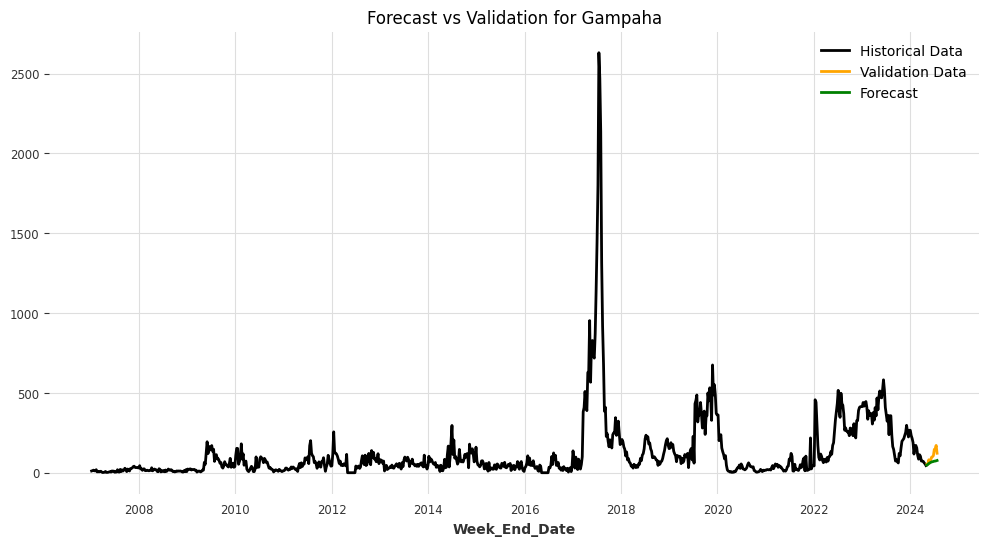

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_LinearRegressionModel.pkl


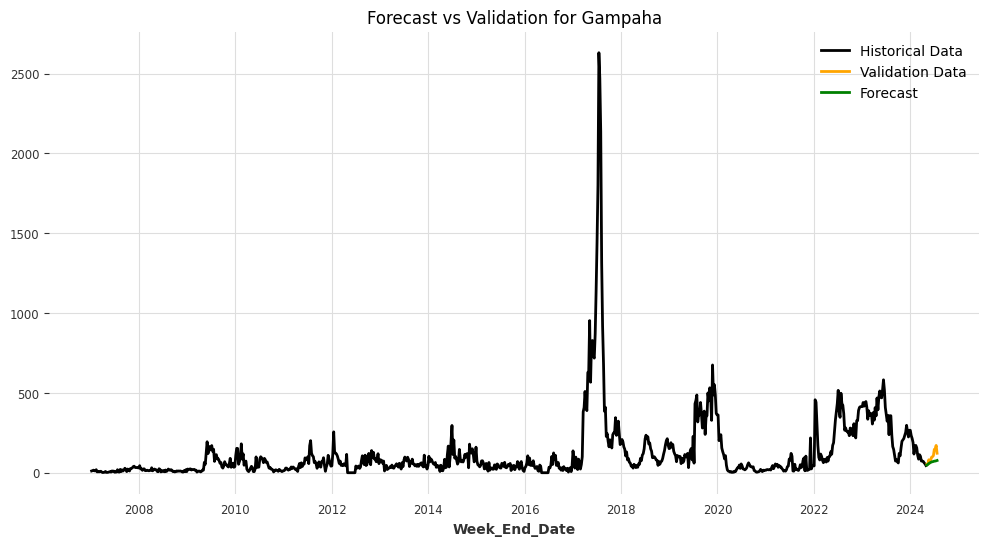

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_RandomForest.pkl


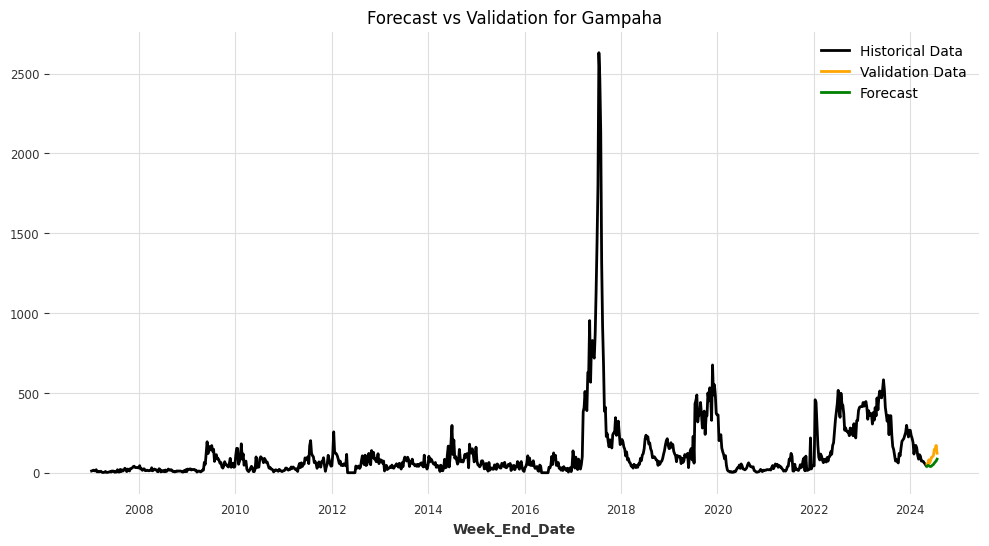

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 958
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 128.568371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 958
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 128.701546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Au

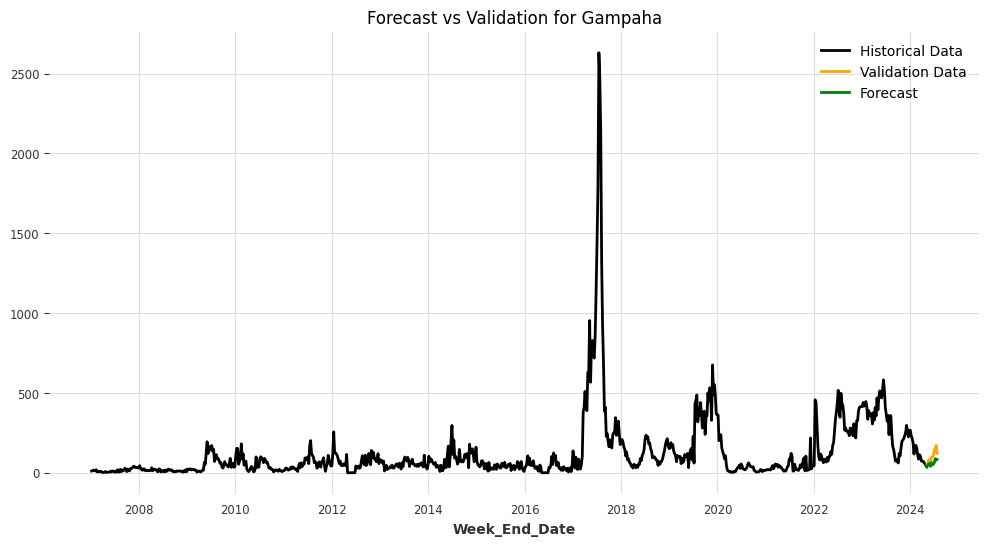

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_XGBModel.pkl


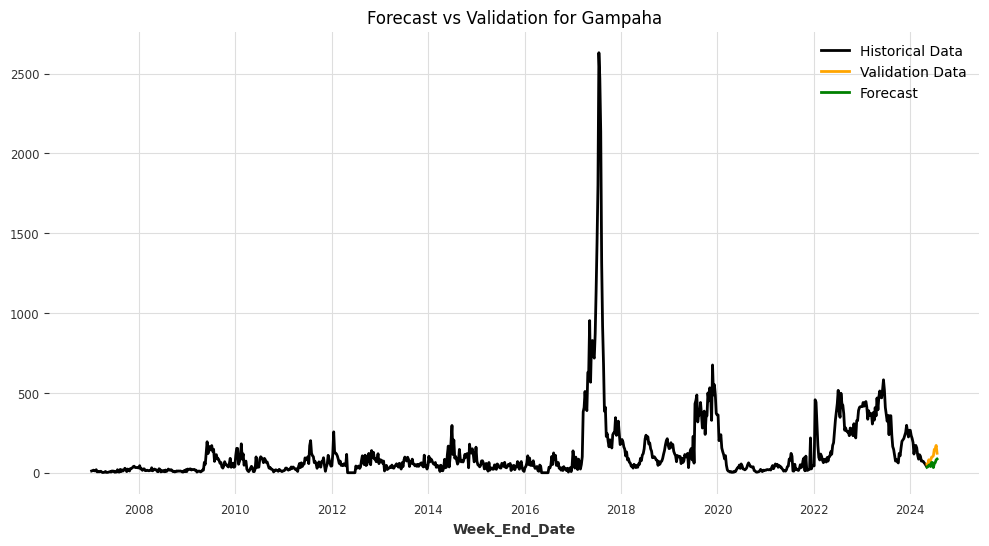

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_CatBoostModel.pkl


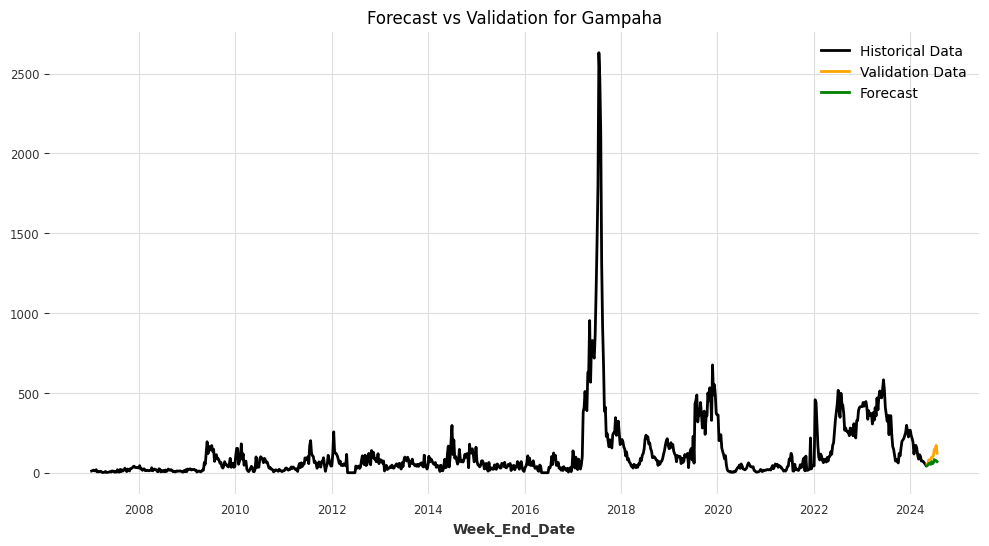

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_RegressionModel.pkl


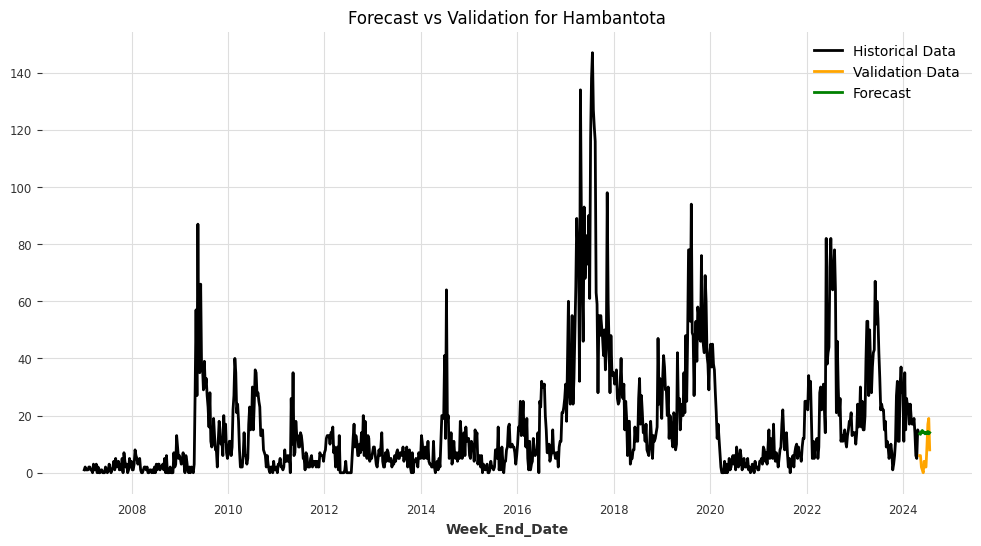

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_LinearRegressionModel.pkl


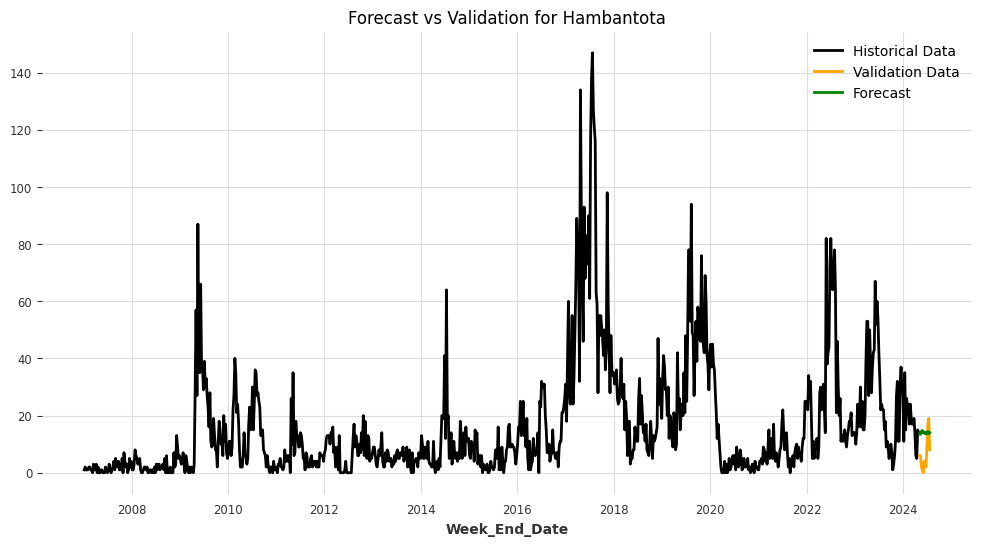

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_RandomForest.pkl


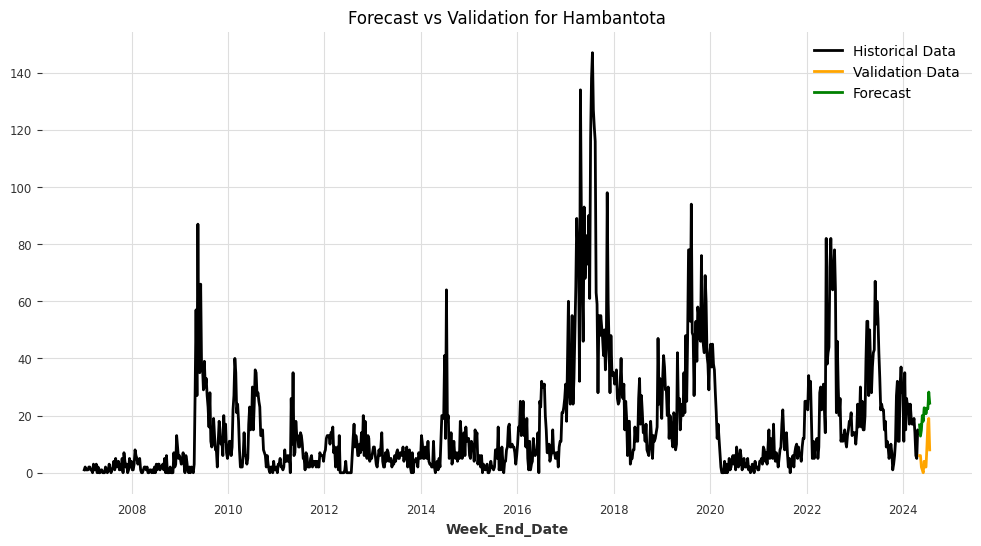

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 251
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 16.916766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000061 seconds.
You can set `force_col_wise=true

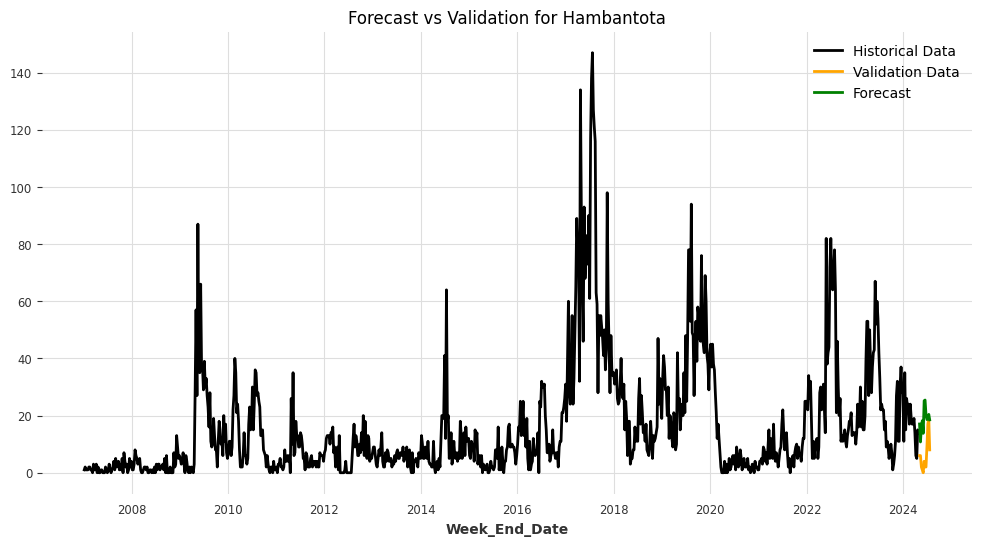

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_XGBModel.pkl


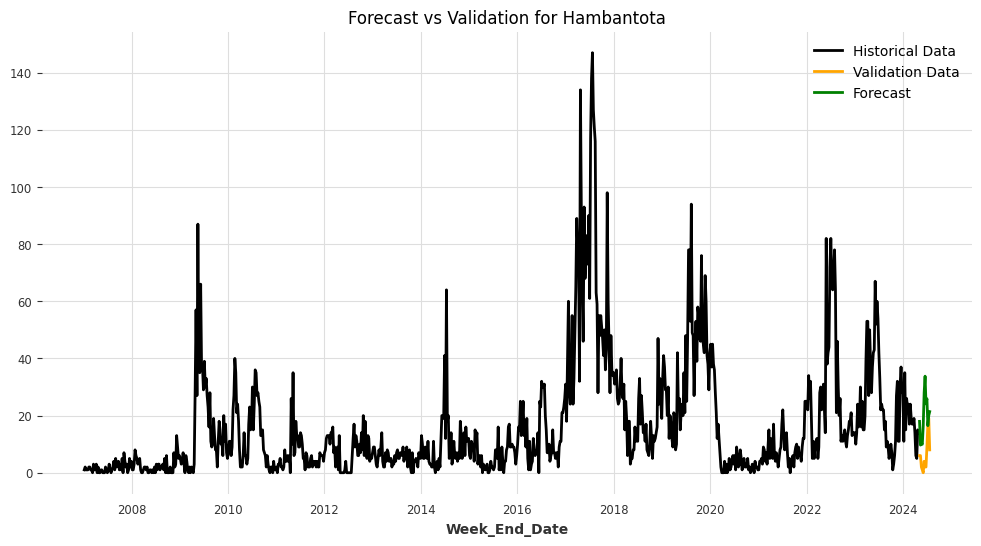

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_CatBoostModel.pkl


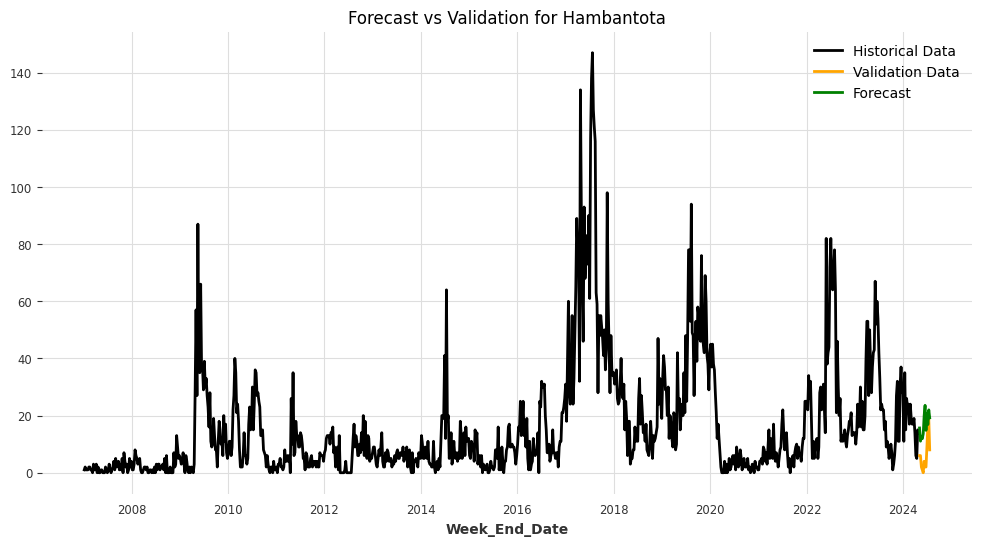

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_RegressionModel.pkl


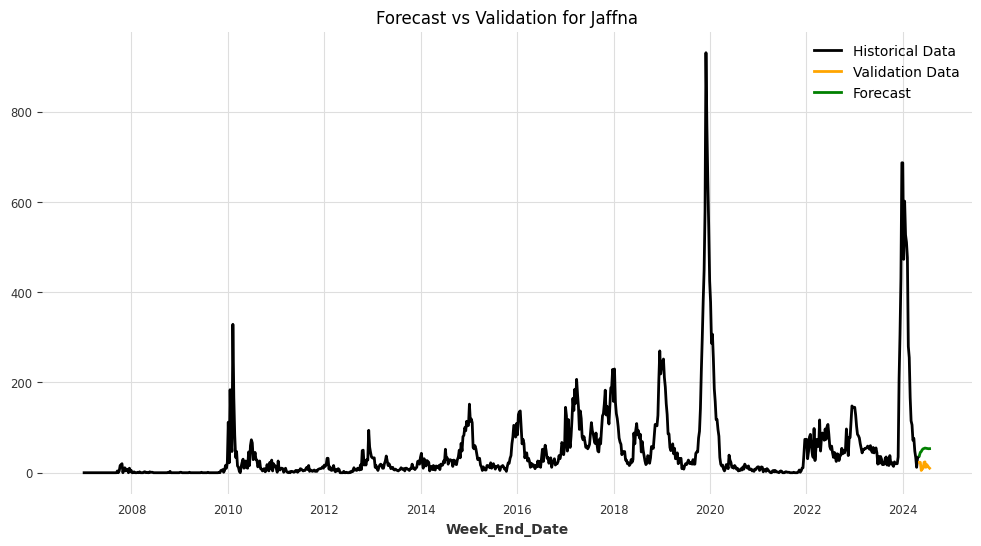

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_LinearRegressionModel.pkl


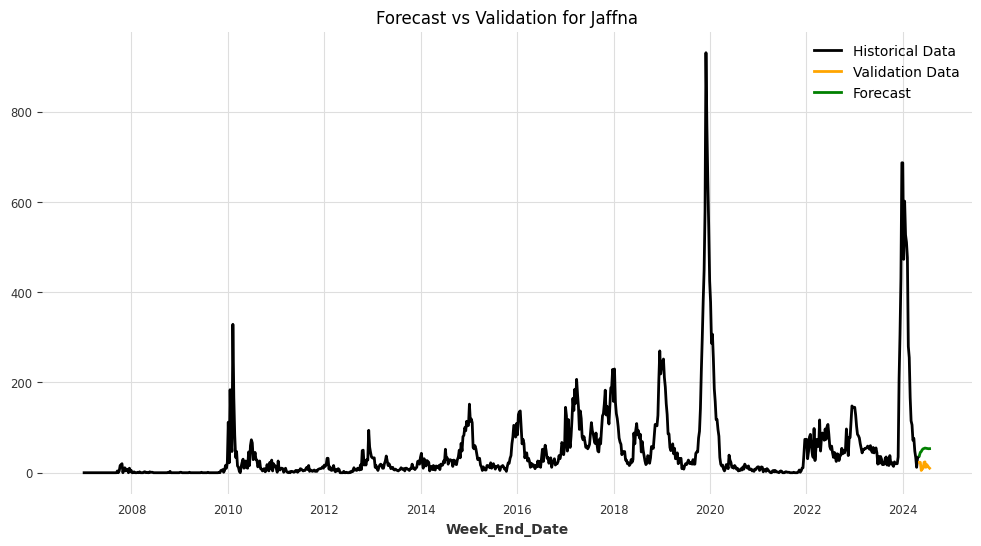

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_RandomForest.pkl


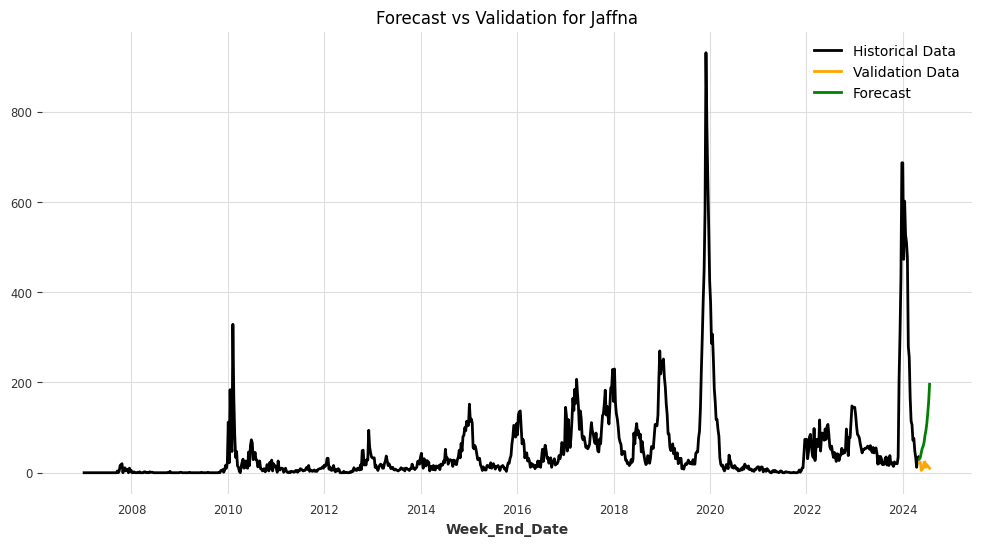

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 407
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 48.807372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

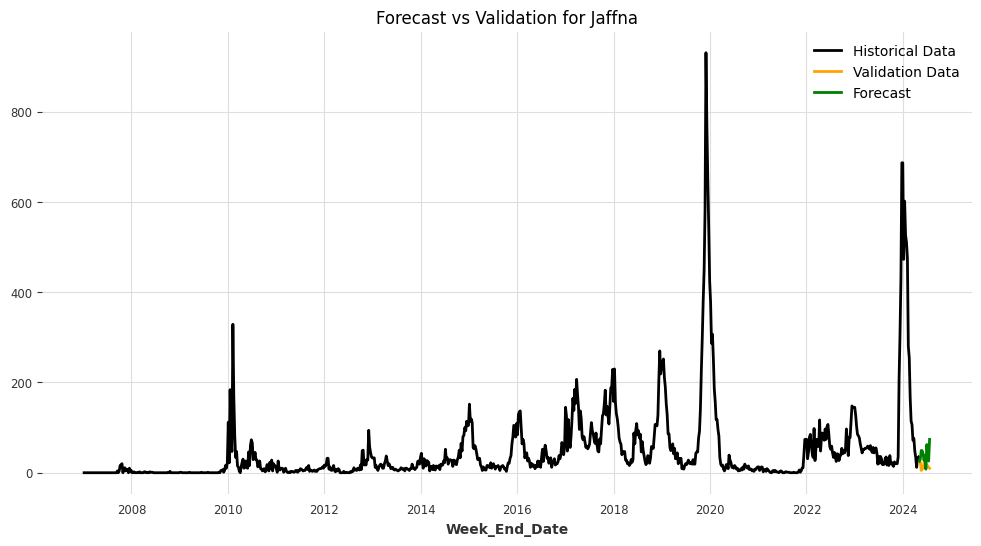

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_XGBModel.pkl


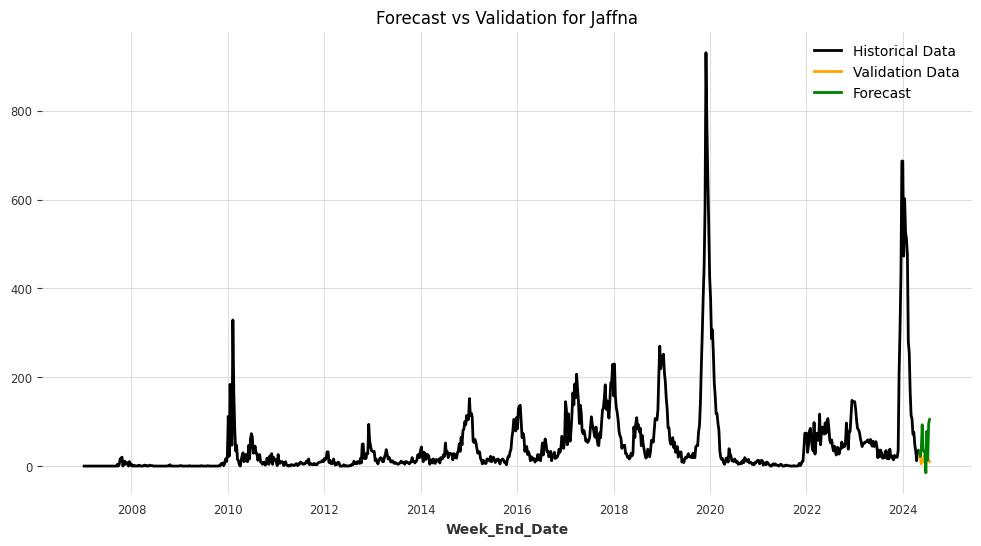

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_CatBoostModel.pkl


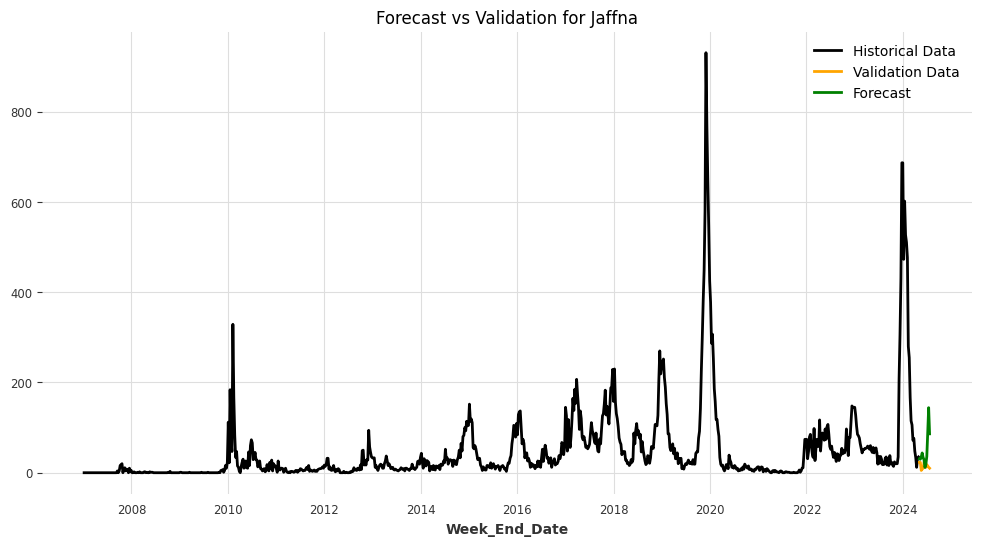

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_RegressionModel.pkl


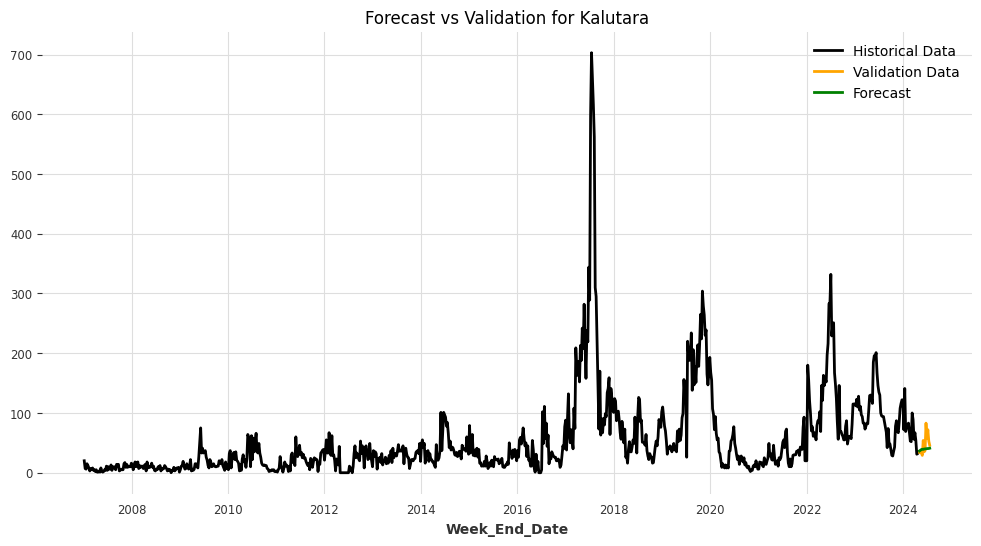

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_LinearRegressionModel.pkl


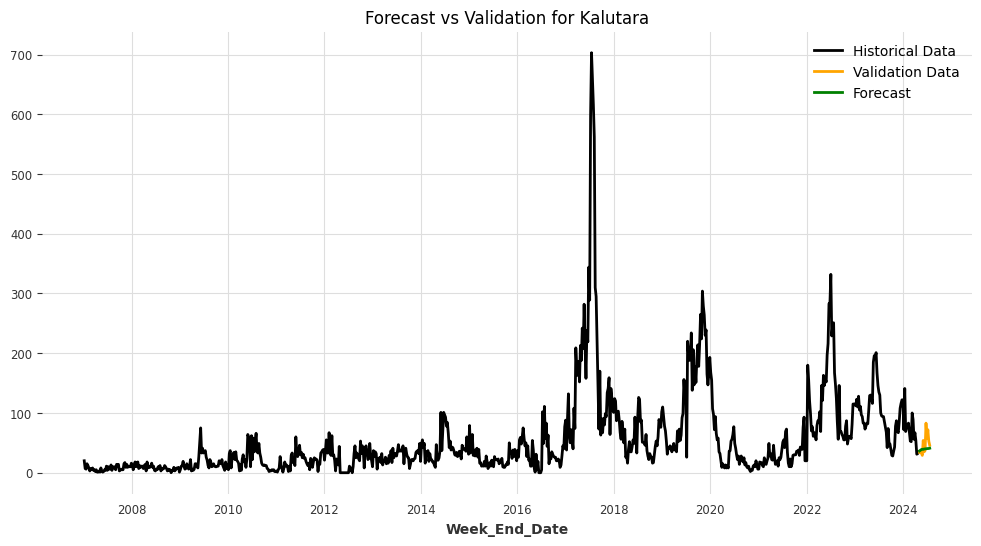

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_RandomForest.pkl


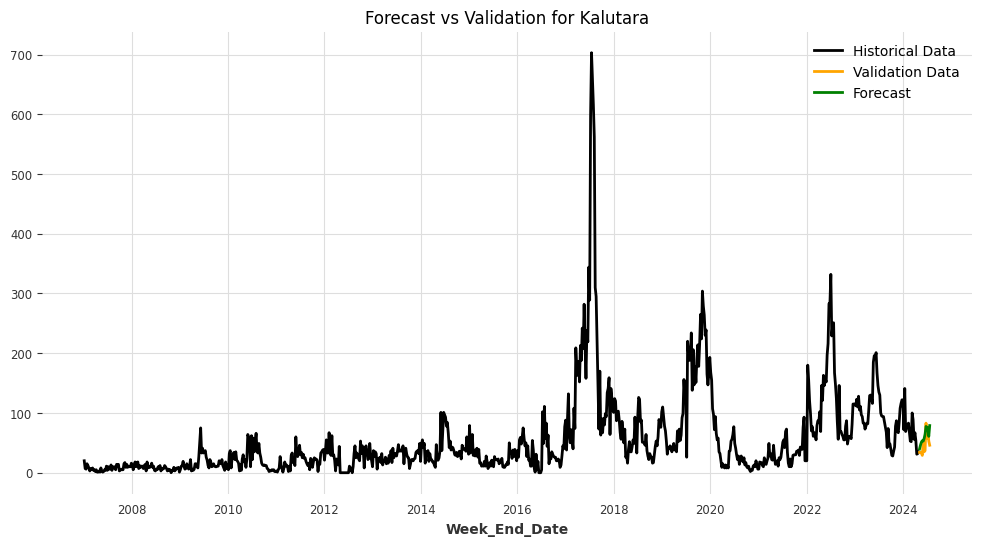

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 481
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 56.073722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 481
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 56.139120
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

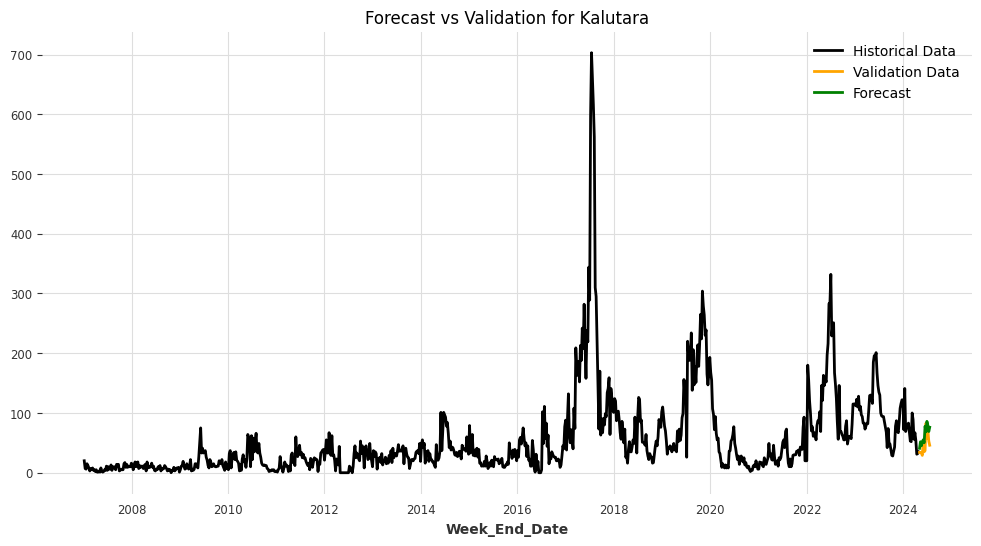

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_XGBModel.pkl


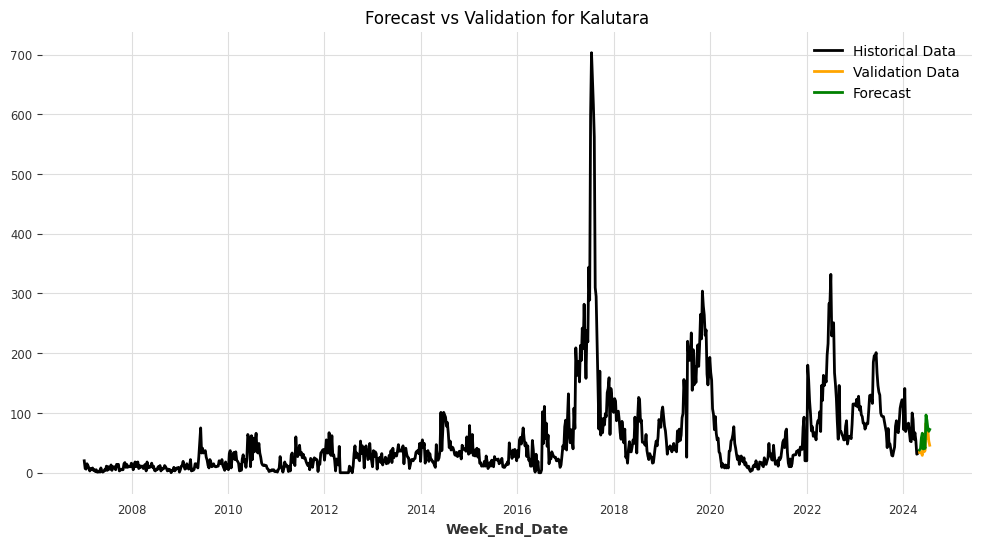

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_CatBoostModel.pkl


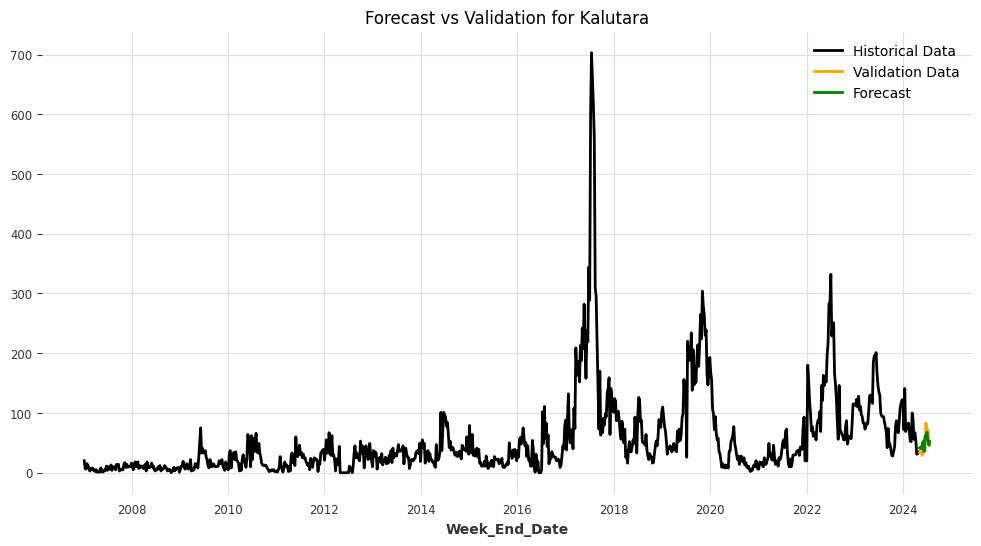

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_RegressionModel.pkl


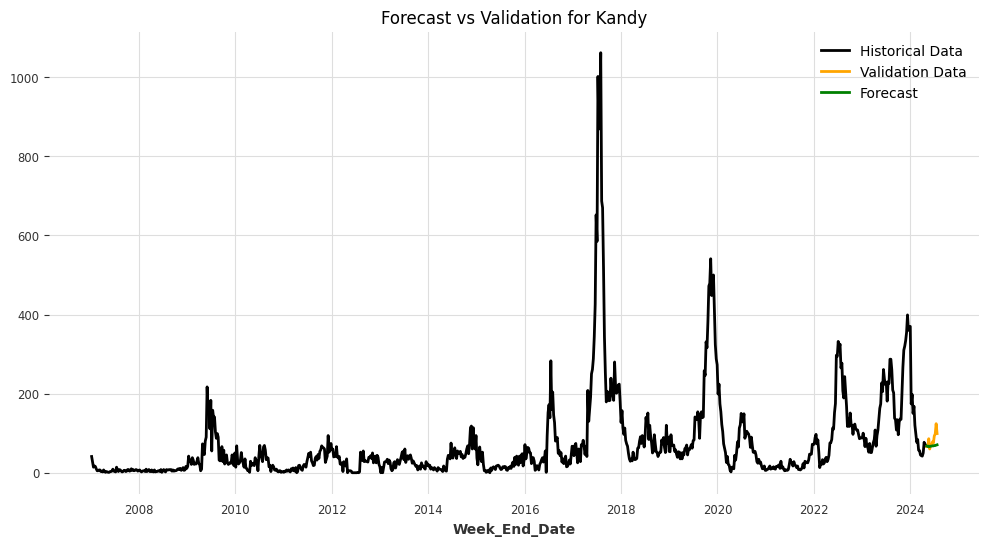

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_LinearRegressionModel.pkl


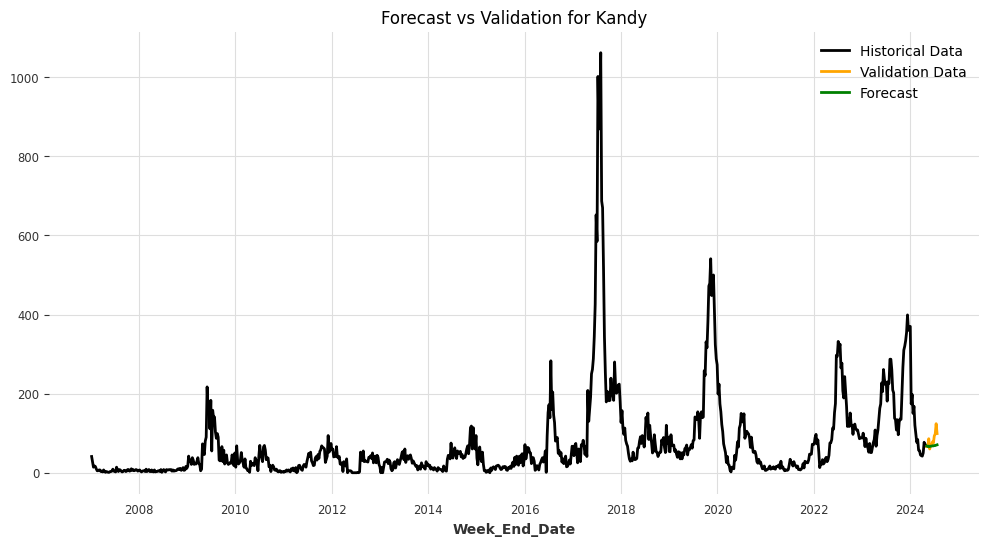

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_RandomForest.pkl


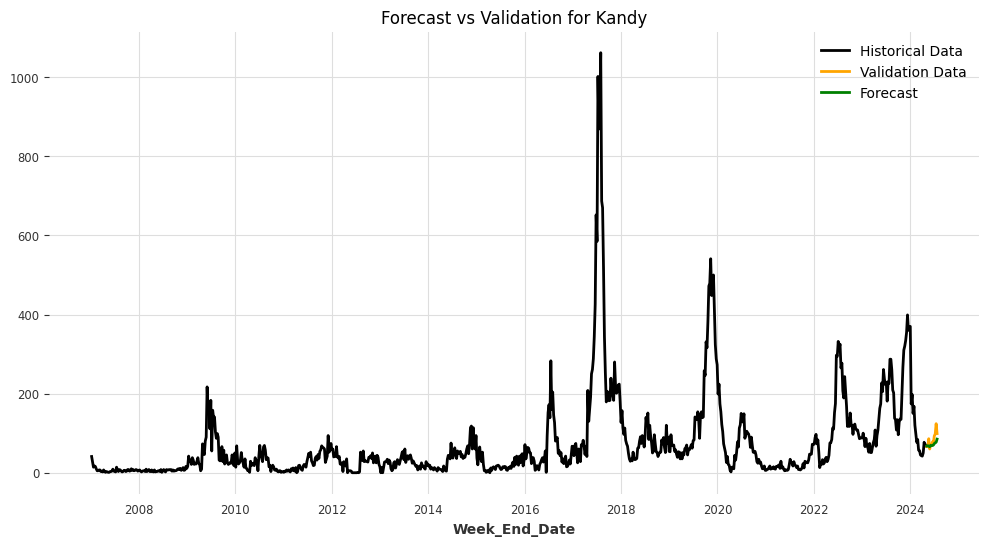

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000096 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 546
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 74.939358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000048 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 546
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 75.022592
[LightGBM] [Warning] No further s

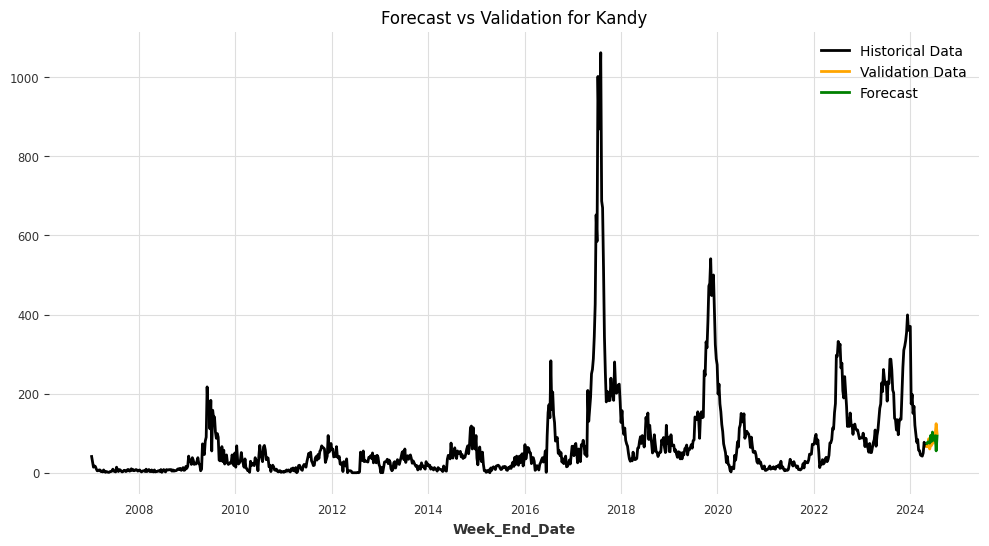

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_XGBModel.pkl


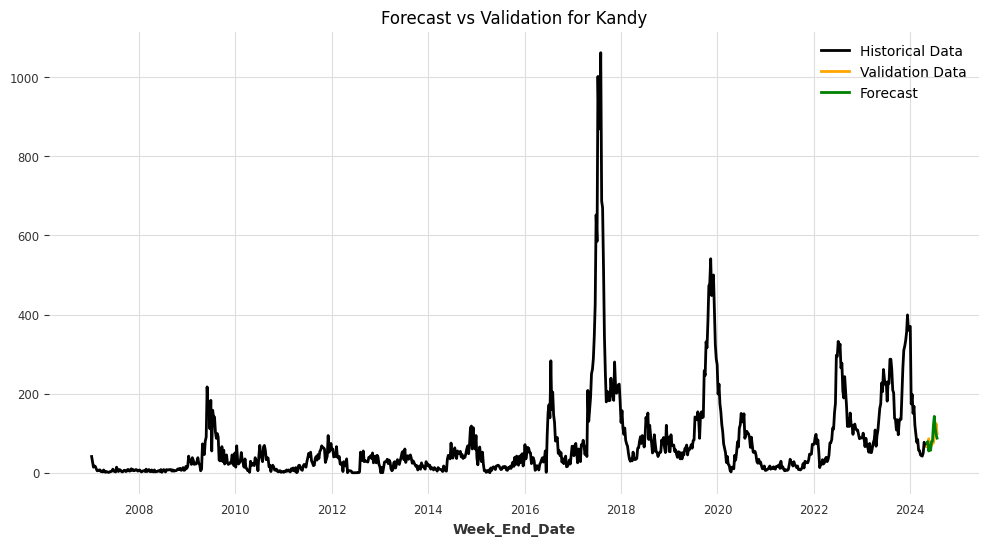

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_CatBoostModel.pkl


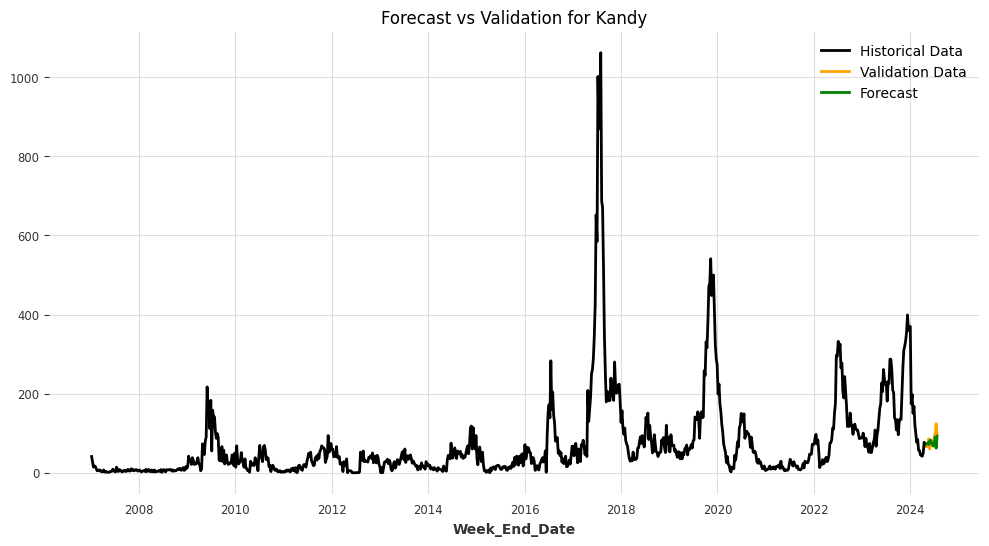

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_RegressionModel.pkl


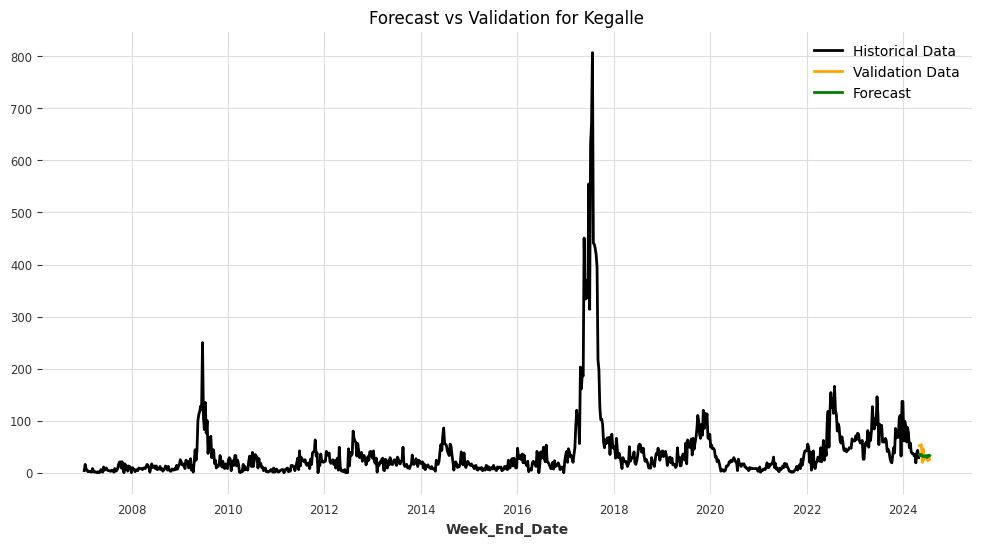

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_LinearRegressionModel.pkl


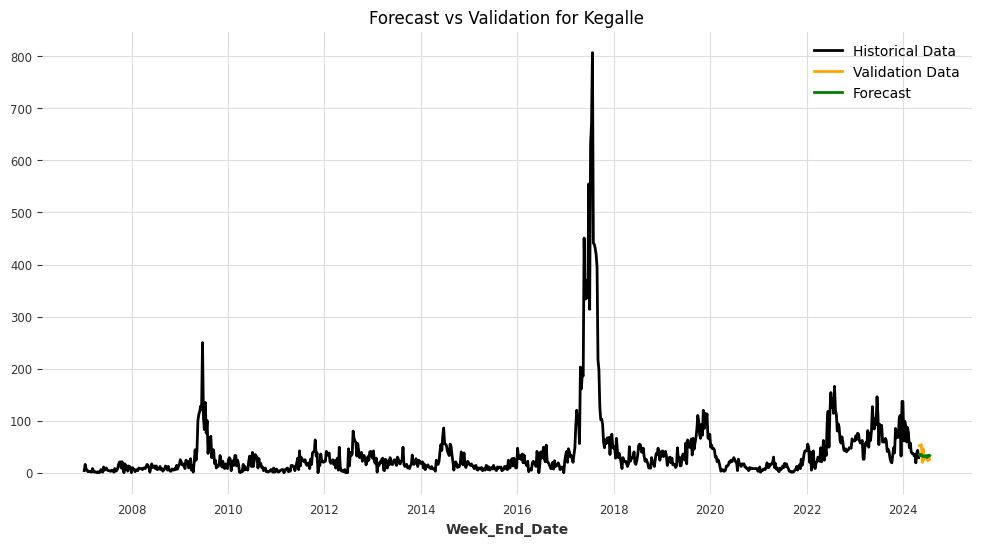

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_RandomForest.pkl


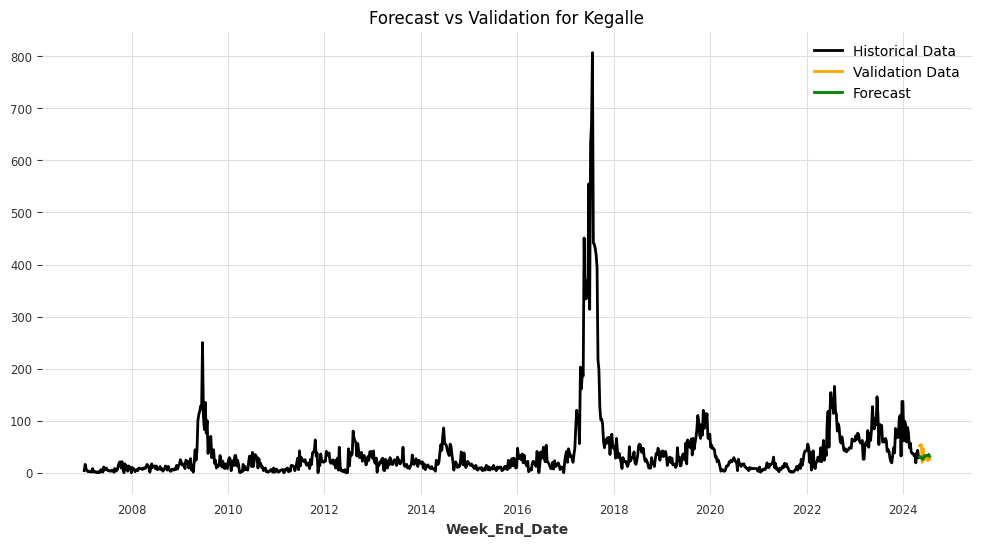

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 358
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 38.769322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 358
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 38.814507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM]

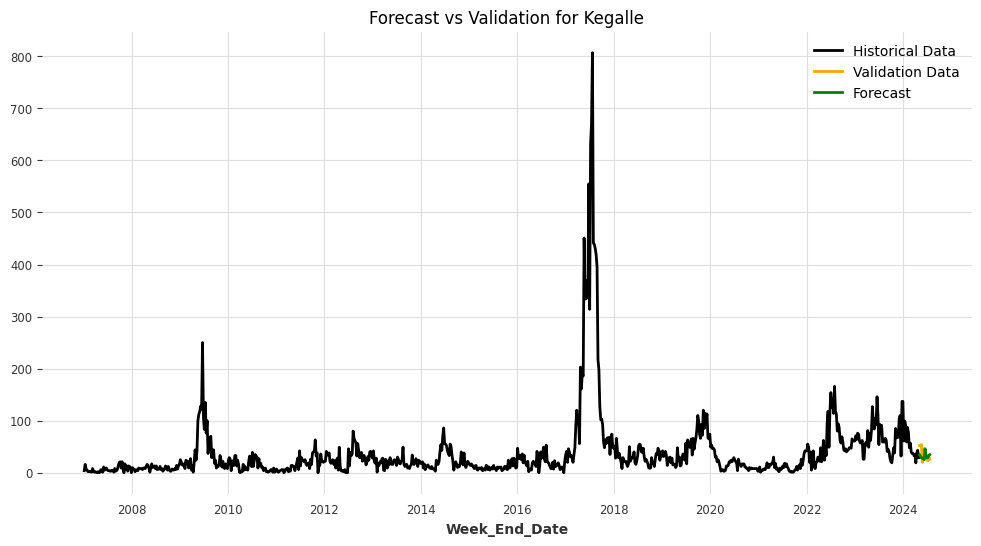

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_XGBModel.pkl


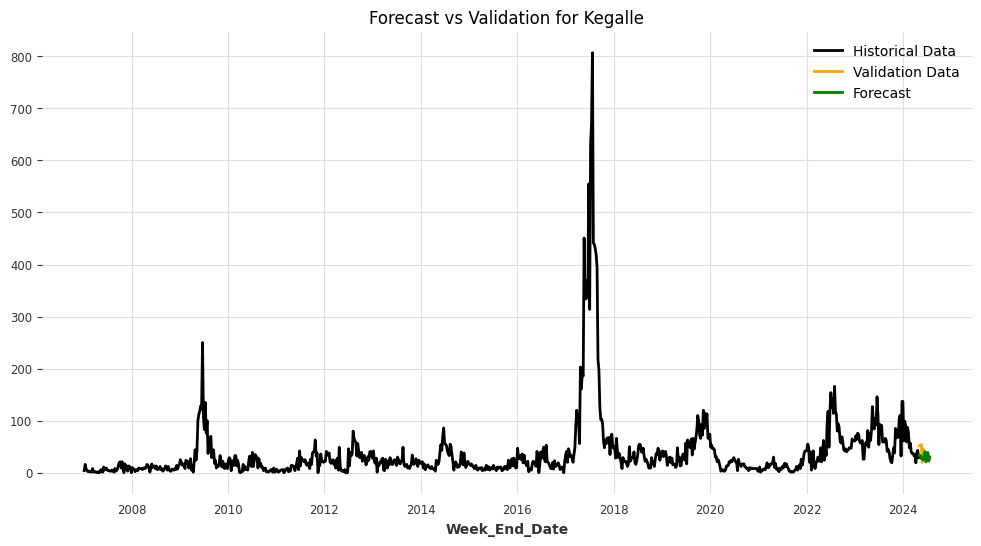

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_CatBoostModel.pkl


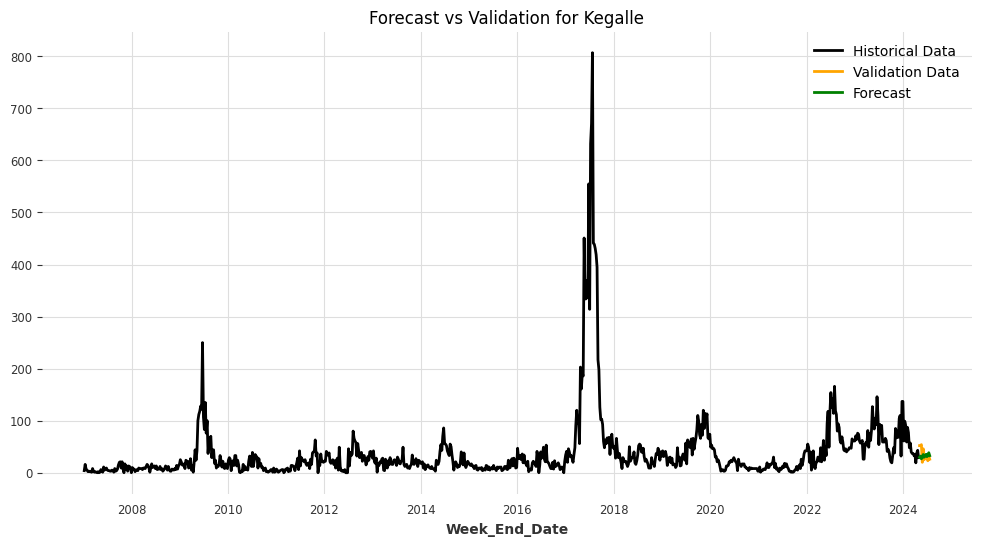

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_RegressionModel.pkl


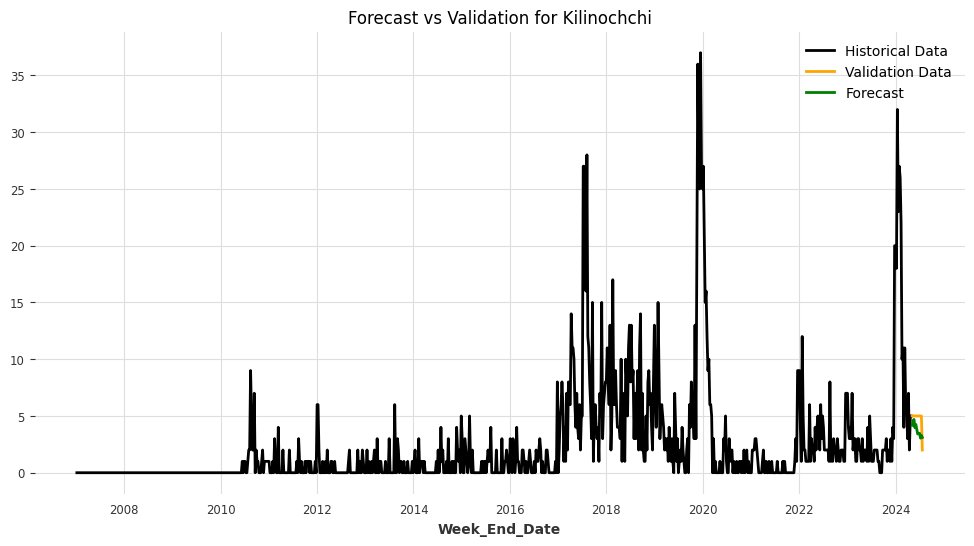

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_LinearRegressionModel.pkl


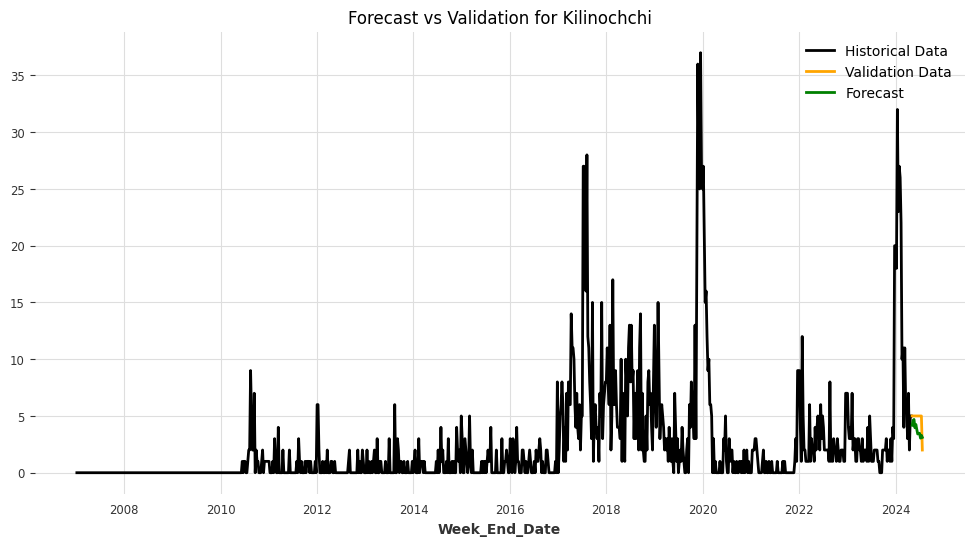

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_RandomForest.pkl


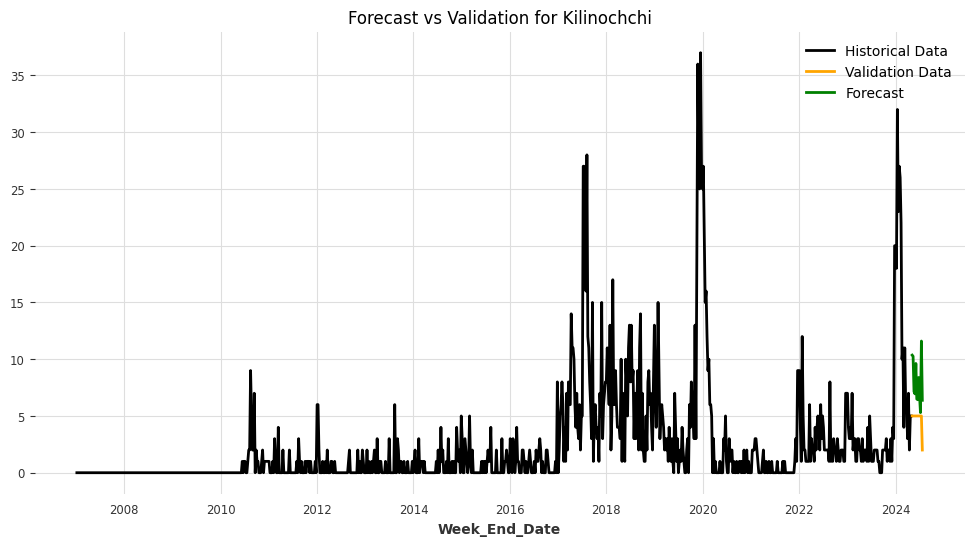

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 83
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 2.430440
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

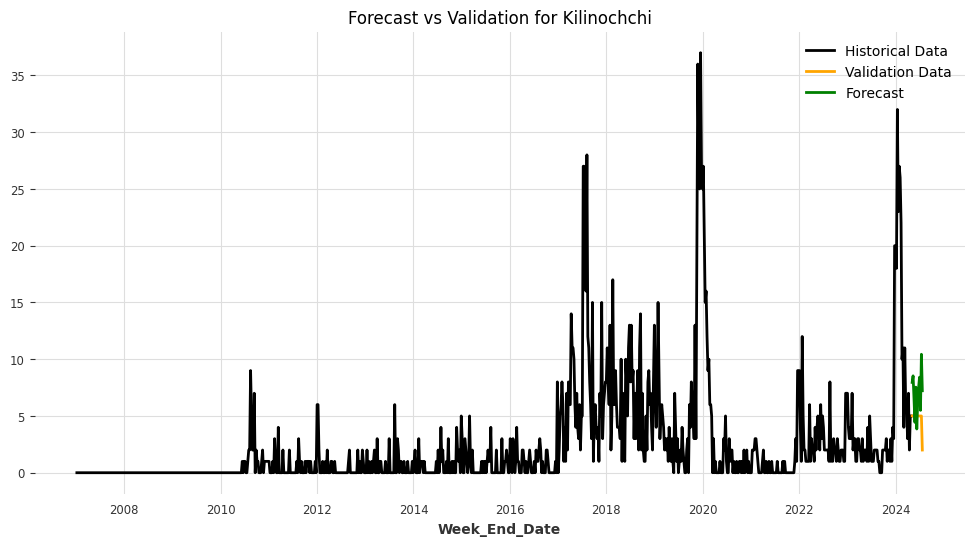

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_XGBModel.pkl


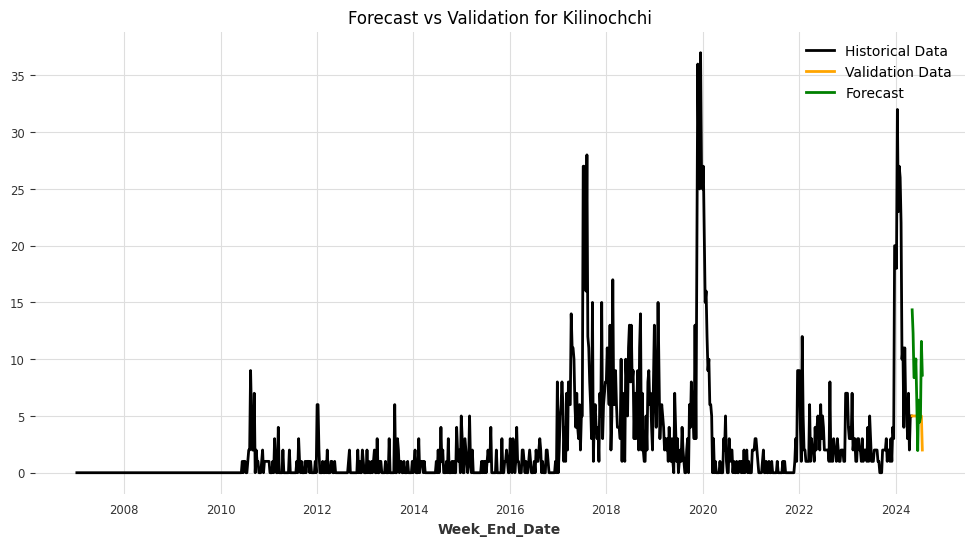

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_CatBoostModel.pkl


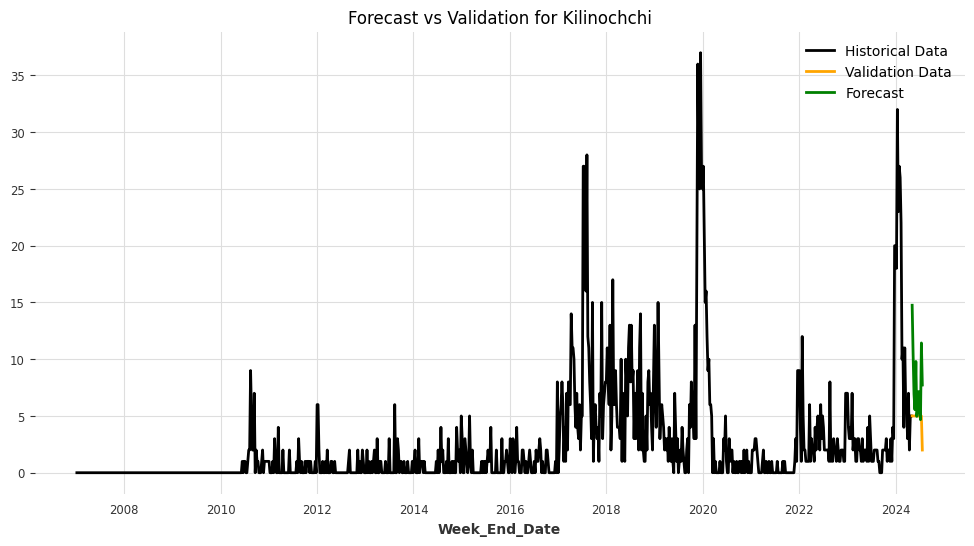

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_RegressionModel.pkl


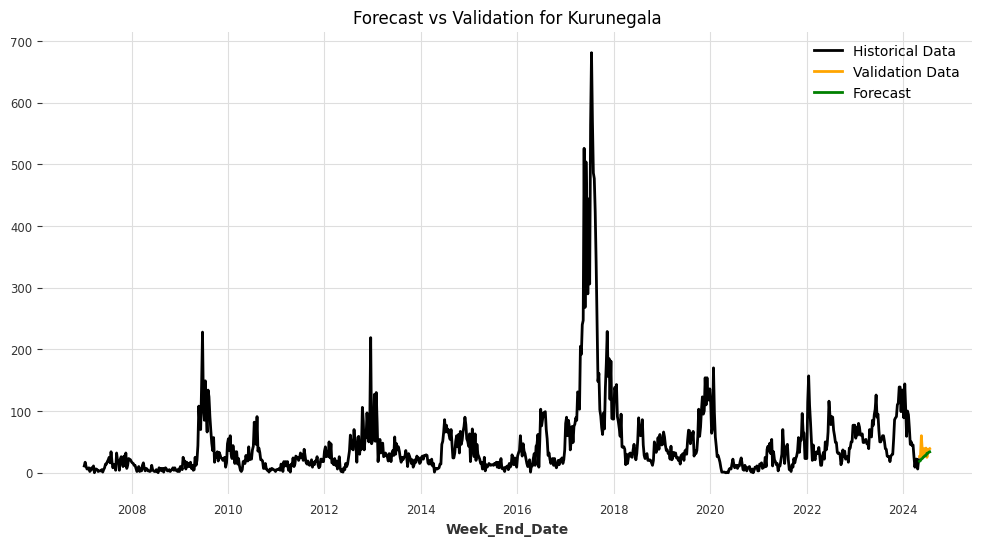

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_LinearRegressionModel.pkl


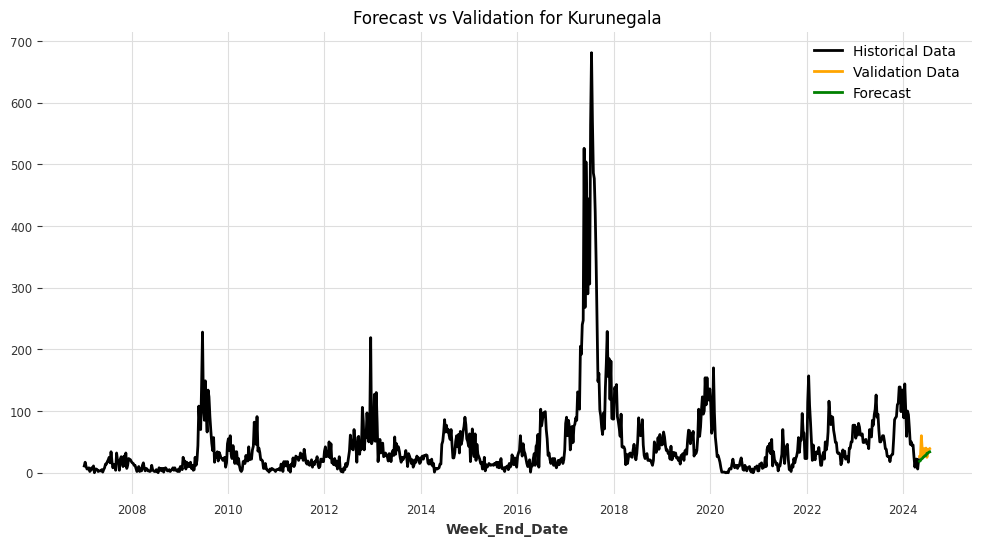

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_RandomForest.pkl


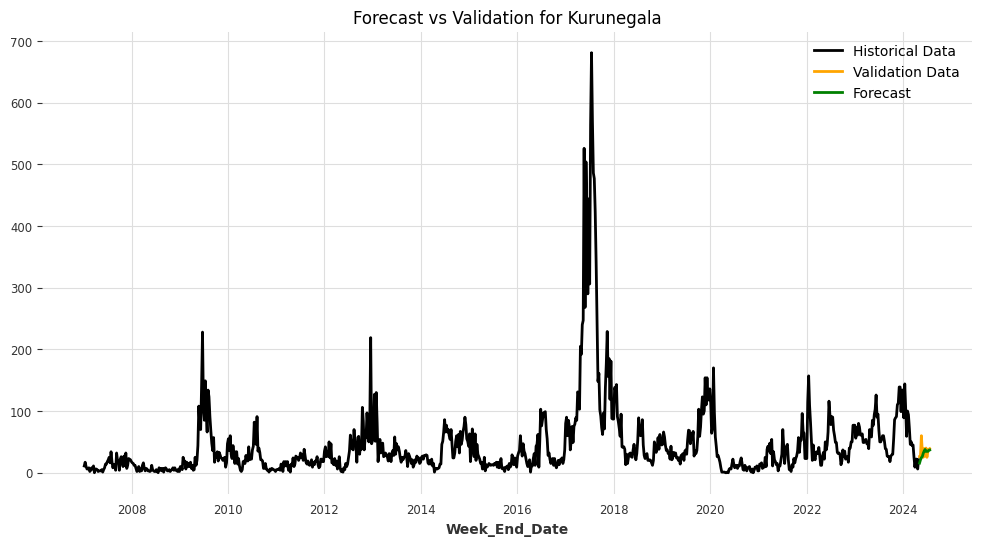

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 46.353151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 431
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 46.419738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] N

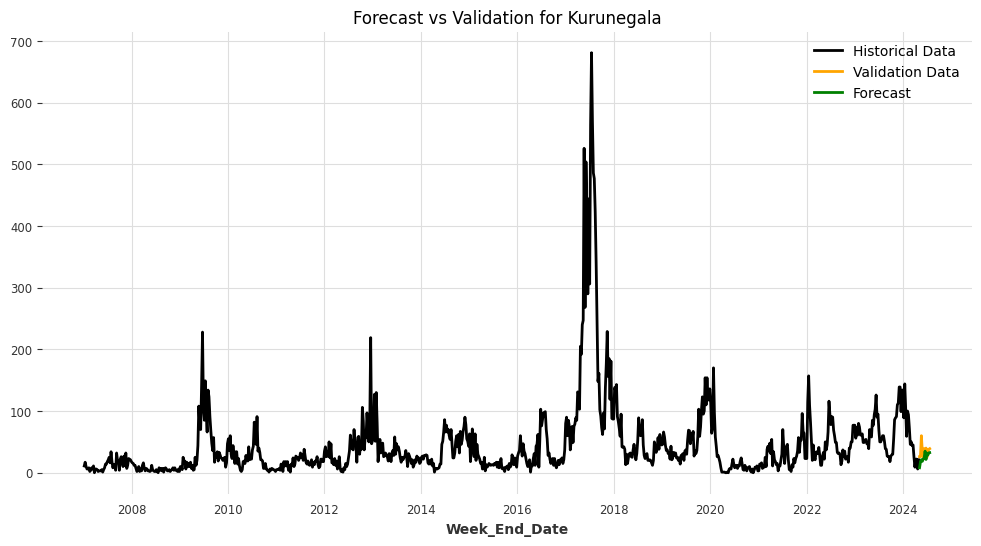

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_XGBModel.pkl


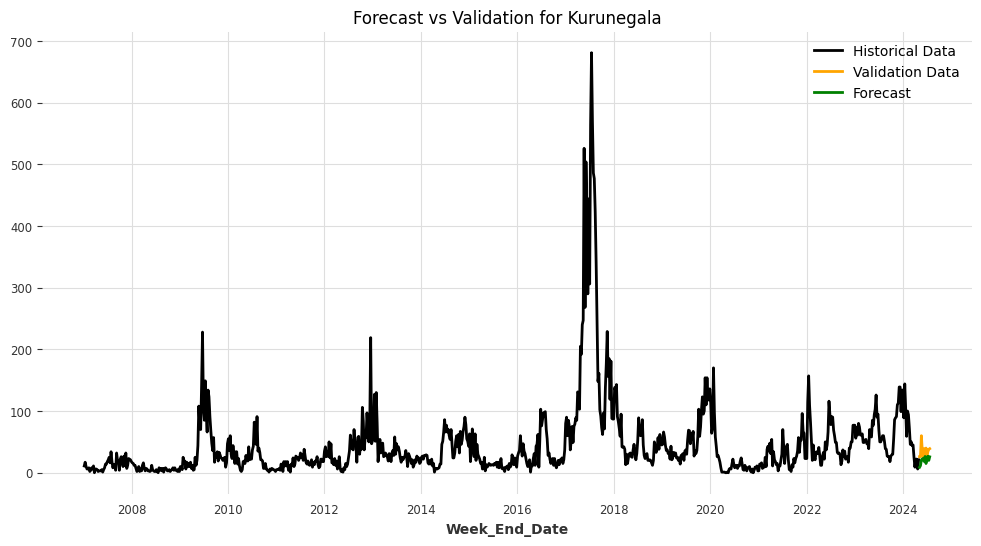

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_CatBoostModel.pkl


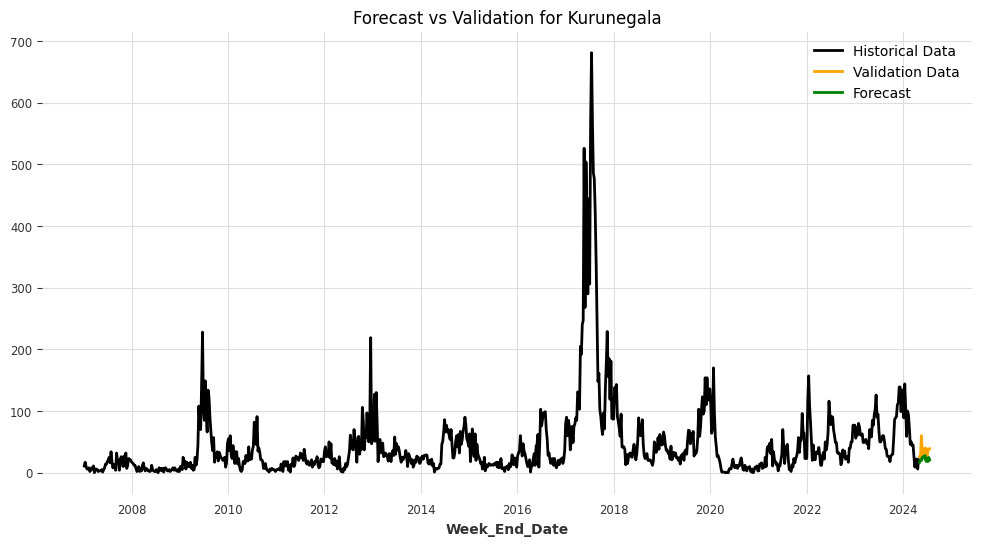

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_RegressionModel.pkl


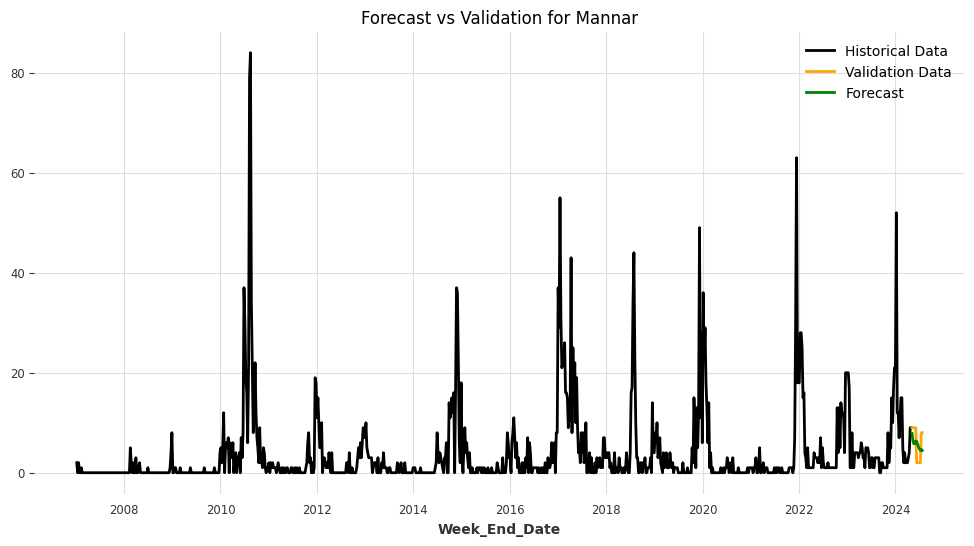

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_LinearRegressionModel.pkl


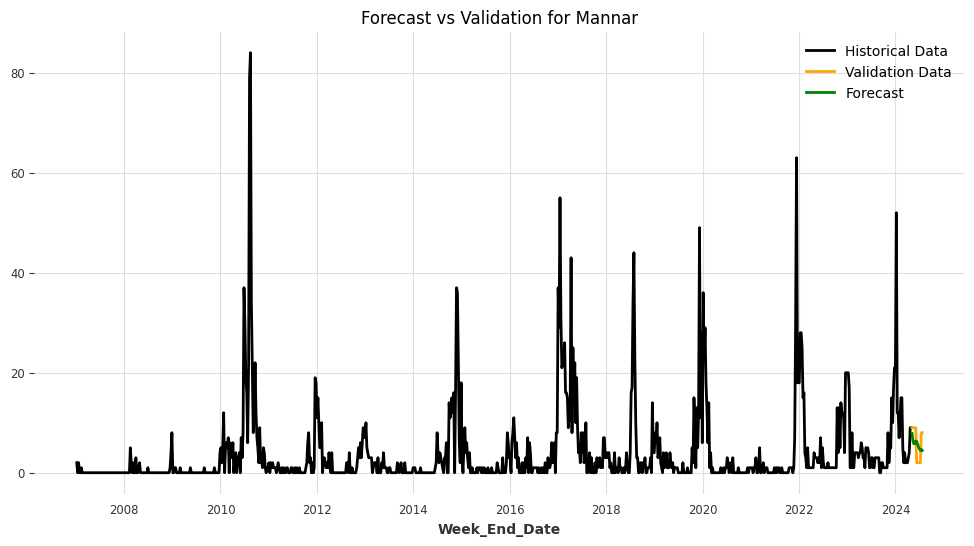

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_RandomForest.pkl


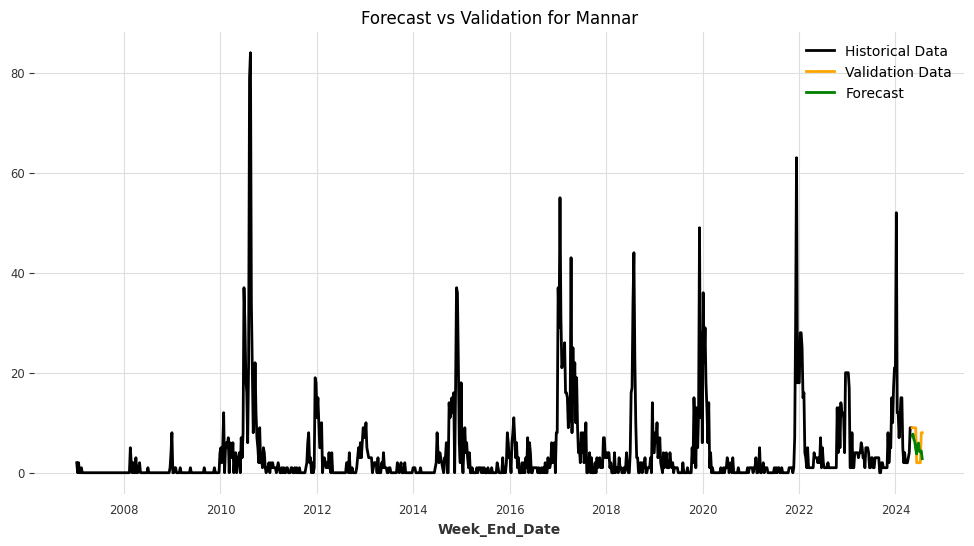

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 4.007134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

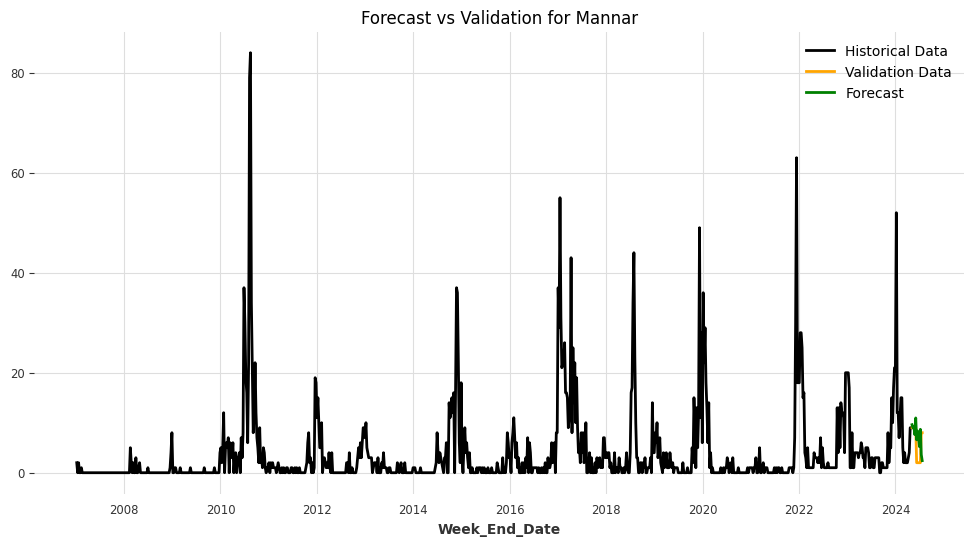

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_XGBModel.pkl


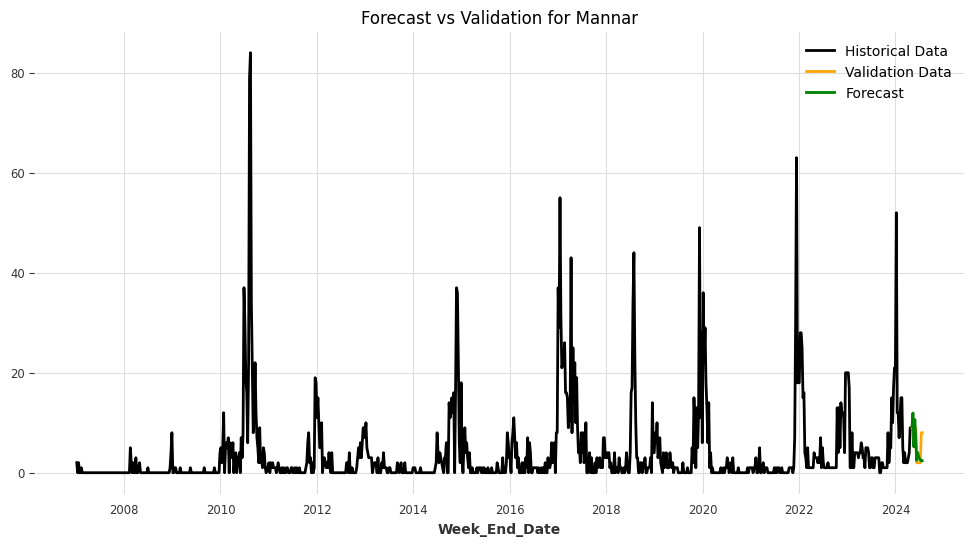

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_CatBoostModel.pkl


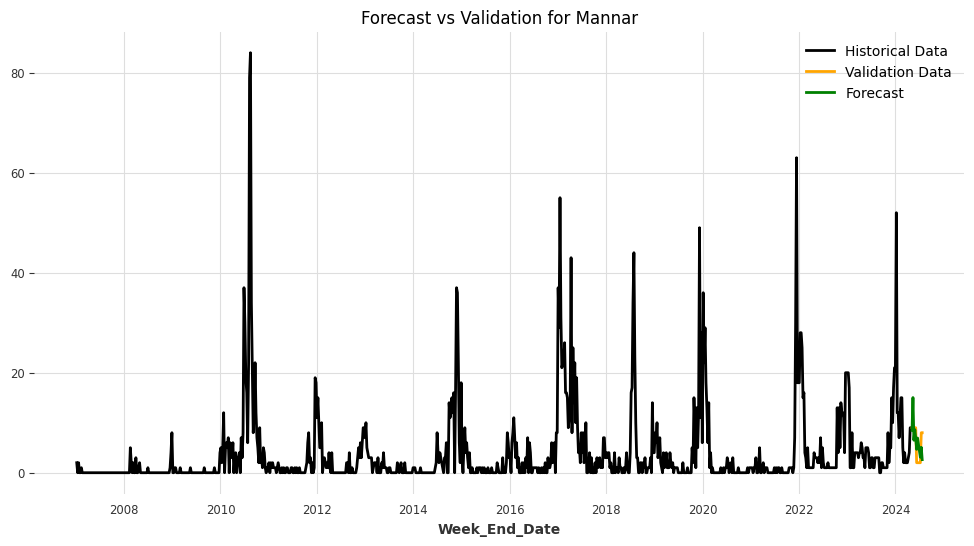

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_RegressionModel.pkl


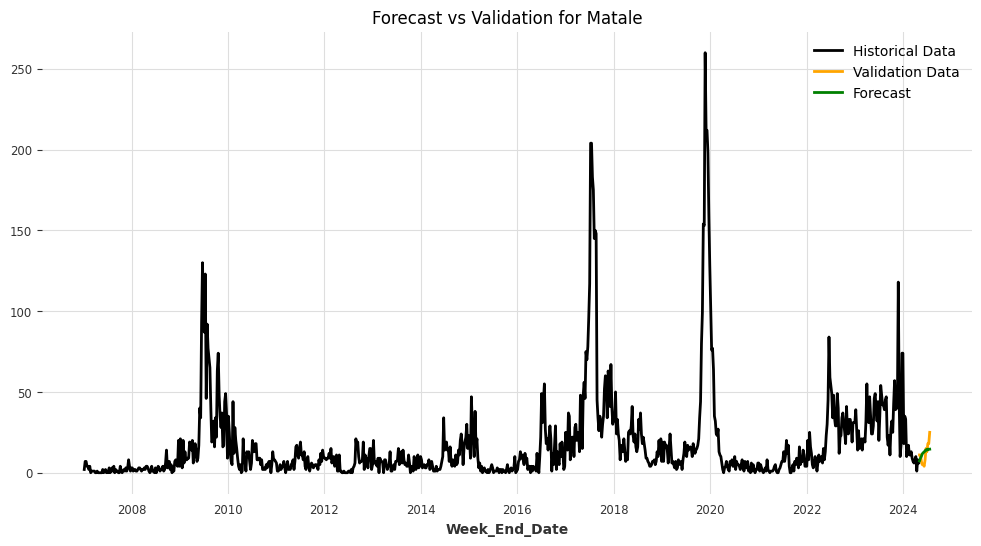

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_LinearRegressionModel.pkl


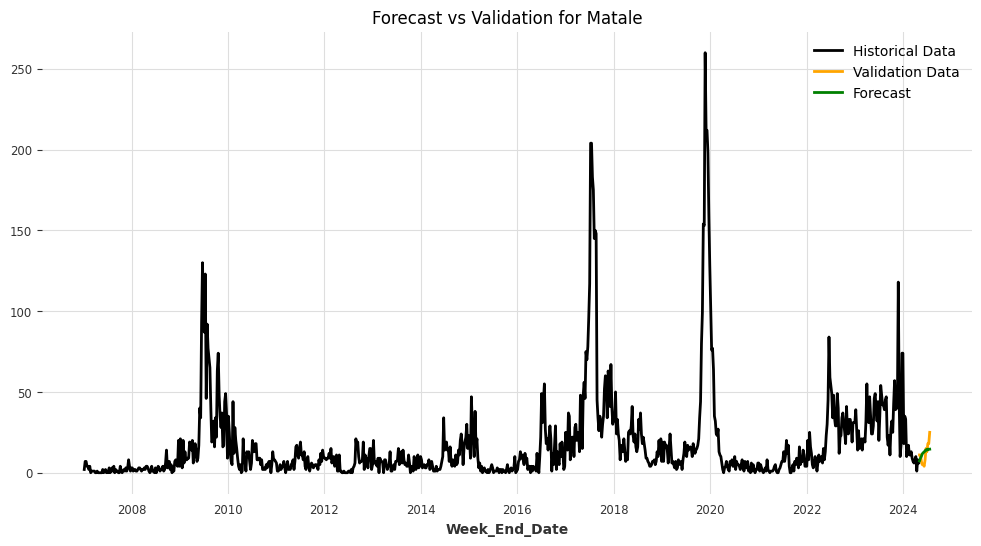

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_RandomForest.pkl


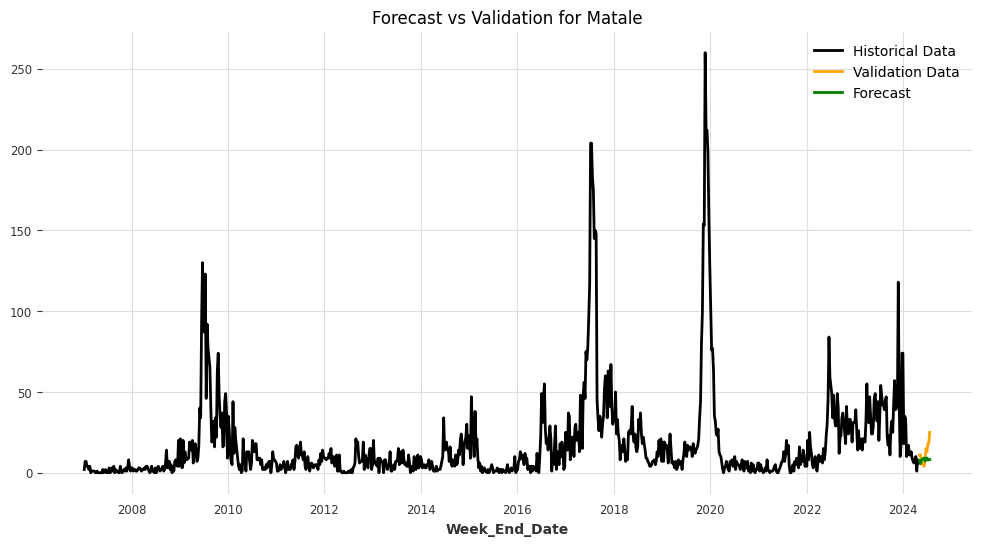

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 18.242568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000099 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 252
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 18.252081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 se

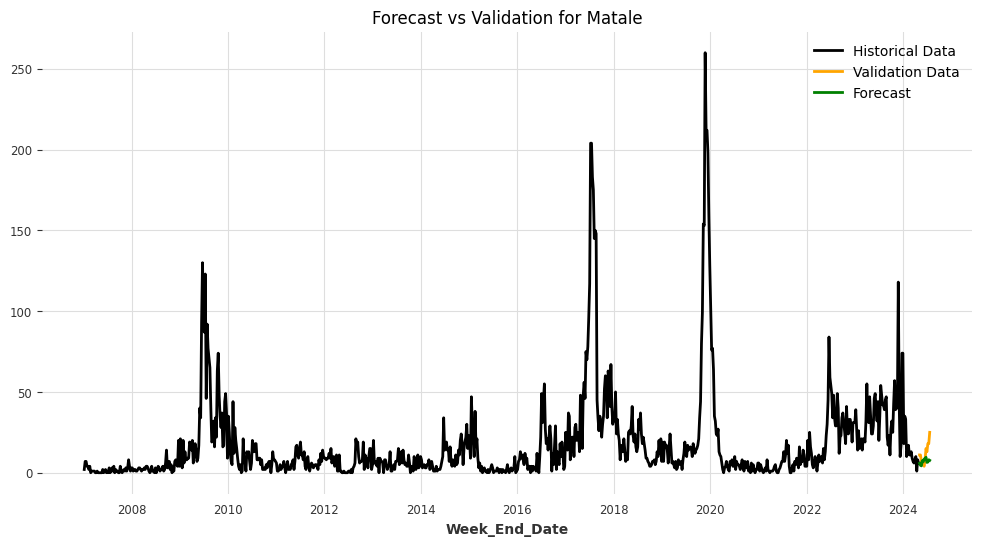

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_XGBModel.pkl


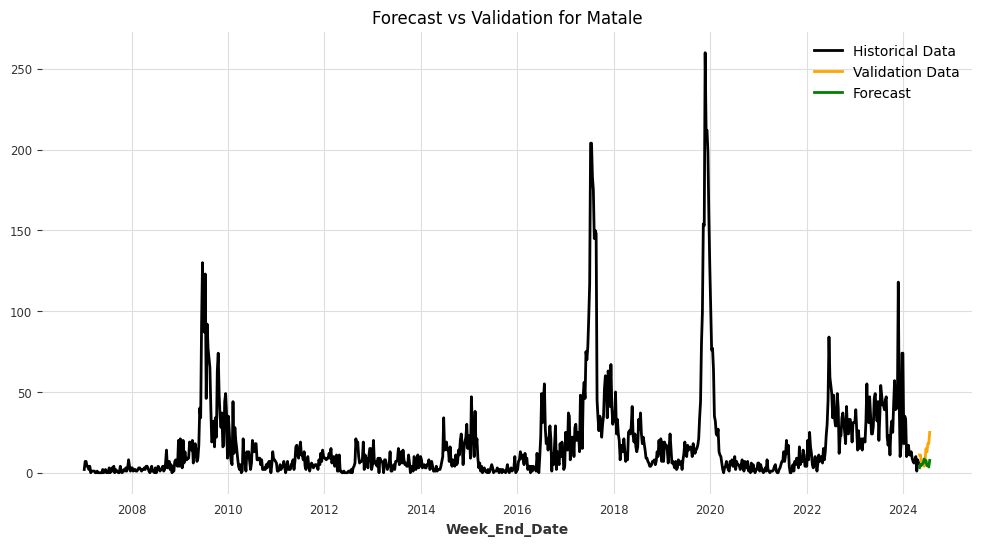

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_CatBoostModel.pkl


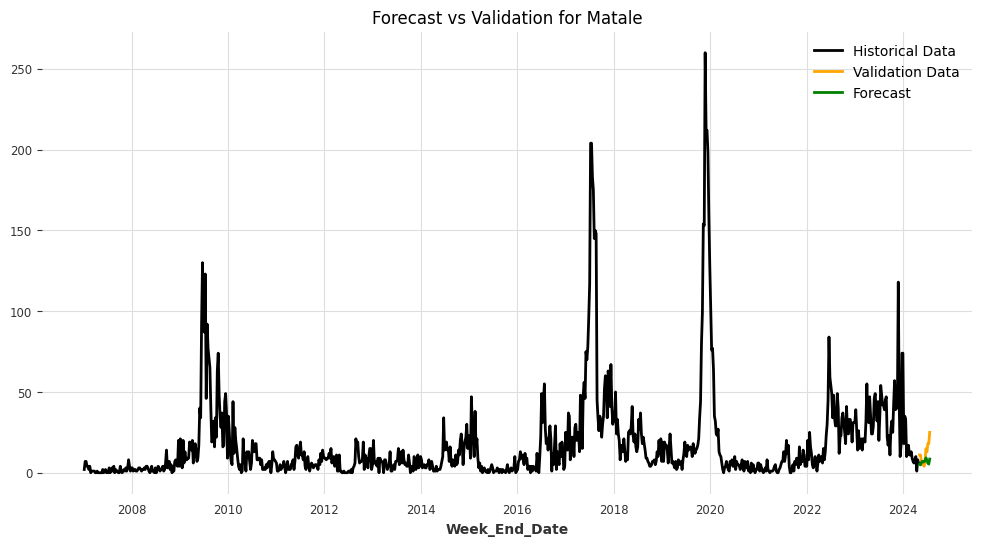

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_RegressionModel.pkl


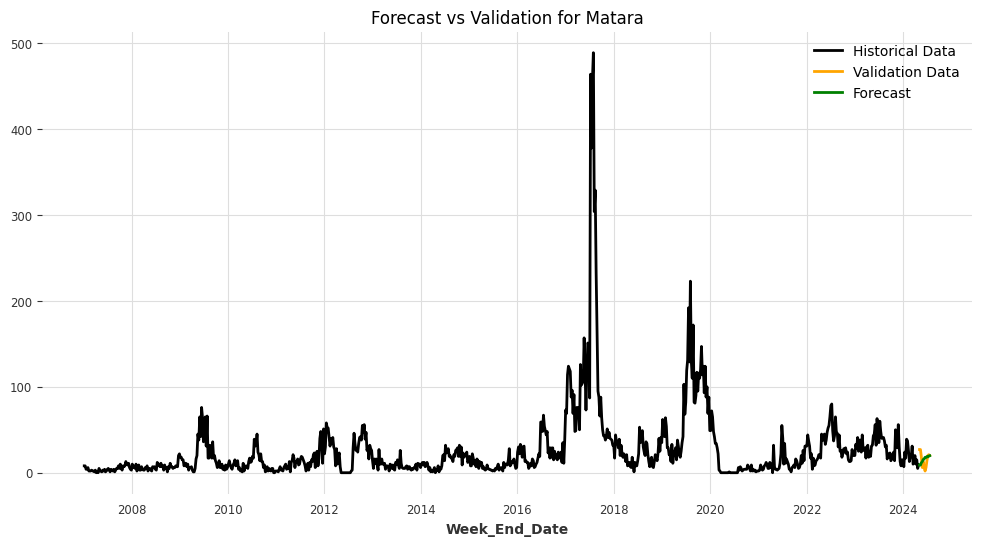

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_LinearRegressionModel.pkl


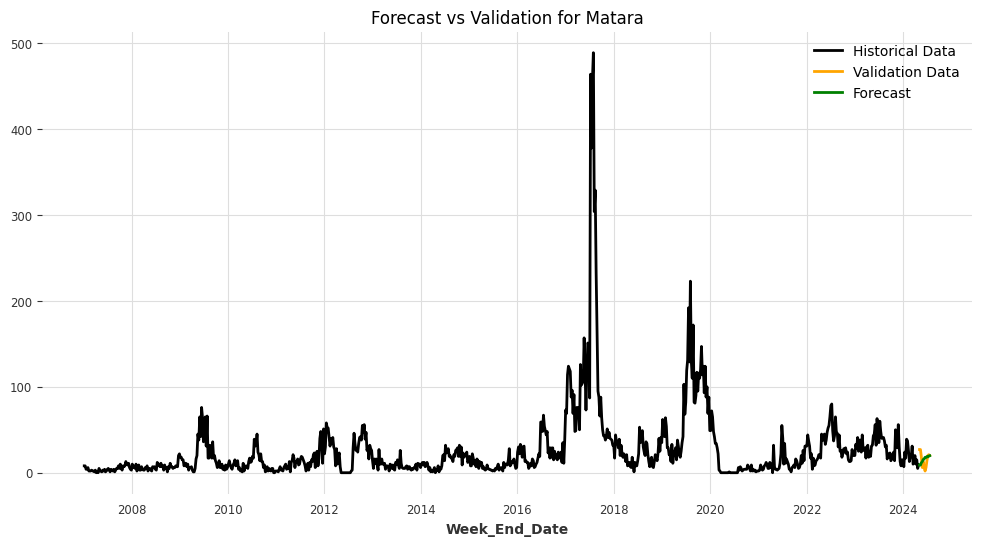

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_RandomForest.pkl


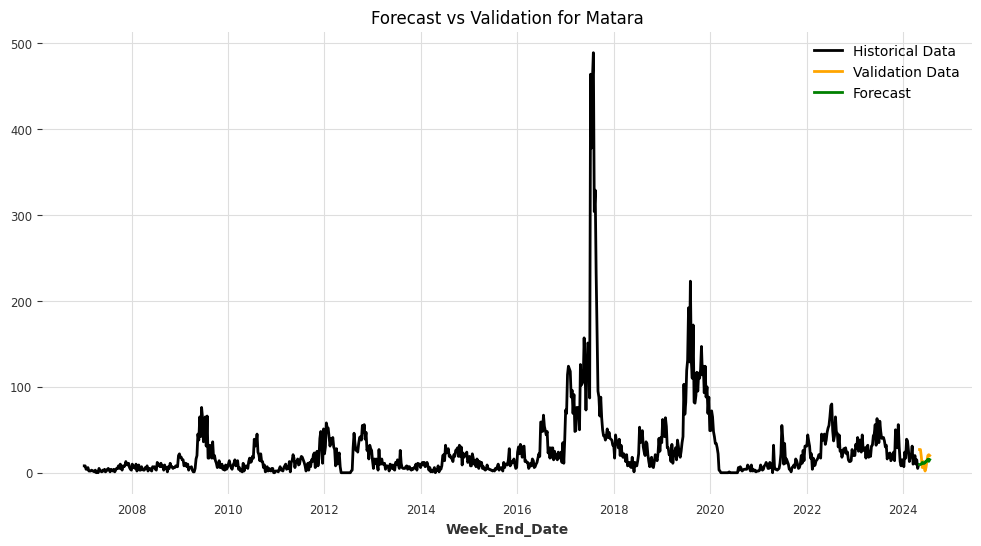

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 320
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 27.258026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000083 seconds.
You can set `force_col_wise=true

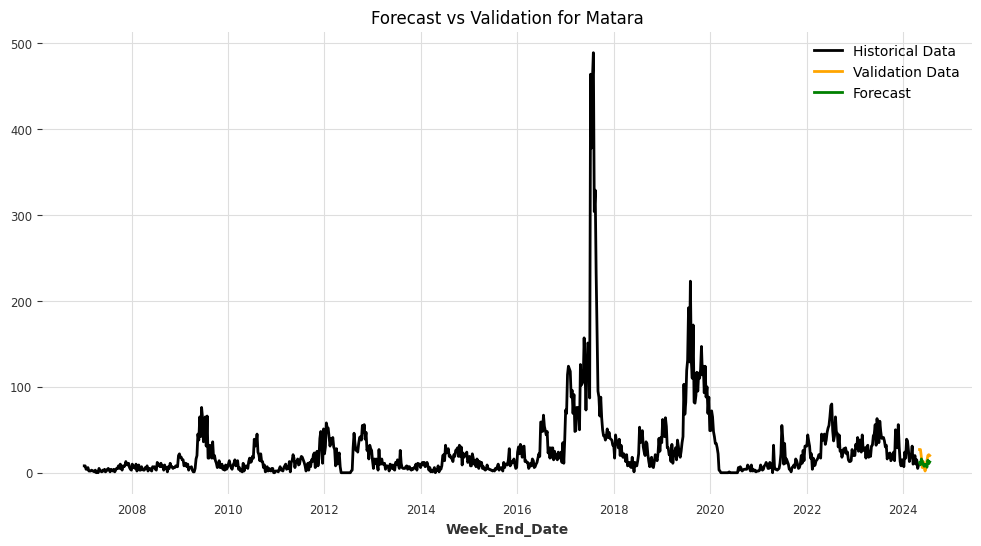

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_XGBModel.pkl


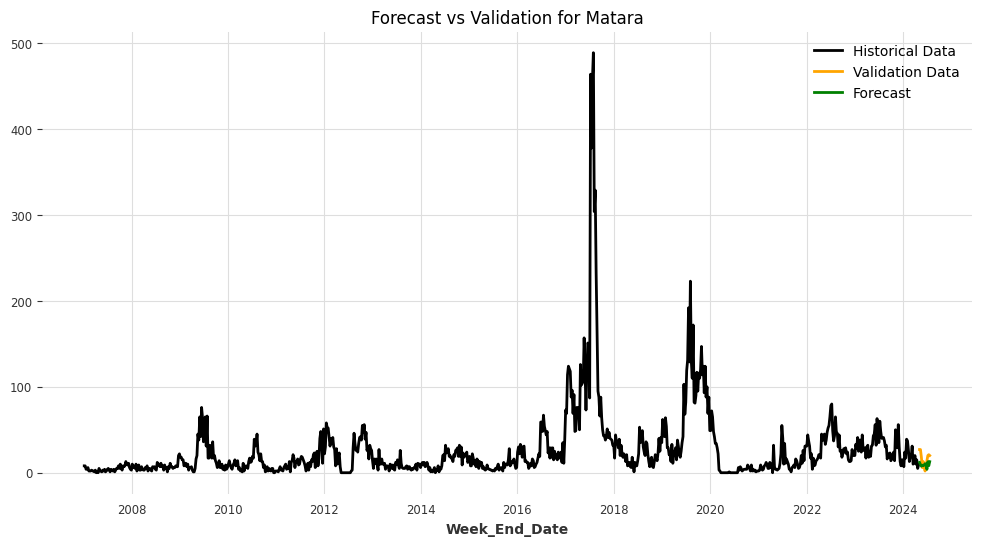

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_CatBoostModel.pkl


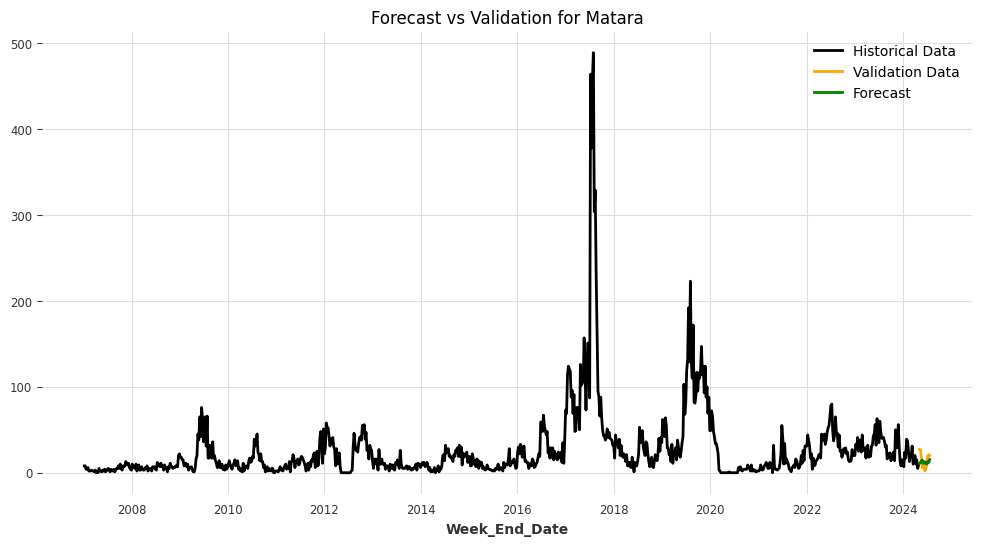

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_RegressionModel.pkl


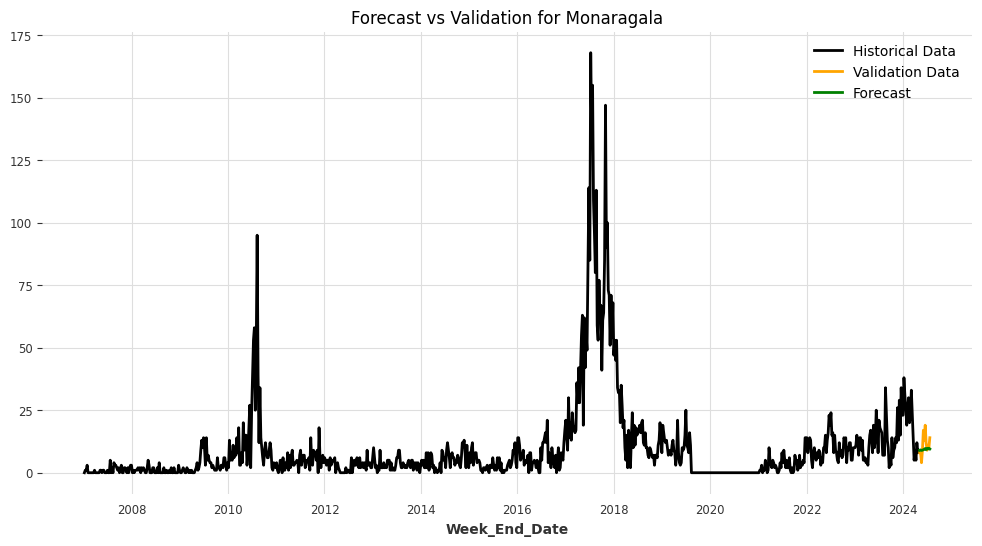

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_LinearRegressionModel.pkl


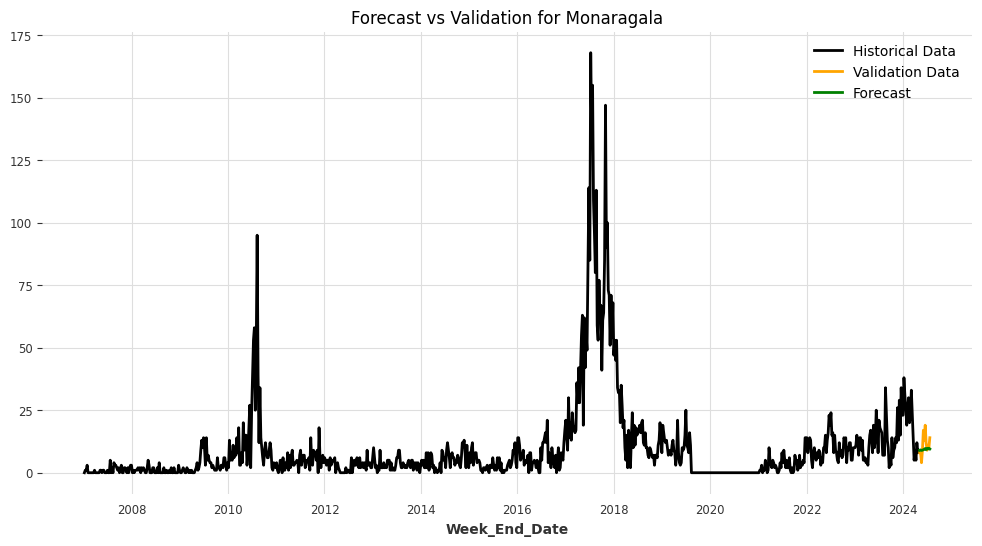

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_RandomForest.pkl


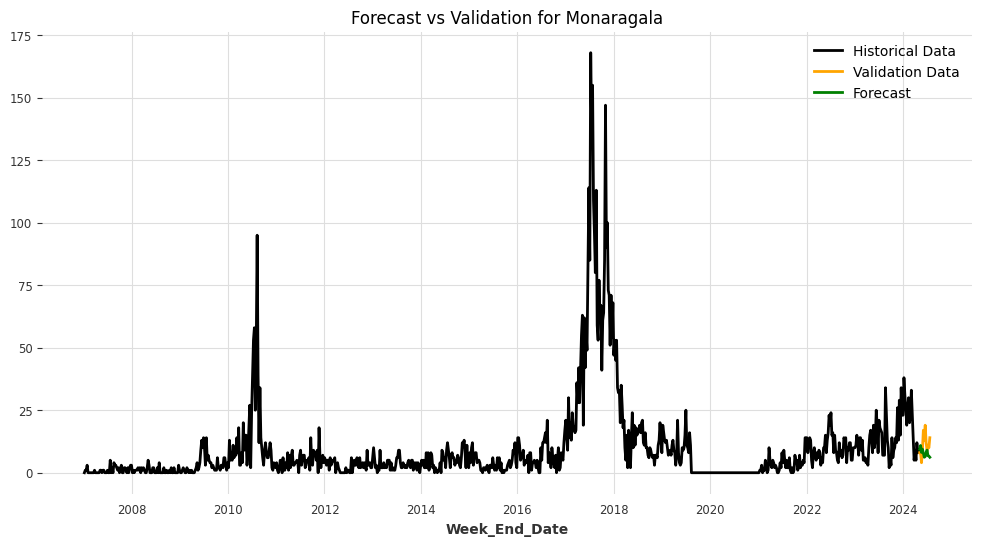

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 173
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 9.932224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

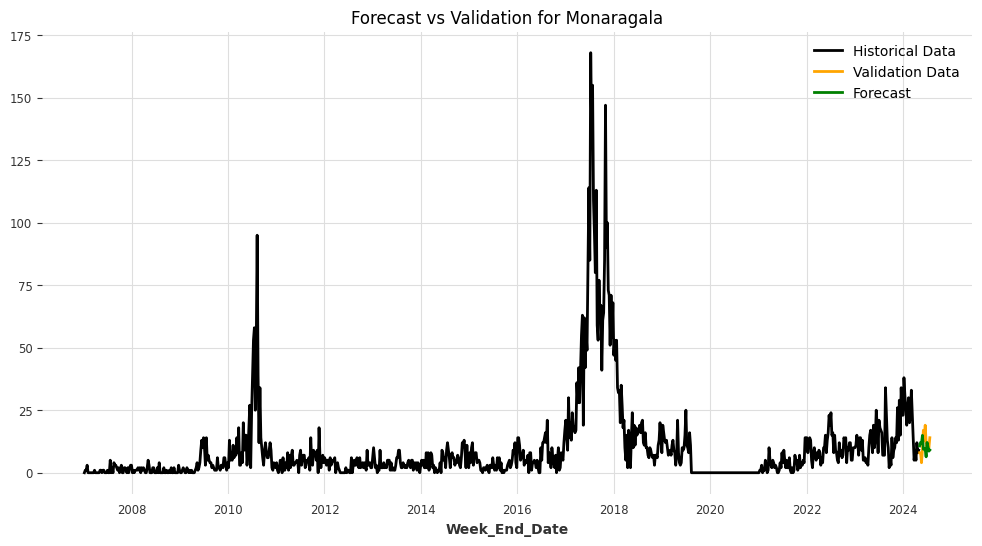

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_XGBModel.pkl


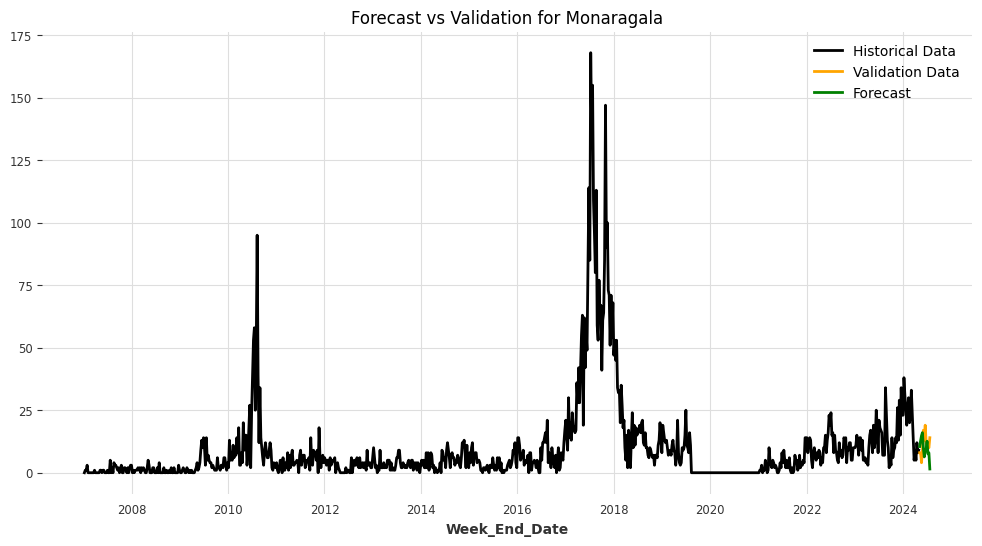

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_CatBoostModel.pkl


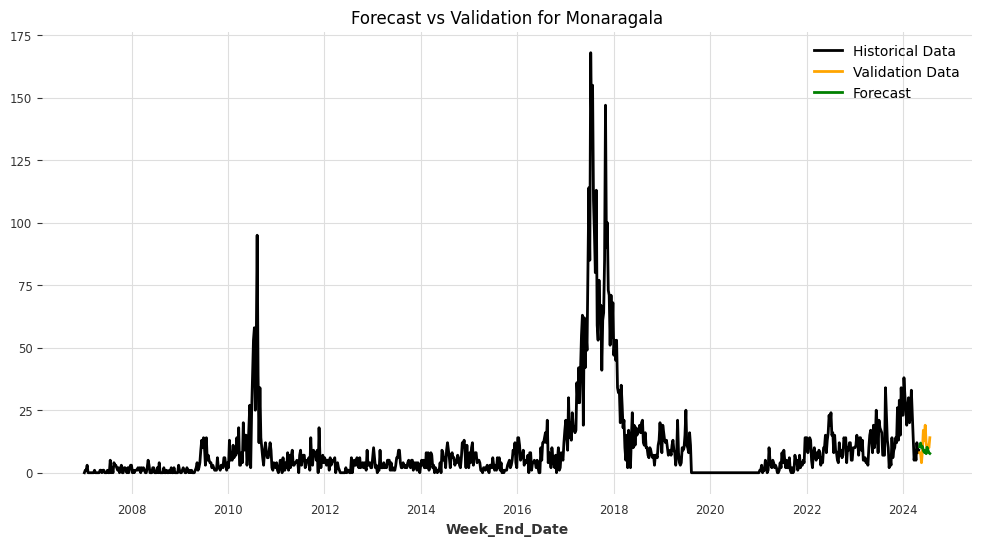

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_RegressionModel.pkl


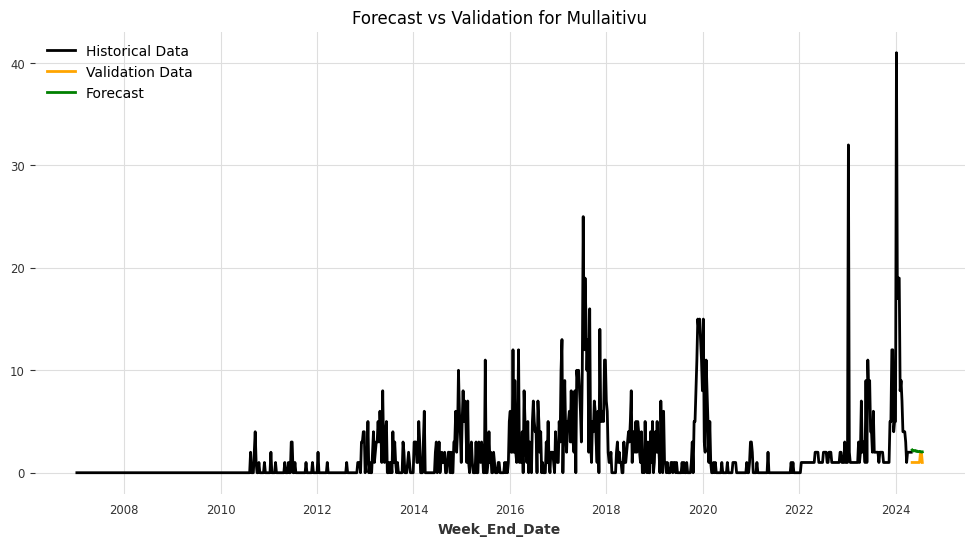

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_LinearRegressionModel.pkl


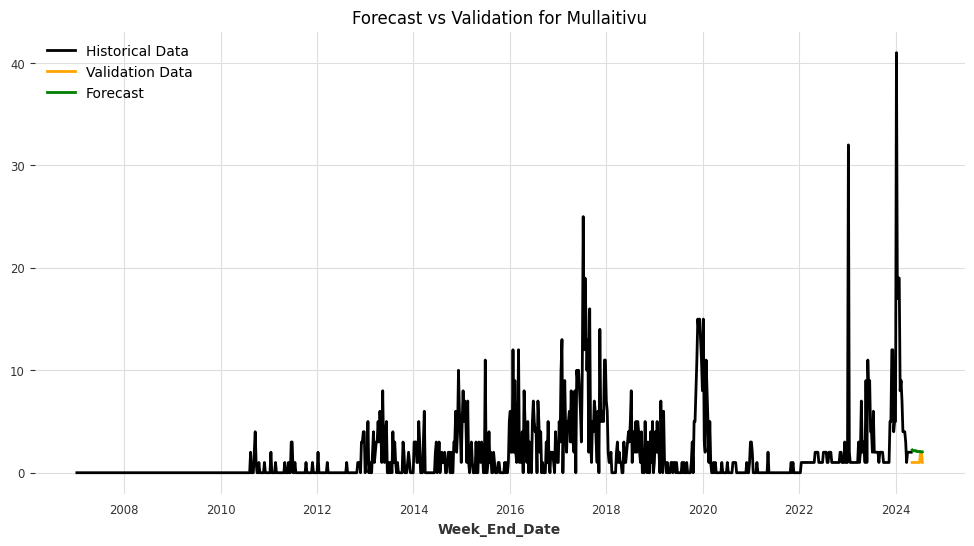

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_RandomForest.pkl


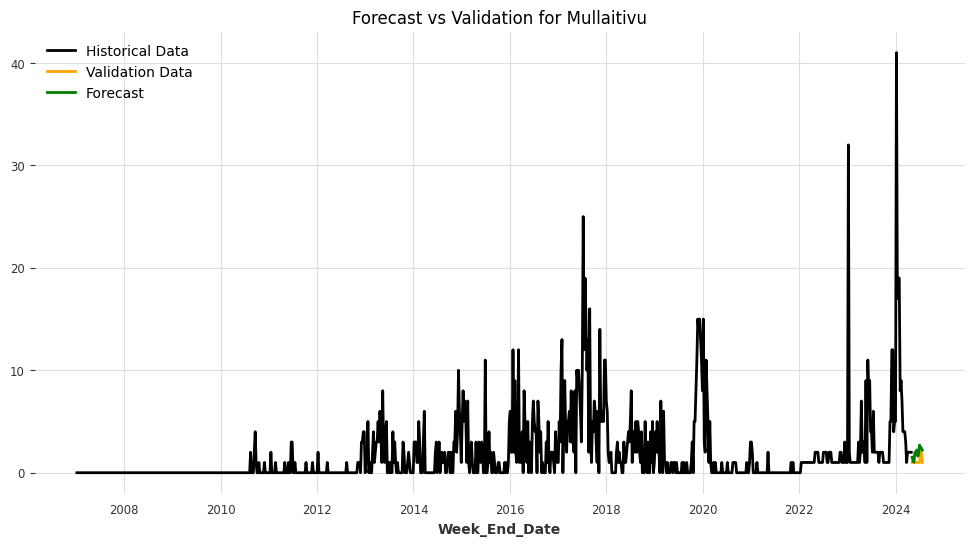

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000120 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 68
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 1.822830
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

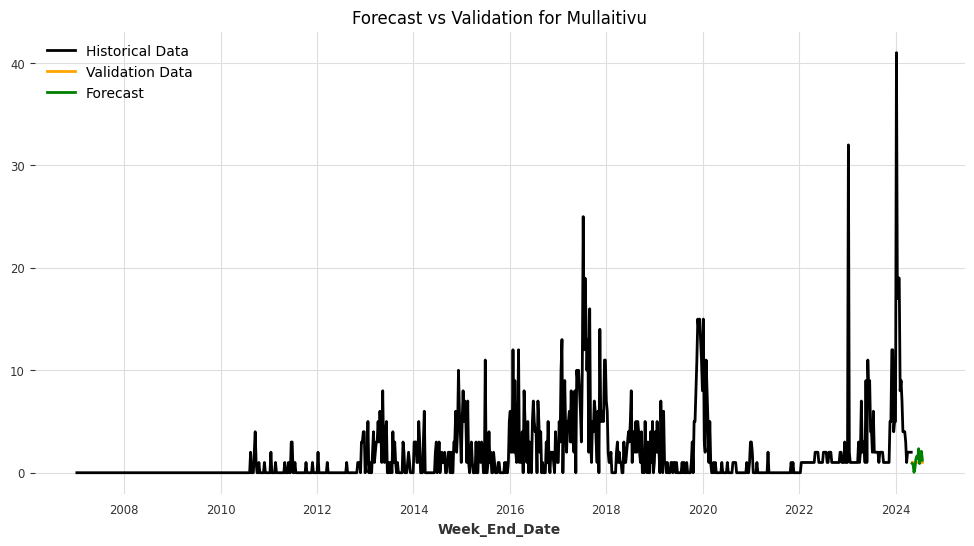

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_XGBModel.pkl


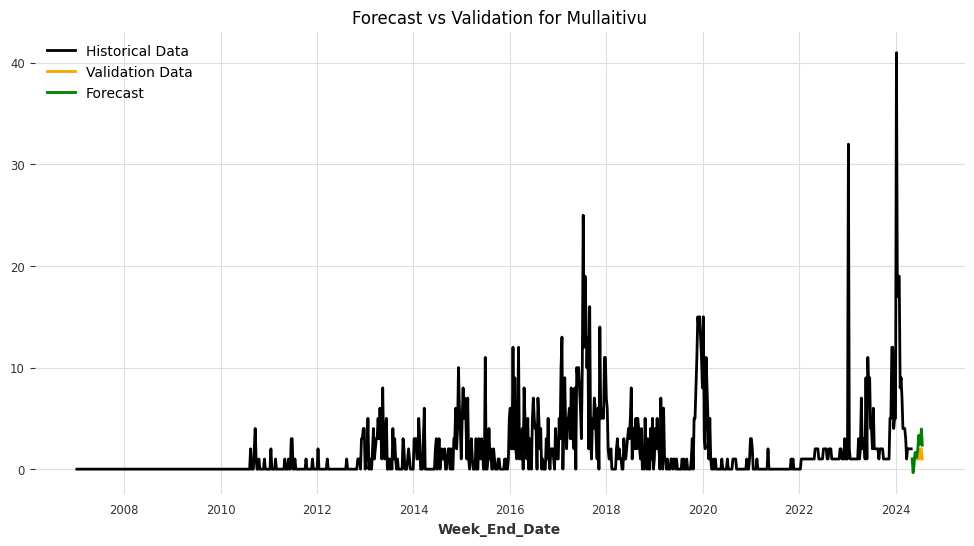

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_CatBoostModel.pkl


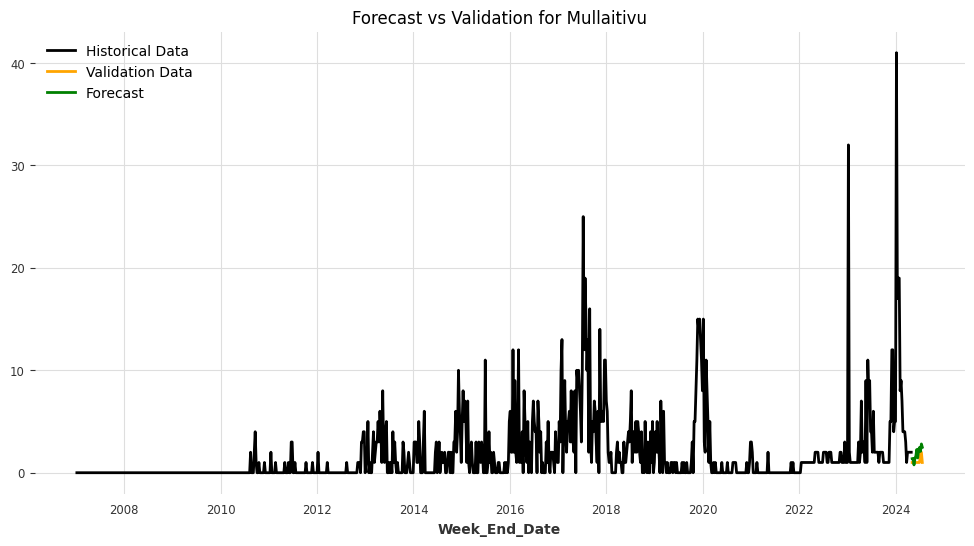

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_RegressionModel.pkl


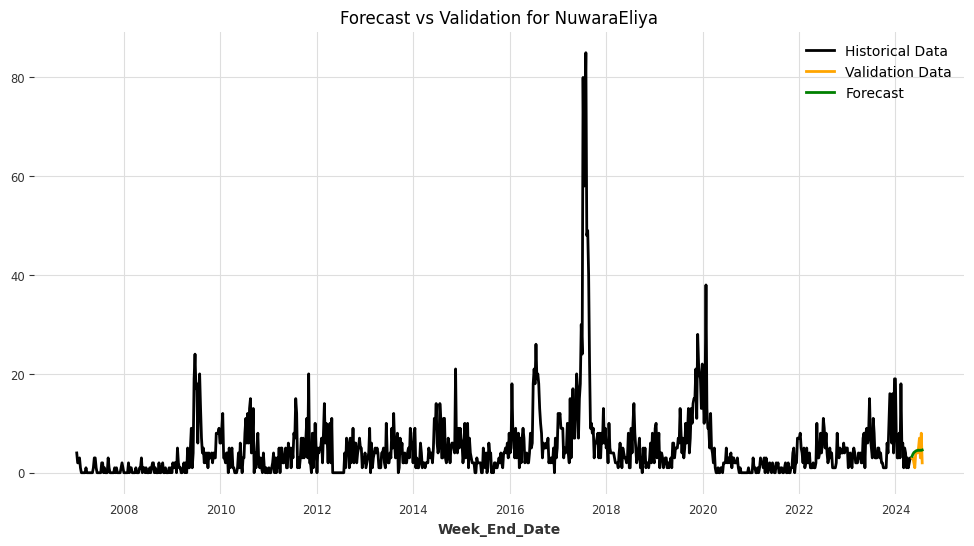

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_LinearRegressionModel.pkl


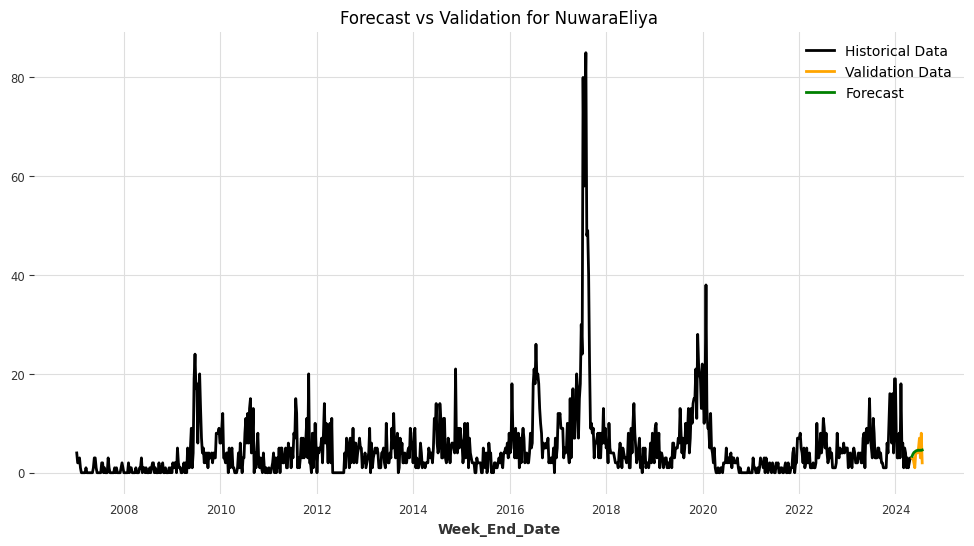

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_RandomForest.pkl


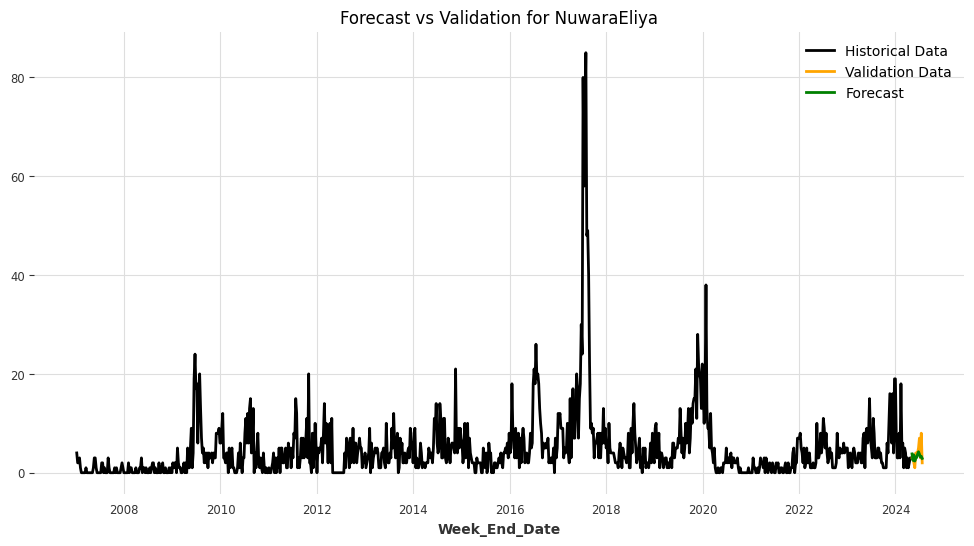

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000087 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 5.059453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

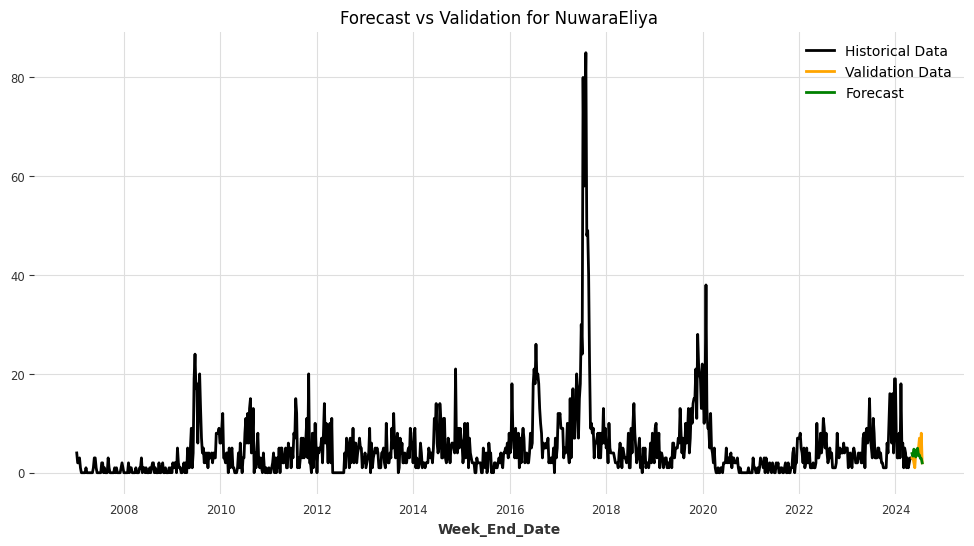

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_XGBModel.pkl


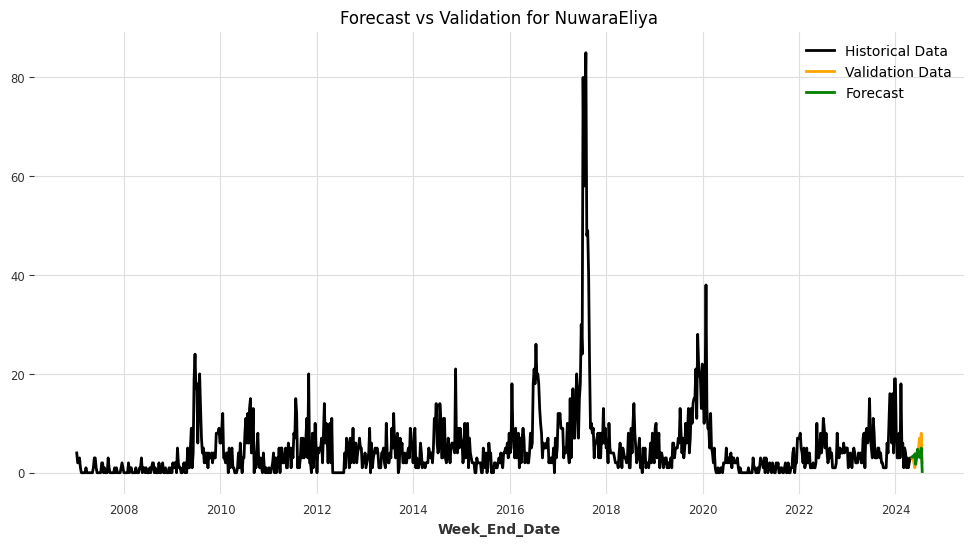

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_CatBoostModel.pkl


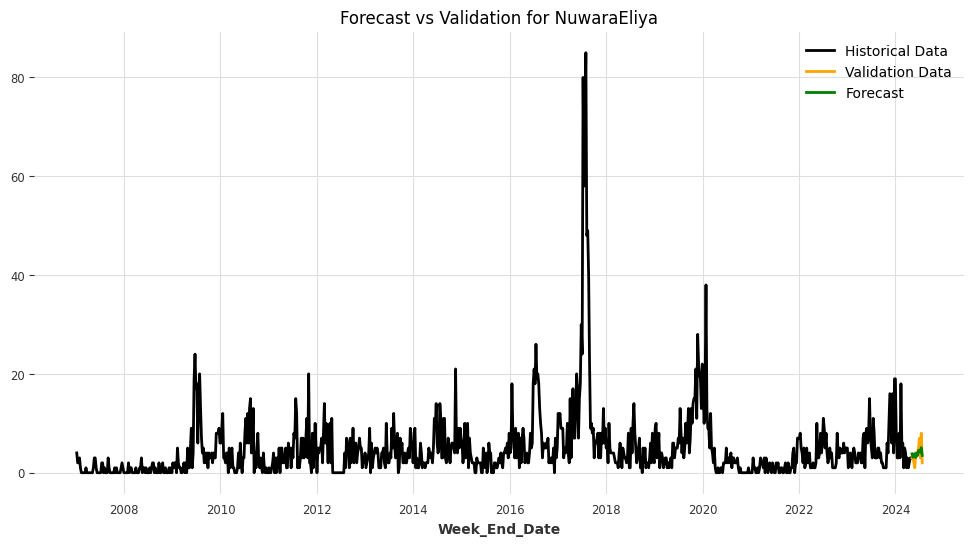

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_RegressionModel.pkl


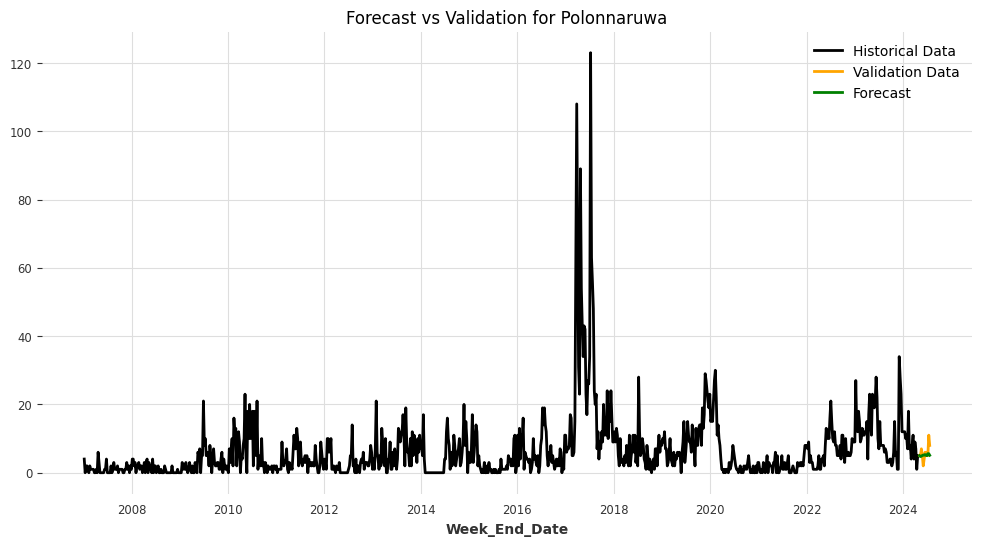

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_LinearRegressionModel.pkl


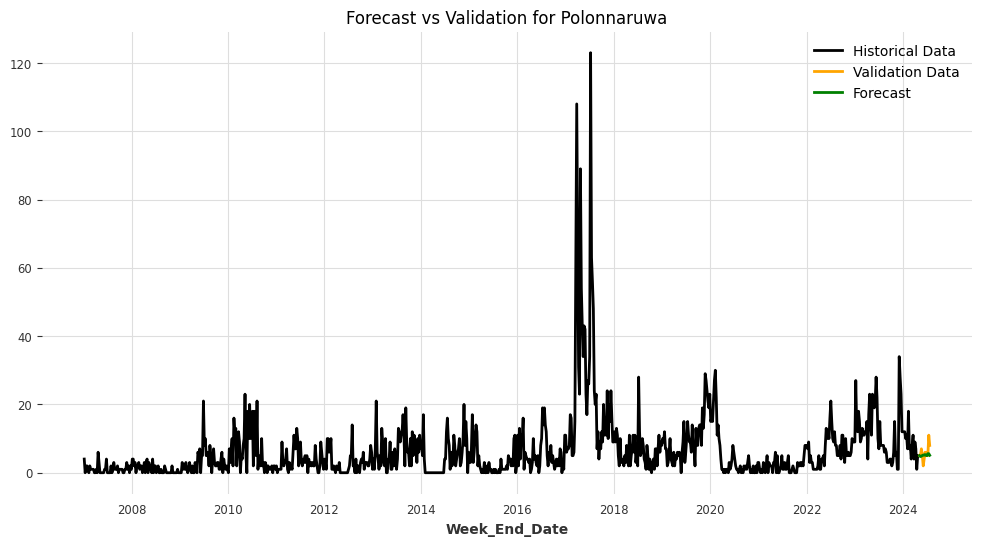

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_RandomForest.pkl


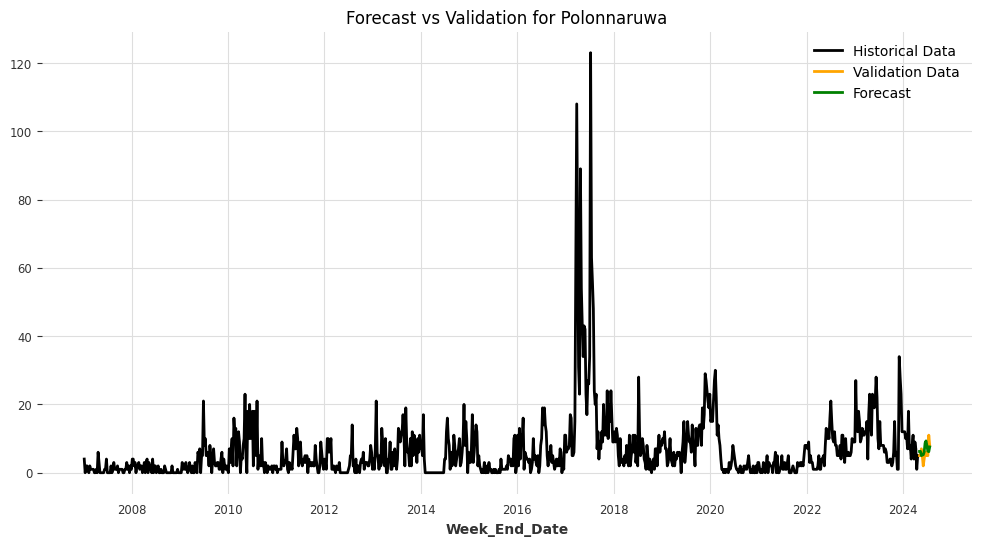

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 127
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 6.702735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

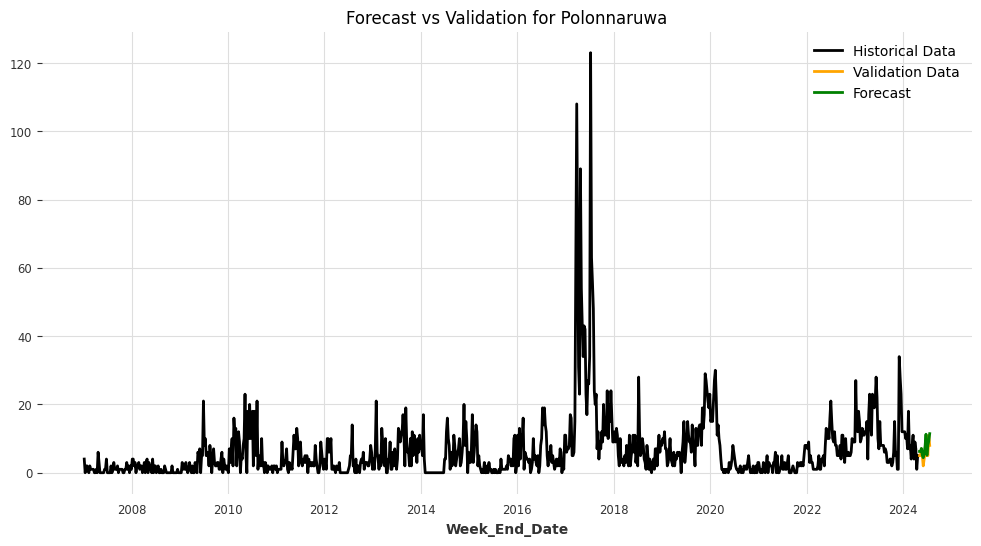

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_XGBModel.pkl


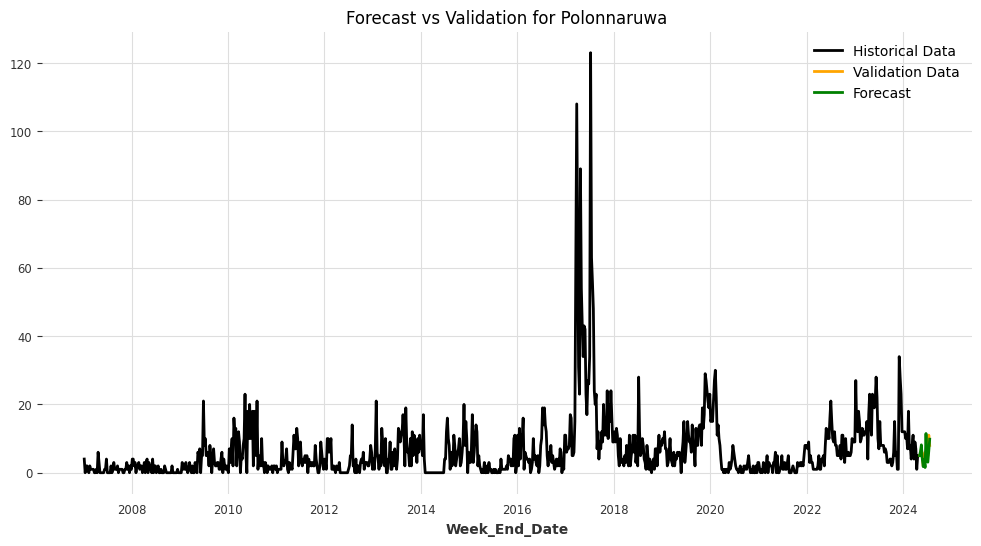

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_CatBoostModel.pkl


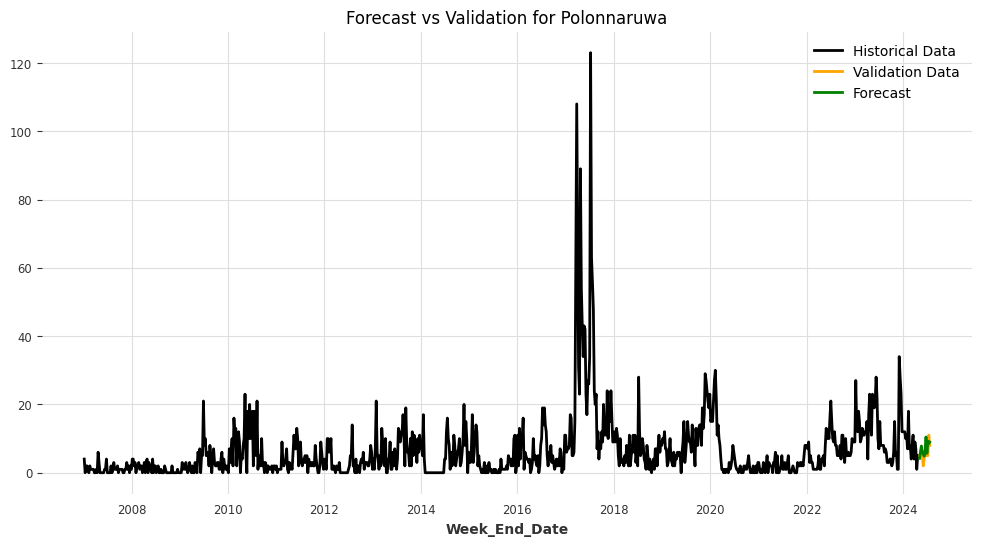

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_RegressionModel.pkl


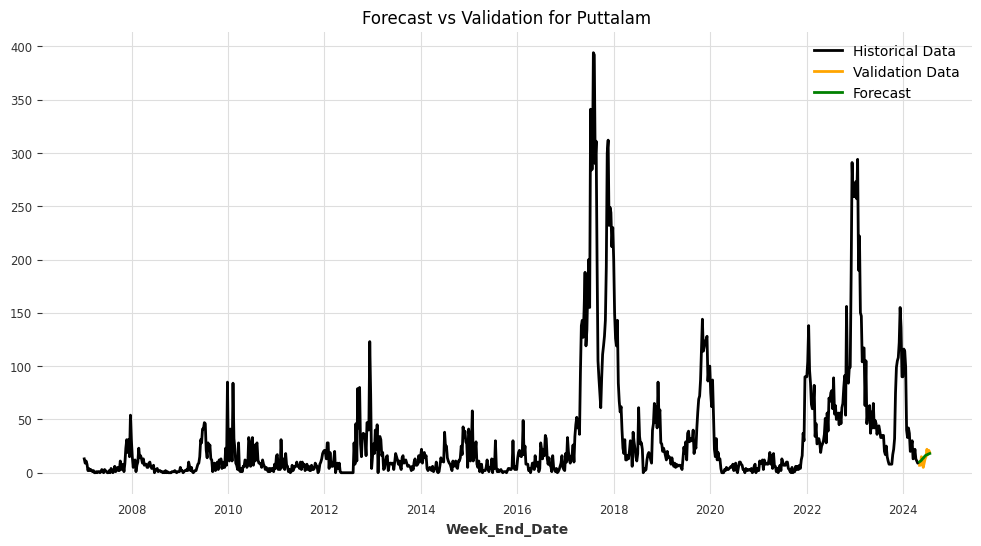

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_LinearRegressionModel.pkl


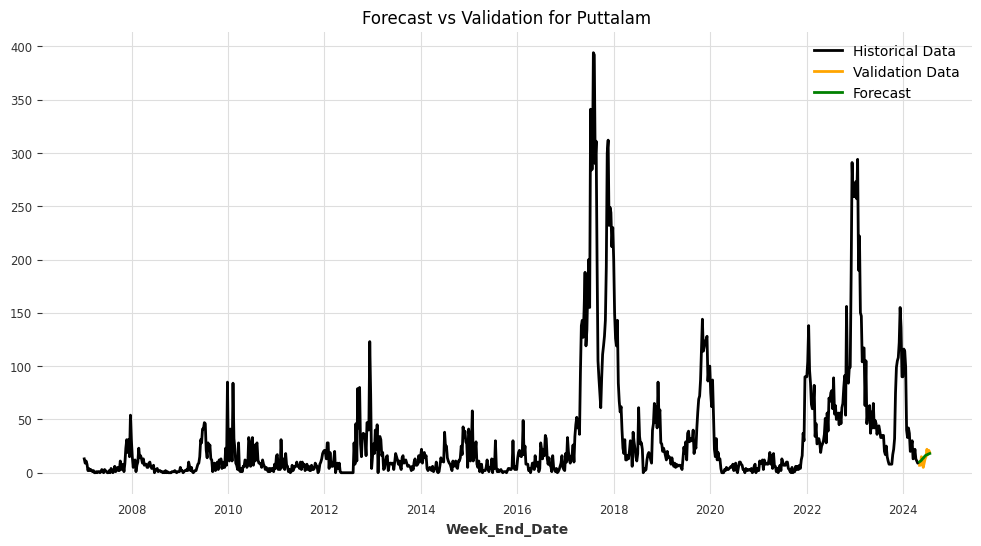

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_RandomForest.pkl


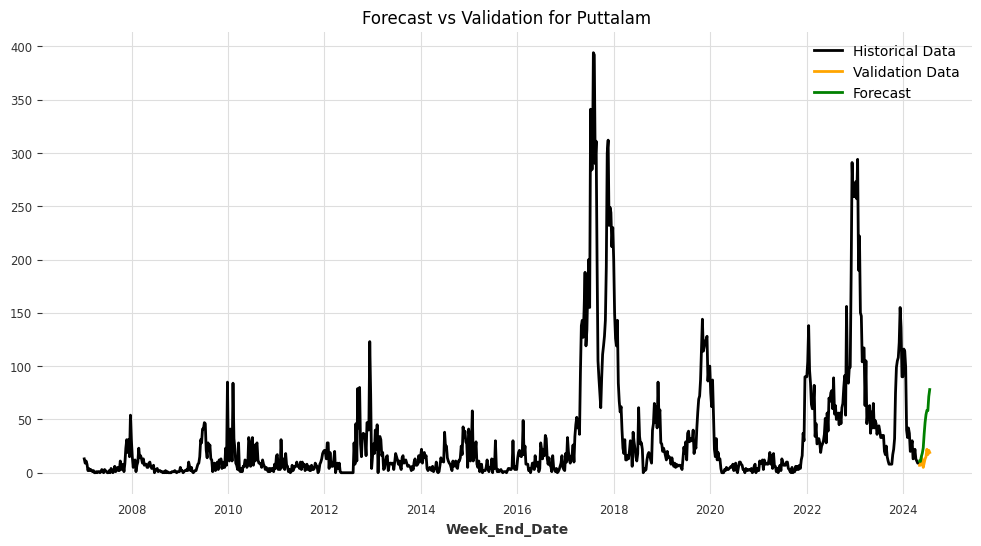

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 339
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 32.180737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 339
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 32.206897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto

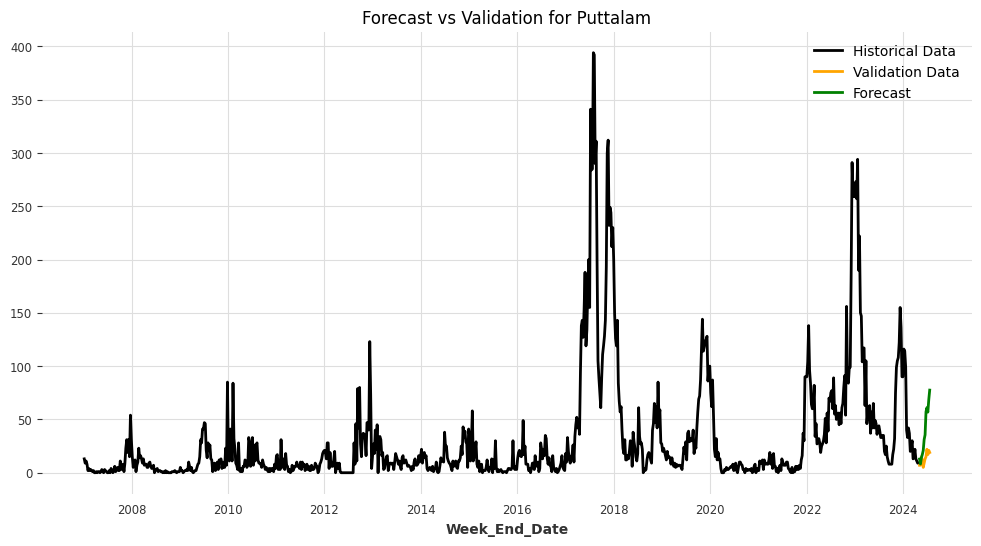

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_XGBModel.pkl


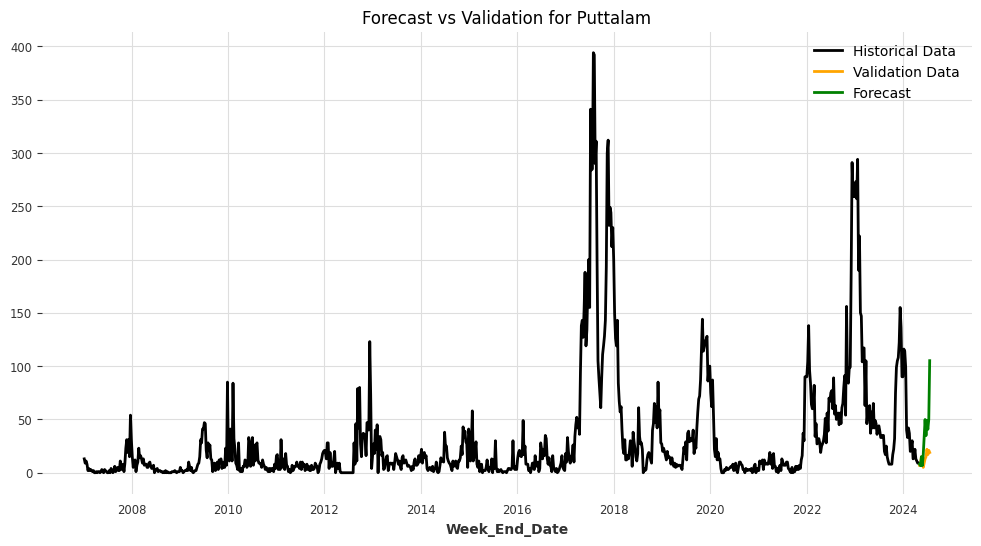

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_CatBoostModel.pkl


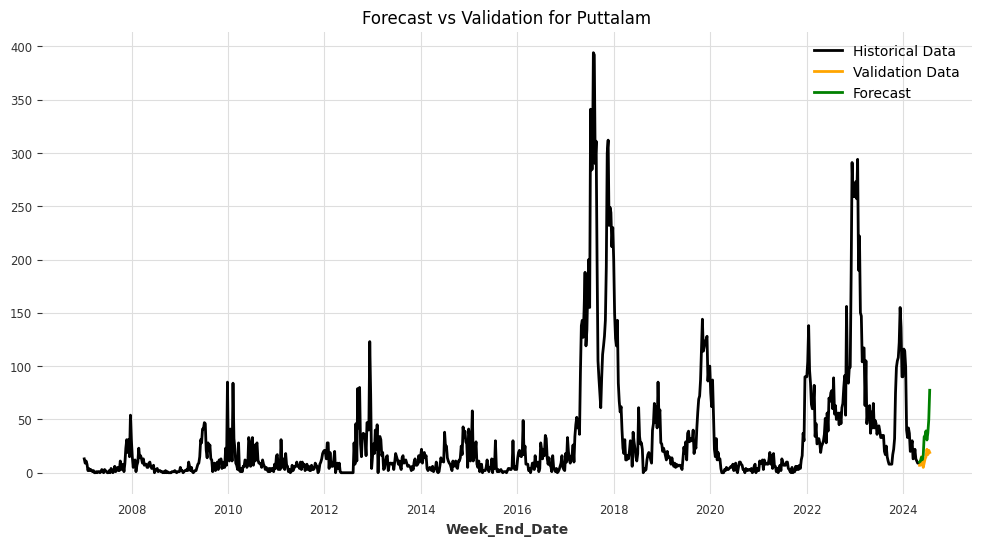

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_RegressionModel.pkl


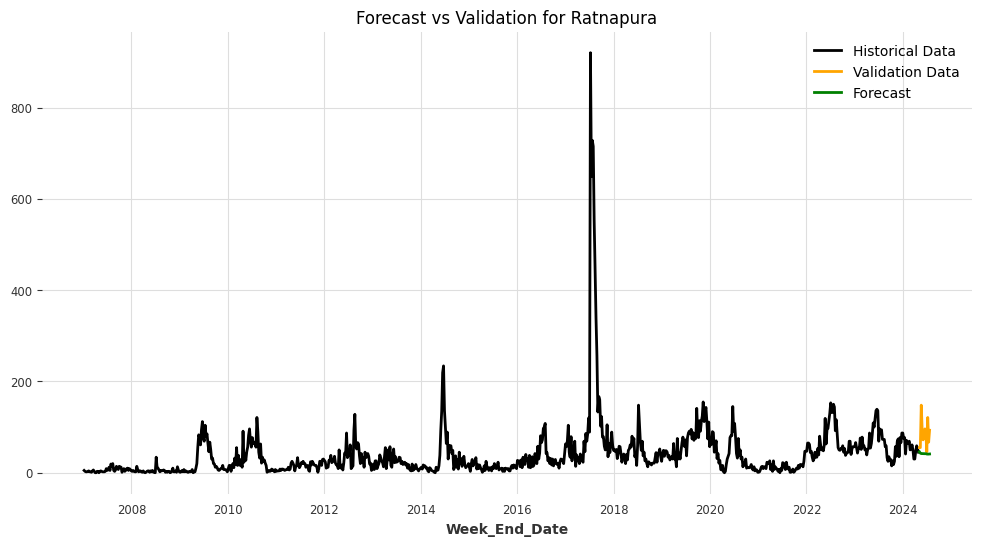

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_LinearRegressionModel.pkl


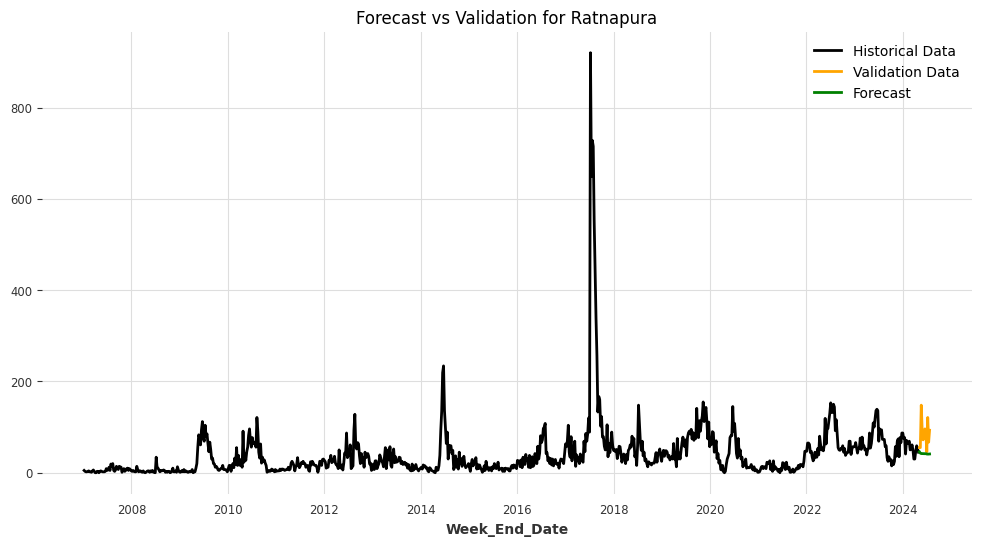

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_RandomForest.pkl


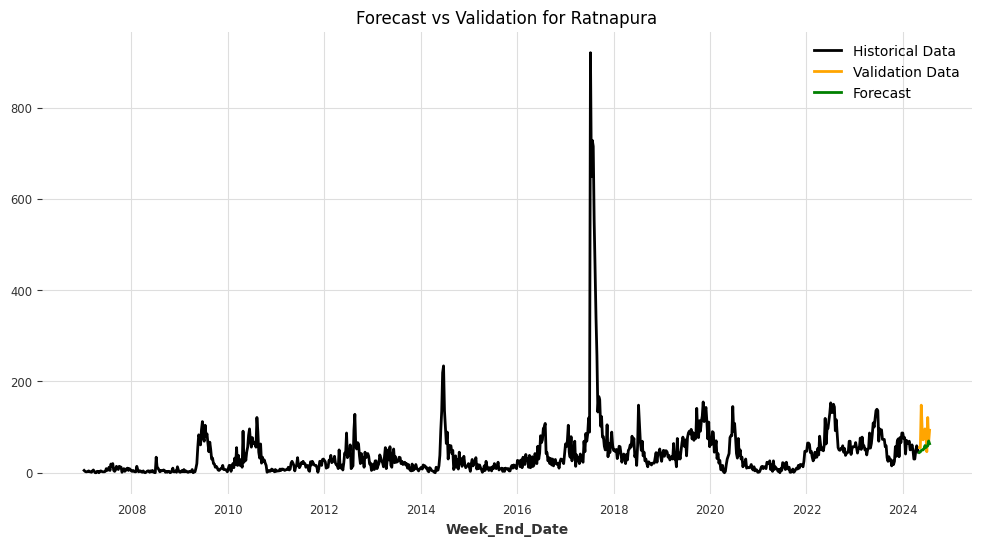

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000050 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 41.269917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 416
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 41.348395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

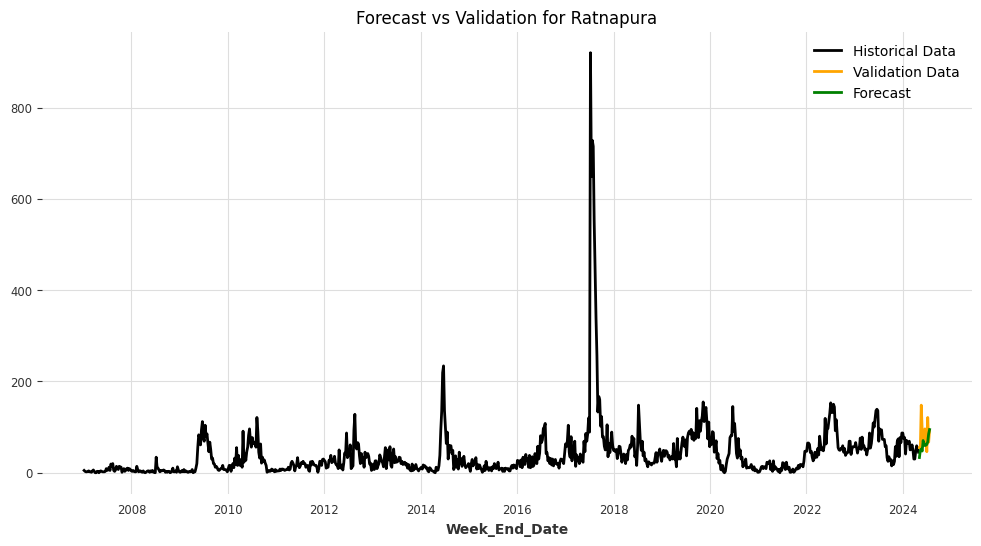

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_XGBModel.pkl


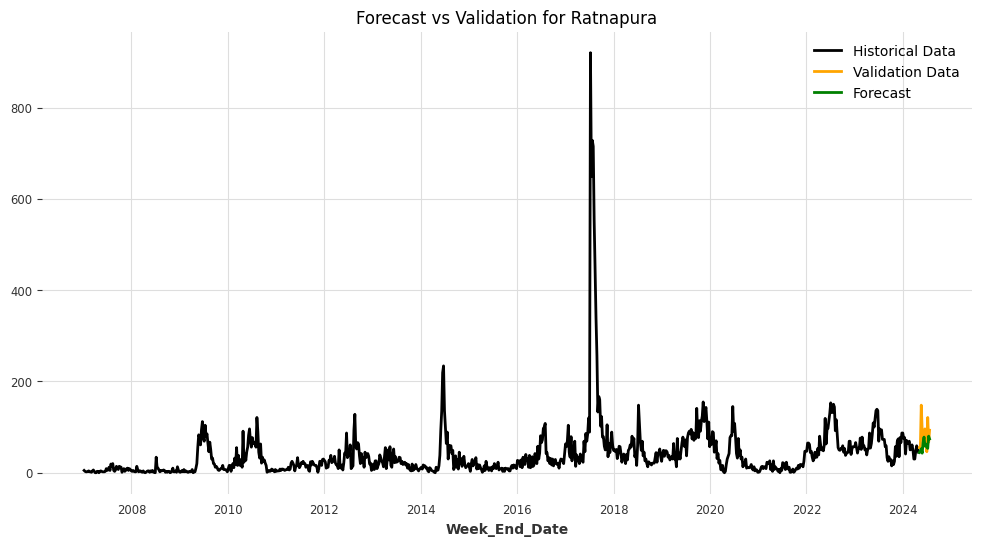

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_CatBoostModel.pkl


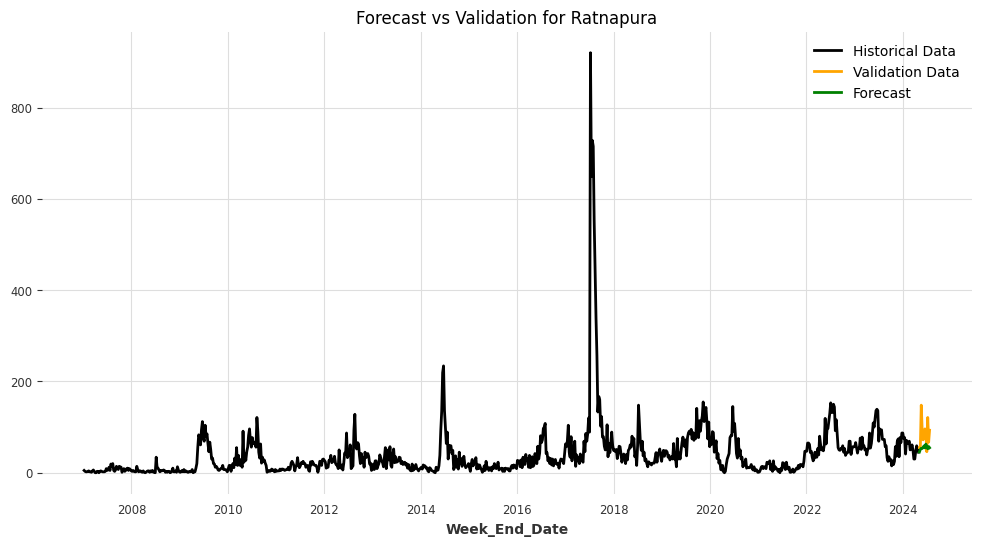

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_RegressionModel.pkl


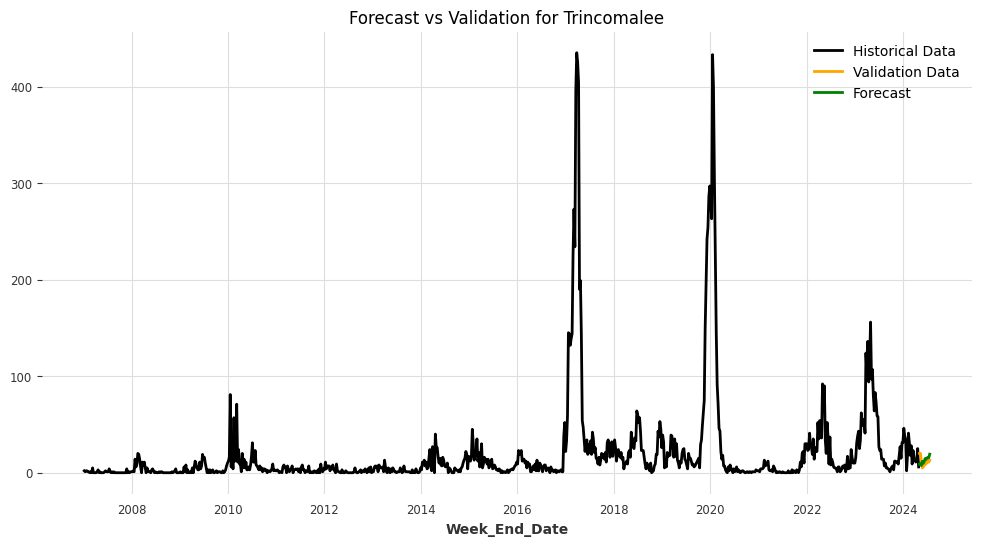

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_LinearRegressionModel.pkl


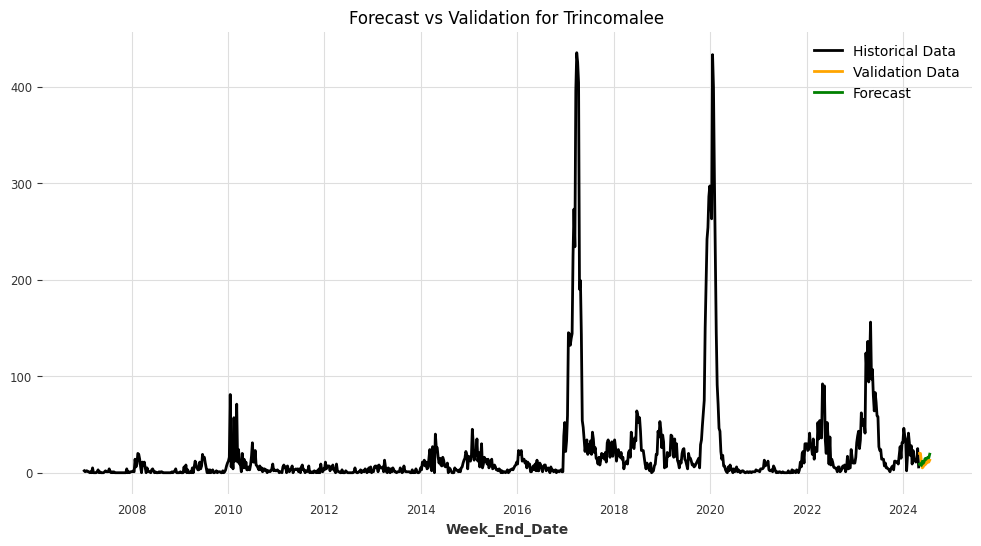

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_RandomForest.pkl


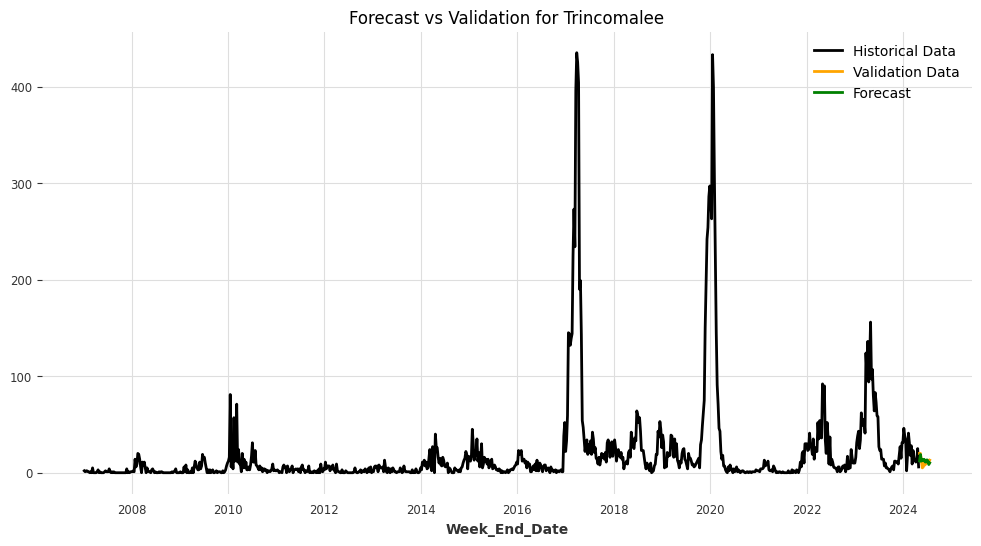

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 242
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 20.311534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

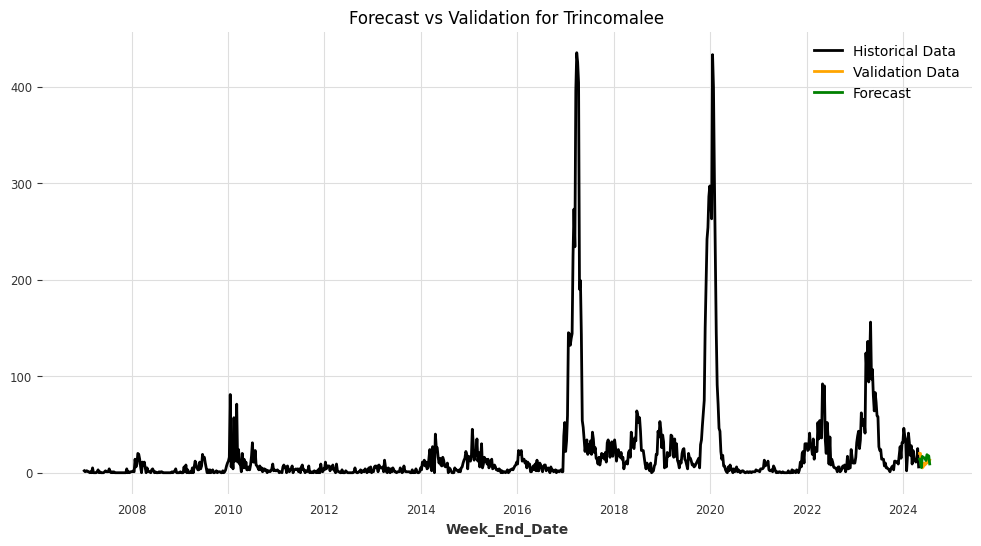

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_XGBModel.pkl


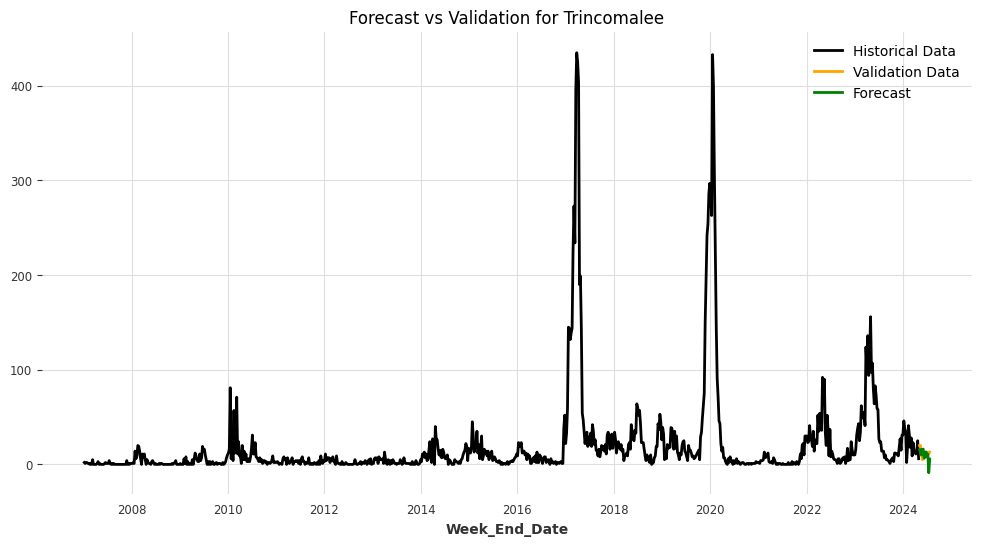

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_CatBoostModel.pkl


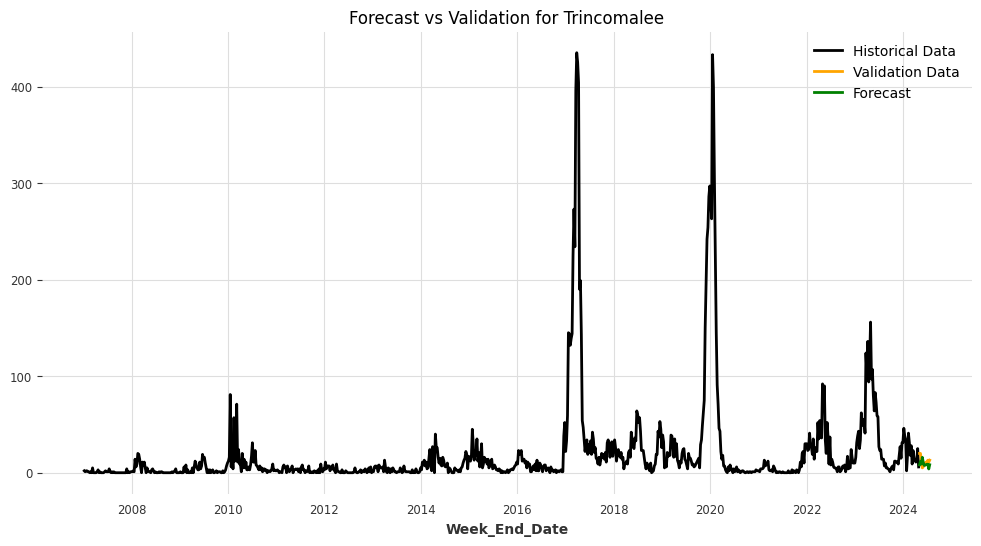

<ipython-input-38-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_RegressionModel.pkl


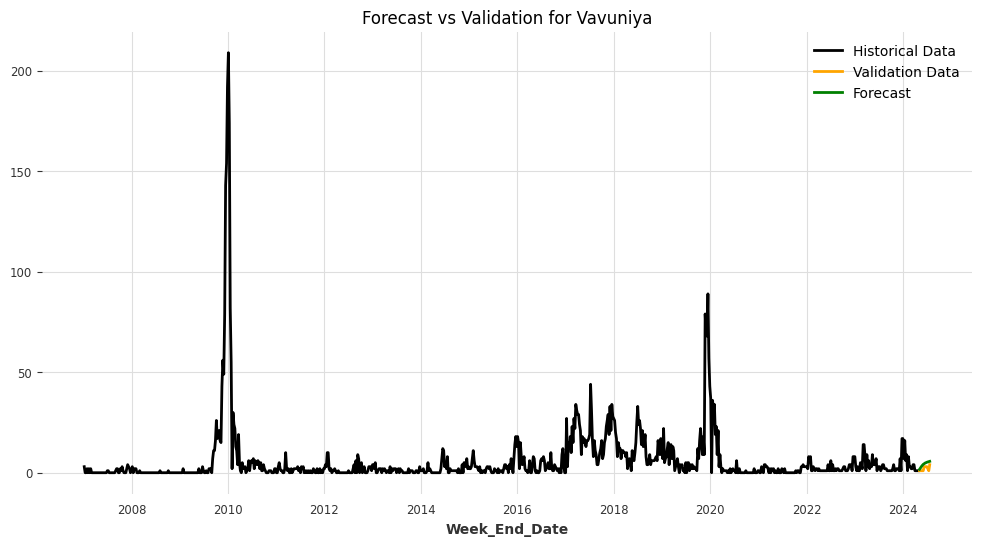

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_LinearRegressionModel.pkl


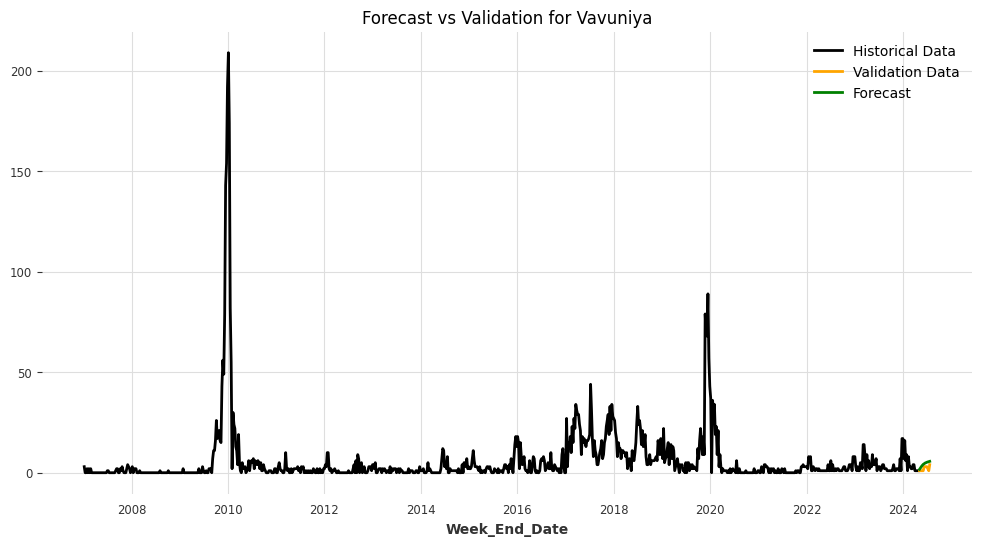

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_RandomForest.pkl


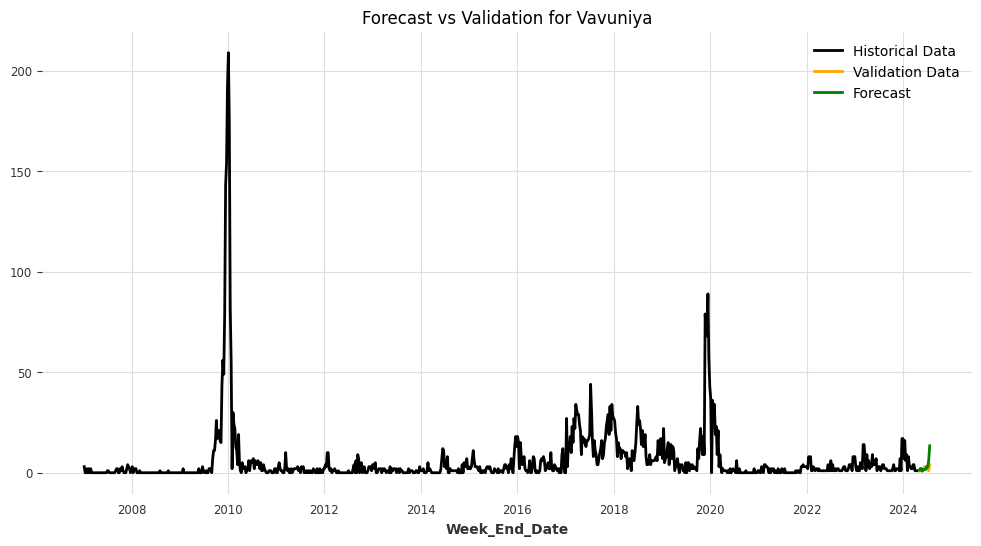

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 144
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4
[LightGBM] [Info] Start training from score 6.323424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

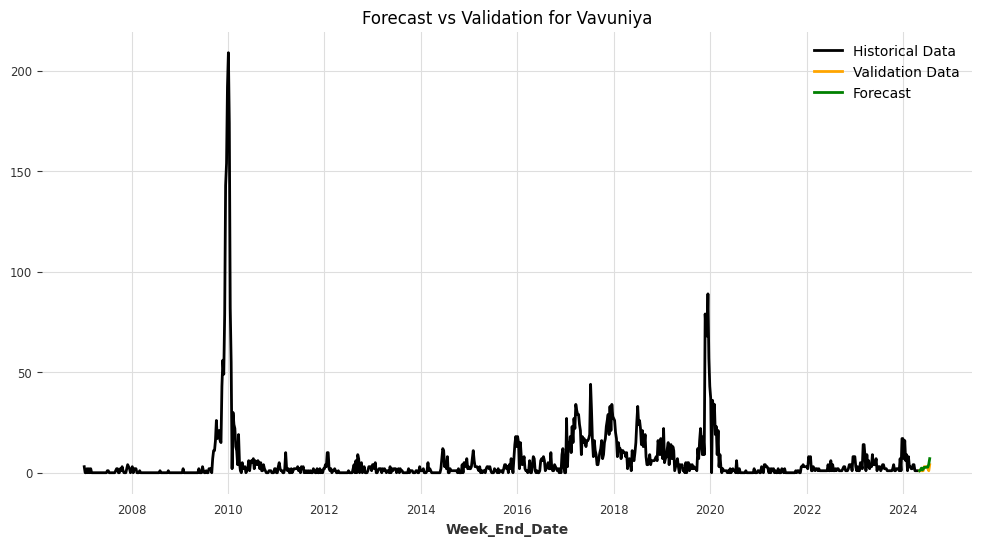

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_XGBModel.pkl


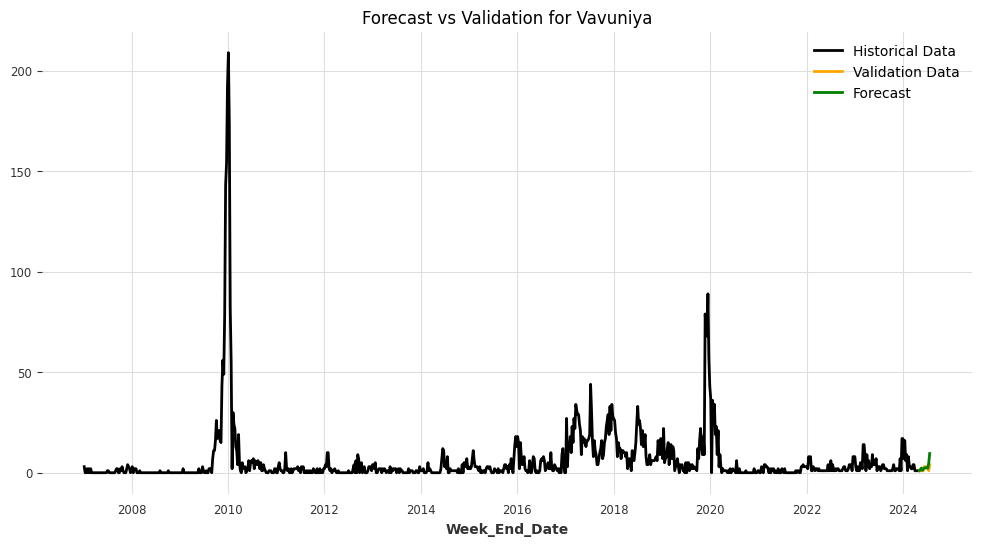

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_CatBoostModel.pkl


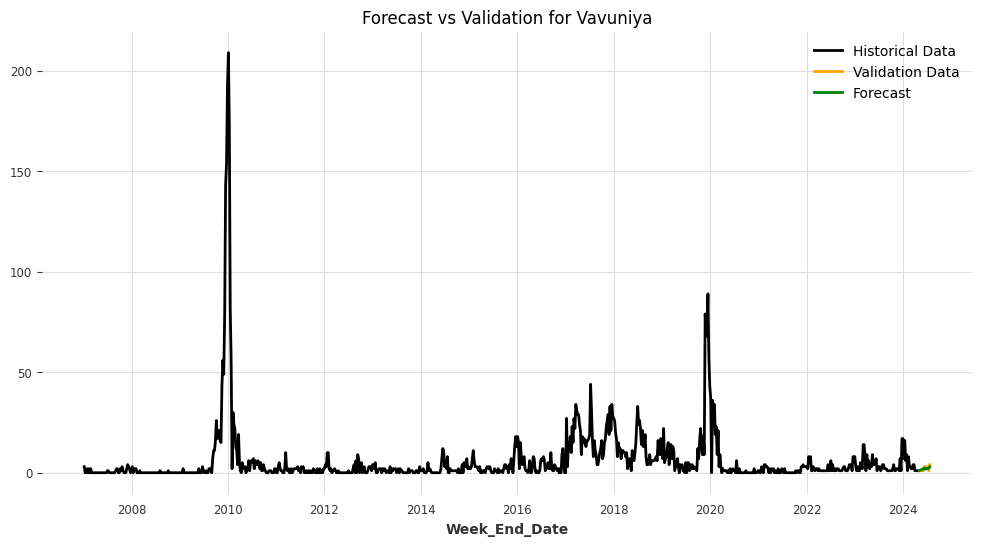

In [39]:
results = main(df, models)

## 6. Result

In [40]:
# Initialize a list to store metrics
metrics_list = []
districts = df['District'].unique()

# Iterate over results and extract metrics
for district_index, district_results in enumerate(results):
    for model_index, (forecast, metrics) in enumerate(district_results):
        metrics_list.append({
            'District': f'{districts[district_index]}',
            'Model': type(models[model_index]).__name__,
            'RMSE': metrics['RMSE'],
            'MAE': metrics['MAE'],
            'SMAPE': metrics['SMAPE'],
            'R2': metrics['R2'],
            'RMSLE': metrics['RMSLE']
        })

# Create a DataFrame from the metrics list
df_metrics = pd.DataFrame(metrics_list)
df_metrics.set_index(['District', 'Model'], inplace=True)

In [41]:
from IPython.display import display
from IPython.display import HTML

def display_district_metrics(df_metrics):
    districts = df_metrics.index.get_level_values('District').unique()

    for district in districts:
        print(f"Metrics for {district}:")
        district_df = df_metrics.loc[district]
        styled_df = district_df.style \
         .highlight_min(color="lightgreen", axis=0)

        display(styled_df)

# Example usage
display_district_metrics(df_metrics)


Metrics for Ampara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,8.021564,7.151428,55.866014,-1.293502,0.643280
LinearRegressionModel,8.021573,7.151438,55.866061,-1.293508,0.643281
RandomForest,7.843373,6.721667,52.624156,-1.192739,0.606365
LightGBMModel,13.488442,11.851525,71.941996,-5.484921,0.811598
XGBModel,11.607078,10.231342,67.193301,-3.802053,0.774459
CatBoostModel,8.960787,7.574542,55.355548,-1.862025,0.628415


Metrics for Anuradhapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,4.391062,3.580437,61.850471,-0.237862,0.758493
LinearRegressionModel,4.391059,3.580434,61.850443,-0.237861,0.758493
RandomForest,5.022878,3.815833,73.290692,-0.619715,0.771265
LightGBMModel,6.283128,4.756529,111.885083,-1.534457,1.421591
XGBModel,5.977513,4.524326,97.412670,-1.293899,0.940032
CatBoostModel,3.828257,2.996111,56.362900,0.059117,0.571540


Metrics for Badulla:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,9.539193,8.254936,71.682191,-3.001055,0.882669
LinearRegressionModel,9.539213,8.254952,71.682256,-3.001071,0.882670
RandomForest,13.830520,9.828333,67.715247,-7.410624,0.771588
LightGBMModel,9.358294,8.461533,71.462754,-2.850743,0.792864
XGBModel,18.740816,13.403289,78.032757,-14.442875,0.947726
CatBoostModel,12.190523,10.313178,76.649079,-5.534252,0.856380


Metrics for Batticaloa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,16.115973,14.297591,63.973065,-10.705897,0.741648
LinearRegressionModel,16.115963,14.297584,63.973058,-10.705882,0.741648
RandomForest,6.285925,5.314167,33.133213,-0.780861,0.375582
LightGBMModel,6.204322,5.068801,31.752485,-0.734923,0.365019
XGBModel,12.102447,10.090244,92.533141,-5.601430,1.167443
CatBoostModel,6.623454,5.945300,36.225378,-0.977246,0.383889


Metrics for Colombo:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,102.896806,82.766016,41.698162,-0.438962,0.488833
LinearRegressionModel,102.896805,82.766015,41.698162,-0.438962,0.488833
RandomForest,79.471377,64.632500,31.033005,0.141645,0.350062
LightGBMModel,58.720091,48.075518,23.031930,0.531382,0.266018
XGBModel,100.775007,81.694817,41.881798,-0.380229,0.501930
CatBoostModel,75.543642,61.794636,29.703830,0.224394,0.335060


Metrics for Galle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,9.771105,7.853747,26.562752,-0.045341,0.312146
LinearRegressionModel,9.771106,7.853747,26.562754,-0.045341,0.312146
RandomForest,9.420213,7.502500,25.090072,0.028390,0.304862
LightGBMModel,12.749945,10.214213,37.276328,-0.779866,0.445269
XGBModel,11.355307,9.834591,32.252219,-0.411785,0.355960
CatBoostModel,11.075405,9.169937,30.896596,-0.343043,0.348257


Metrics for Gampaha:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,46.995184,35.969026,36.580320,-0.567743,0.453370
LinearRegressionModel,46.995186,35.969029,36.580324,-0.567743,0.453370
RandomForest,55.789339,48.532500,58.811707,-1.209381,0.648975
LightGBMModel,49.820877,42.193183,48.670243,-0.761939,0.546622
XGBModel,54.862527,47.026864,57.338580,-1.136583,0.653398
CatBoostModel,47.878450,39.278812,42.486584,-0.627228,0.483723


Metrics for Hambantota:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,9.718593,8.991234,103.097167,-1.733310,1.361209
LinearRegressionModel,9.718606,8.991244,103.097202,-1.733317,1.361210
RandomForest,15.002463,14.162500,118.855905,-5.513392,1.604910
LightGBMModel,14.036471,12.248617,111.141792,-4.701616,1.552280
XGBModel,16.129714,13.270223,111.582407,-6.528968,1.566581
CatBoostModel,11.899954,10.545762,107.890076,-3.098007,1.430955


Metrics for Jaffna:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,36.727013,35.657612,109.987410,-31.486667,1.329760
LinearRegressionModel,36.727021,35.657620,109.987421,-31.486681,1.329760
RandomForest,89.097531,72.690000,127.594909,-190.190046,1.801275
LightGBMModel,31.291090,24.554868,82.815462,-22.581712,1.163388
XGBModel,49.693216,36.730158,99.775625,-58.474137,1.411879
CatBoostModel,51.739150,35.761267,93.551782,-63.472204,1.338538


Metrics for Kalutara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,17.568054,12.758777,26.114018,-0.154411,0.325656
LinearRegressionModel,17.568055,12.758778,26.114020,-0.154411,0.325656
RandomForest,18.023091,14.933333,29.864846,-0.214987,0.361266
LightGBMModel,20.766120,17.758980,33.345175,-0.612961,0.385503
XGBModel,19.391910,15.911624,30.060110,-0.406547,0.369818
CatBoostModel,14.142269,11.539866,23.186128,0.251914,0.275420


Metrics for Kandy:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,21.874062,15.295632,18.366086,-0.493321,0.249218
LinearRegressionModel,21.874065,15.295634,18.366088,-0.493321,0.249218
RandomForest,17.744668,12.176667,14.247933,0.017279,0.194124
LightGBMModel,23.691814,16.405518,19.775976,-0.751826,0.280395
XGBModel,24.216272,19.409269,21.852436,-0.830244,0.258068
CatBoostModel,21.091079,14.903780,18.256444,-0.388327,0.245510


Metrics for Kegalle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,11.674442,9.571383,26.951505,0.002078,0.310954
LinearRegressionModel,11.674445,9.571386,26.951514,0.002077,0.310954
RandomForest,13.580707,10.355000,29.071237,-0.350421,0.356526
LightGBMModel,13.008389,10.184279,27.820917,-0.239000,0.334565
XGBModel,14.672053,12.584931,36.852115,-0.576181,0.408310
CatBoostModel,13.290082,10.561480,29.660221,-0.293242,0.351718


Metrics for Kilinochchi:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,1.262579,1.160821,28.514890,-1.318700,0.252496
LinearRegressionModel,1.262506,1.160717,28.512359,-1.318429,0.252482
RandomForest,3.740113,3.223333,49.264269,-19.346824,0.502271
LightGBMModel,3.001388,2.544217,42.336761,-12.103027,0.447439
XGBModel,4.909063,4.007222,58.574538,-34.052938,0.631558
CatBoostModel,4.402683,3.212204,45.092703,-27.194356,0.546156


Metrics for Kurunegala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,13.033109,8.904765,27.204991,-0.828247,0.364885
LinearRegressionModel,13.033110,8.904767,27.204998,-0.828247,0.364885
RandomForest,12.155332,8.334167,25.750926,-0.590276,0.342659
LightGBMModel,15.620539,12.462827,43.418937,-1.626219,0.539697
XGBModel,17.769264,14.235405,51.772428,-2.398425,0.636960
CatBoostModel,16.517744,12.647807,41.575742,-1.936570,0.514115


Metrics for Mannar:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,3.101575,3.011366,60.446038,0.131507,0.555902
LinearRegressionModel,3.101576,3.011362,60.445963,0.131506,0.555903
RandomForest,3.137361,2.918333,59.913270,0.111350,0.556106
LightGBMModel,4.069504,3.340290,65.330633,-0.495150,0.734985
XGBModel,2.888508,2.253402,45.044981,0.246733,0.484194
CatBoostModel,3.369812,2.876285,55.666852,-0.025211,0.559944


Metrics for Matale:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,5.550019,4.699153,43.845628,0.187025,0.507838
LinearRegressionModel,5.550022,4.699154,43.845641,0.187024,0.507838
RandomForest,7.263509,5.788333,53.901045,-0.392455,0.576478
LightGBMModel,7.687035,6.220129,60.999077,-0.559574,0.636829
XGBModel,8.810303,7.000325,71.444676,-1.048659,0.818507
CatBoostModel,7.818502,6.039199,57.798248,-0.613375,0.648613


Metrics for Matara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,10.298832,8.153057,60.949545,-0.590989,0.820815
LinearRegressionModel,10.298835,8.153059,60.949564,-0.590990,0.820815
RandomForest,9.090786,7.485000,58.496163,-0.239636,0.701330
LightGBMModel,8.850147,7.456078,59.451179,-0.174877,0.659616
XGBModel,9.693615,8.509990,69.954424,-0.409493,0.755790
CatBoostModel,8.817580,7.712267,59.910919,-0.166246,0.684911


Metrics for Monaragala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,4.256844,3.115429,28.813144,-0.146478,0.353951
LinearRegressionModel,4.256847,3.115427,28.813125,-0.146480,0.353951
RandomForest,5.923496,4.731667,47.355712,-1.219966,0.530630
LightGBMModel,5.397067,4.730560,43.928063,-0.842917,0.473237
XGBModel,7.003307,6.108509,59.875812,-2.103106,0.738691
CatBoostModel,5.157190,4.393394,42.026292,-0.682738,0.449404


Metrics for Mullaitivu:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,1.015630,0.932063,59.794072,-6.426826,0.403537
LinearRegressionModel,1.015648,0.932082,59.794901,-6.427101,0.403543
RandomForest,0.880733,0.746012,47.434157,-4.584973,0.342290
LightGBMModel,0.567462,0.431859,44.244590,-1.318496,0.282717
XGBModel,1.210186,1.013290,69.667765,-9.544756,0.513034
CatBoostModel,0.883521,0.737908,47.578357,-4.620384,0.339067


Metrics for NuwaraEliya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,1.907868,1.525594,40.389949,0.043514,0.422418
LinearRegressionModel,1.907870,1.525595,40.389981,0.043512,0.422418
RandomForest,1.854579,1.360000,37.245180,0.096200,0.354717
LightGBMModel,2.264722,1.651211,41.627339,-0.347757,0.464897
XGBModel,1.941226,1.583569,52.608831,0.009774,0.482231
CatBoostModel,1.615573,1.288333,35.741551,0.314141,0.363834


Metrics for Polonnaruwa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,2.154492,1.456782,25.787554,-0.026765,0.318746
LinearRegressionModel,2.154497,1.456787,25.787645,-0.026771,0.318747
RandomForest,2.526244,2.124167,35.125813,-0.411666,0.361866
LightGBMModel,2.575593,2.008124,31.546080,-0.467358,0.341131
XGBModel,2.907484,2.142545,37.501159,-0.869891,0.438998
CatBoostModel,2.451745,1.833745,29.880693,-0.329634,0.353442


Metrics for Puttalam:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,4.025511,3.314173,27.819029,0.452234,0.350128
LinearRegressionModel,4.025509,3.314170,27.819012,0.452235,0.350128
RandomForest,32.844252,26.712500,86.272229,-35.464616,1.034584
LightGBMModel,31.477305,25.060793,82.309538,-32.492532,0.982960
XGBModel,31.682847,22.100483,72.939566,-32.931361,0.918306
CatBoostModel,23.374927,17.188486,66.588855,-17.469427,0.812632


Metrics for Ratnapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,51.468800,42.984340,61.559254,-2.406057,0.723433
LinearRegressionModel,51.468804,42.984344,61.559263,-2.406058,0.723433
RandomForest,41.552647,32.645000,42.484466,-1.220042,0.511635
LightGBMModel,38.472288,28.710859,37.253675,-0.903093,0.471876
XGBModel,39.881067,29.036931,36.738654,-1.045019,0.485230
CatBoostModel,41.218381,32.168038,41.307537,-1.184468,0.501291


Metrics for Trincomalee:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,6.239393,5.538093,46.098125,-0.955327,0.483541
LinearRegressionModel,6.239392,5.538076,46.098048,-0.955326,0.483541
RandomForest,4.381501,3.390000,30.750572,0.035770,0.388502
LightGBMModel,7.158096,6.664214,54.115239,-1.573534,0.579280
XGBModel,7.853955,5.904849,55.548125,-2.098215,0.510278
CatBoostModel,6.252233,5.149562,48.275613,-0.963383,0.549940


Metrics for Vavuniya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,2.454801,2.245707,77.031212,-4.165186,0.652064
LinearRegressionModel,2.454797,2.245702,77.031068,-4.165168,0.652063
RandomForest,3.267002,1.970917,60.736369,-8.148543,0.575699
LightGBMModel,1.396057,0.925898,37.903889,-0.670549,0.373739
XGBModel,2.071337,1.275925,44.139033,-2.677519,0.443109
CatBoostModel,0.811739,0.715428,37.345854,0.435211,0.271795


## 7. Conclusion
To assess each models we need to see the error metrics of each model and then we have to decide which model outperformed.

Note: `We also need to do backtesting to make sure model is performing as intended`